In this iPython notebook, we will featurize MOR ligand binding simulation by pairwise distances between the ligand and different receptor residues. We will then perform tICA and prospectively build an MSM. 

In [1]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

# changing matplotlib the default style
matplotlib.style.use('ggplot')
#matplotlib.rcParams["figure.facecolor"] = "white"
#matplotlib.rcPar|ams["savefig.transparent"] = "True"


In [2]:
import pandas as pd


from PDB_Order_Fixer import PDB_Order_Fixer
import mdtraj as md
import os
import numpy as np
import h5py

import datetime
import glob
import copy
from functools import partial 
import operator
import time

import random 
import subprocess
from subprocess import Popen
import sys
from custom_clusterer import *
from custom_tica import *
from custom_featurizer import *
from pdb_editing import *
from analysis import *
from io_functions import *
#from topology_fixing import *
from subsampling import *
from conversions import *
from custom_msm import *
from grids import *
from docking_analysis import *

from scipy import stats
import os
from efficacy_scripts import *




/home/enf/anaconda3/lib/python3.5/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


we are operating on biox3


In [3]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [4]:
from sklearn.preprocessing import scale

In [5]:
from detect_intermediates import *
from interpret_tICs import *

In [6]:
from msmbuilder.utils import verbosedump, verboseload


In [7]:
from mor_h8_feature_types import *
#from b2ar_feature_types import *
from get_variable_names import *
from mor_h8_tica_config import *
from residue import Residue, Atom

tm6_tm3_residues
[R279, R165]
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 273, 274, 275, 276, 277, 278,

In [8]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.preprocessing import scale
from random import shuffle
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc

In [9]:

ori_feature_name = copy.deepcopy(feature_name)

In [10]:
#schemes = ["closest-heavy", "CA"]
#feature_name = "%s-CA" %ori_feature_name

In [11]:
rho = 0.1
rho_string = "0pt1"
lag_time = 5
n_components = 10
n_clusters = 100

rho = 0.01
rho_string = "0pt01"
lag_time=50
ori_feature_name = copy.deepcopy(feature_name)

In [12]:
schemes = ["closest-heavy", "CA"]
feature_name = "%s-CA-py3-far" %ori_feature_name
#feature_name = "%s_phi_psi_chi2" %feature_name
(active_ref_dir, inactive_ref_dir, simulation_ref_dir, scripts_dir,
                    ligand_dir, agonist_dir, inverse_agonist_dir, biased_agonist_dir, ref_receptors_dir, whole_trajectory_pnas,
                    sasa_file) = get_base_files(base)

tica_dir = get_tica_dir(base, is_sparse, lag_time, n_components, feature_name, 
                                                                 wolf_string, shrinkage_string, rho_string)
#tica_dir = "%s-with-inactive" %tica_dir
tica_dir = "%s-backup" %tica_dir
ori_tica_dir = copy.deepcopy(tica_dir)
#tica_dir = "%s-normalized" % ori_tica_dir
features_dir = get_features_dir(base, feature_name)

landmarks_dir = get_landmarks_dir(tica_dir)
analysis_dir = get_analysis_dir(tica_dir, n_clusters, sampling_method)
gmm_dir = get_gmm_dir(tica_dir)
rf_dir = get_rf_dir(tica_dir)


ref_tica_dir, ref_tica_coords = get_ref_tica_dirs(tica_dir)

graph_file = get_graph_file(tica_dir, msm_lag_time, n_clusters)

pnas_titles =    ["tm6_tm3_dist", "rmsd_npxxy_inactive", "rmsd_npxxy_active", "rmsd_connector_inactive", "rmsd_connector_active"]
pnas_features_dir = analysis_dir


(clusterer_dir, msm_model_dir, macrostate_dir, features_known, model_dir, projected_features_dir,
                 projection_operator_dir, ktica_fit_model_filename, ktica_projected_data_filename, nystroem_data_filename,
                 mutual_information_csv, pearson_csv) = get_tica_files(base, tica_dir, n_clusters, msm_lag_time, n_macrostates)

(standardized_features_dir, feature_residues_csv, feature_residues_pkl,
                    contact_csv, ref_features_dir) = get_feature_files(features_dir)

(kmeans_csv, tica_coords_csv, features_csv, active_rmsd_dir, inactive_rmsd_dir, active_pnas_dir, inactive_pnas_joined, active_pnas_joined,
                clusters_map_file, ktica_clusters_map_file, analysis_file, combined_file, docking_summary, docking_joined, docking_z_scores_csv,
                aggregate_docking, aggregate_docking_joined, docking_pnas_joined, aggregate_docking_pnas, aggregate_docking_pnas_joined, docking_multiple_ligands,
                docking_distances_file, docking_pdf, mmgbsa_docking_distances, pnas_coords, mmgbsa_dir, mmgbsa_csv, mmgbsa_pdf, aggregate_mmgbsa,
                aggregate_mmgbsa_joined, aggregate_mmgbsa_pnas_joined, mmgbsa_z_scores_csv, active_clusters_csv, intermediate_clusters_csv,
                inactive_clusters_csv, pnas_clusters_averages, tica_clusters_averages, tica_classes_csv, tica_samples_csv, subgraph_save_base,
                degree_save_base, degree_map_csv, degree_z_map_csv, aggregate_docking_pnas_degree_z_joined, tic_residue_csv, feature_coefs_csv,
                duplicated_feature_coefs_csv) = get_analysis_files(analysis_dir, n_clusters, tica_dir, tica_dir, sampling_method, n_samples, precision,
                                                                                                                     msm_lag_time)

(inactive_pnas_distances_dir, active_pnas_distances_dir, active_pnas_all_distances_dir,
                    inactive_pnas_distances_new_csv, active_pnas_distances_new_csv, active_pnas_joined, active_pnas_means, pnas_coords_dir,
                    pnas_coords_csv, pnas_all_coords_csv, pnas_coords_hexbin_dir, pnas_coords_co_crystallized_docking_dir,
                    pnas_coords_active_colors_dir, user_defined_features_file, reaction_coordinates_trajs_file) = get_pnas_files(whole_trajectory_pnas, pnas_features_dir)

features_dir = get_features_dir(base, feature_name)



graph_file = get_graph_file(tica_dir, msm_lag_time, n_clusters)
(scripts_dir, pymol_fixpdb_dir) = get_script_dir(scripts_dir)
(save_dir, reimaged_dir, mae_dir, combined_reimaged_dir, grid_dir, docking_dir) = get_docking_dirs(tica_dir, n_clusters, n_components, n_samples, sampling_method, precision)



/home/enf/md_simulations/MOR/h8_reimaged/featuresall_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far
/home/enf/md_simulations/MOR/h8_reimaged/featuresall_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far


In [13]:
import multiprocessing as mp
mp.cpu_count()

12

In [565]:
from ipyparallel import Client
rc = Client()
print(len(rc.ids))
dview = rc[:]
dview.map(os.chdir, ['/home/enf/b2ar_analysis/conformation']*len(rc.ids))

234


<AsyncMapResult: chdir>

In [359]:
from imp import reload
import analysis
reload(analysis)
from analysis import *

import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

precision = "XP"

reference_docking_dir = "/home/enf/md_simulations/MOR/h8_reimaged/reference_docking/docking_%s" %precision

ligand_df = pd.read_excel("/home/enf/md_simulations/MOR/docking/mu_receptor_ligands_1.xlsx")
ligand_df = ligand_df[["smiles", "ligand", "action", "affinity_median"]]

import re
ligand_names = ligand_df["ligand"].values.tolist()
new_ligand_names = [re.sub('[^\w\-_\. ]', '_', name) for name in ligand_names]
new_ligand_names = [n.lower().strip() for n in new_ligand_names]
ligand_df["ligand"] = new_ligand_names
web_ligand_df = copy.deepcopy(ligand_df)

In [328]:
ligand_df

,smiles,ligand,action,affinity_median
0,CCC1CN(CC2CC2)C2C(C1c1cc(O)ccc1C2=O)C,ethylketocyclazocine,Full agonist,9.50
1,CC[C@]12CCN([C@@H](C2(C)C)Cc2c1cc(O)cc2)CC1(O)CC1,_-_-bremazocine,Antagonist,9.70
2,Oc1ccc2c(c1)[C@]1(C)CCN([C@@H](C2)C1C)CC1CC1,_-_-cyclazocine,Partial agonist,10.00
3,CCC(=O)C(c1ccccc1)(c1ccccc1)C[C@H](N(C)C)C,_-_-methadone,Full agonist,9.20
4,CC(=CCN1CC[C@@]2([C@H]([C@H]1Cc1c2cc(cc1)O)C)C)C,_-_-pentazocine,Partial agonist,8.40
5,Oc1ccc(cc1)C[C@@H](C(=O)N[C@@H](C(=O)NCC(=O)N[C@H](C(=O)N[C@@H](C(=O)O)CC(C)C)Cc1ccccc1)C)N,DADLE,Full agonist,8.70
6,OC[C@H](C(=O)NCC(=O)N[C@H](C(=O)N[C@H](C(=O)N[C@H](C(=O)O)[C@H](O)C)CC(C)C)Cc1ccccc1)NC(=O)[C@H](Cc1ccc(cc1)O)N,DSLET,Full agonist,8.20
7,CO[C@]12CC[C@]3(C[C@@H]1C(O)(C)C)[C@@]14[C@H]2Oc2c4c(C[C@H]3N(C(C1[3H])[3H])CC1CC1)ccc2O,__sup_3__sup_H_diprenorphine,Antagonist,10.10
8,O=C(CNC(=O)C(Cc1ccc(cc1)O)N)NCC(=O)NC(C(=O)NC(C(=O)O)CC(C)C)Cc1ccccc1,_Leu_enkephalin,Partial agonist,8.10
9,CSCC[C@@H](C(=O)O)NC(=O)[C@H](Cc1ccccc1)NC(=O)CNC(=O)CNC(=O)[C@H](Cc1ccc(cc1)O)N,_Met_enkephalin,Full agonist,9.20


In [15]:
ligand_df = pd.read_table("/home/enf/md_simulations/MOR/docking/geneid_4988_bioactivity.txt")
#ligand_df = ligand_df.loc[(ligand_df["BioAssay Name"].str.contains("calcium"))]#  ("Agonist activity at human mu opioid receptor expressed in HEK293 cells assessed as inhibition of forskolin-stimulated cAMP accumulation by fluorescence assay")]
ligand_df = ligand_df.loc[(~ligand_df["BioAssay Name"].str.contains("arrestin")) & (~ligand_df["BioAssay Name"].str.contains("Counter"))  & (~ligand_df["BioAssay Name"].str.contains("hetero"))]# &(~ligand_df["BioAssay Name"].str.contains("calcium")) & (~ligand_df["BioAssay Name"].str.contains("recombinant")) & (ligand_df["BioAssay Name"].str.contains("GTP"))].sort("AC Value (micromolar)", ascending=False, inplace=False).iloc[30:]
ligand_df = ligand_df.loc[(ligand_df["Activity"].str.contains("Active")) | ligand_df["Activity"].str.contains("Inactive")]
ligand_df["ligand"] = ["SID_%d" %sid for sid in ligand_df.SID.values.tolist()]
ligand_df["index"] = ligand_df["ligand"]
ligand_df = ligand_df.loc[ligand_df["AC Value (micromolar)"].dropna().index]
print(ligand_df.shape)
#ligand_df

(502, 17)


In [16]:
wiki_mor_df_file = "/home/enf/md_simulations/MOR/docking/wiki_mor_df.pkl"
with open(wiki_mor_df_file, "rb") as f:
    ligand_df = pickle.load(f)
ligand_df["ligand"] = ligand_df["name"]

FileNotFoundError: [Errno 2] No such file or directory: '/home/enf/md_simulations/MOR/docking/wiki_mor_df_sush.pkl'

In [190]:
test_df

,Unnamed: 0,name,action,ligand,Unnamed: 4,Unnamed: 5,Edits,Unnamed: 7,smiles,fp
betahydroxythiofentanyl,31,Betahydroxythiofentanyl,agonist,Betahydroxythiofentanyl,NaN,NaN,agonist,NaN,NaN,"37758979, 128, 8388608, 18, 0, 12582912, 0, 0, 393216, 75840, 0, 0, 0, 0, 0, 0"
c-8813,39,C-8813,agonist,C-8813,NaN,NaN,agonist,NaN,NaN,"37767170, 0, 0, 0, 0, 12587008, 0, 0, 393216, 8256, 0, 0, 0, 0, 0, 0"
dimethylaminopivalophenone,73,Dimethylaminopivalophenone,agonist,Dimethylaminopivalophenone,NaN,NaN,agonist,NaN,NaN,"37748745, 65536, 0, 0, 256, 0, 0, 0, 1073872896, 8256, 0, 0, 0, 0, 0, 0"
dioxaphetyl_butyrate,75,Dioxaphetyl butyrate,agonist,Dioxaphetyl butyrate,NaN,NaN,agonist,NaN,NaN,"37781515, 0, 9437184, 0, 0, 0, 0, 0, 393216, 8256, 0, 0, 0, 0, 0, 0"
"6,14-endoethenotetrahydrooripavine",83,"6,14-Endoethenotetrahydrooripavine",agonist,"6,14-Endoethenotetrahydrooripavine",NaN,NaN,agonist,NaN,NaN,"37912602, 0, 0, 0, 0, 256, 0, 0, 6684672, 8259, 0, 0, 0, 0, 0, 0"
14-methoxydihydromorphinone,132,14-Methoxydihydromorphinone,agonist,14-Methoxydihydromorphinone,NaN,NaN,agonist,NaN,NaN,"37912586, 65536, 0, 0, 0, 256, 0, 0, 6684672, 337984, 0, 0, 0, 0, 0, 0"
alpha-methylacetylfentanyl,134,Α-Methylacetylfentanyl,agonist,Α-Methylacetylfentanyl,NaN,NaN,agonist,NaN,CC(CC1=CC=CC=C1)N2CCC(CC2)N(C3=CC=CC=C3)C(=O)C,"37748739, 0, 8388608, 18, 0, 0, 0, 0, 393216, 75840, 0, 0, 0, 0, 0, 0"
alpha-methylfentanyl,141,Α-Methylfentanyl,agonist,Α-Methylfentanyl,NaN,NaN,agonist,NaN,NaN,"37748739, 0, 8388608, 18, 0, 0, 0, 0, 393216, 75840, 0, 0, 0, 0, 0, 0"
methylketobemidone,143,Methylketobemidone,agonist,Methylketobemidone,NaN,NaN,agonist,NaN,NaN,"37748747, 65536, 0, 0, 0, 256, 0, 0, 393216, 75840, 0, 0, 0, 0, 0, 0"
mitragynine_pseudoindoxyl,149,Mitragynine pseudoindoxyl,agonist,Mitragynine pseudoindoxyl,NaN,NaN,agonist,NaN,NaN,"2185363463, 65536, 9437696, 0, 832, 0, 0, 0, 1080426496, 290880, 0, 0, 0, 0, 0, 0"


In [231]:
wiki_mor_df_file = "/home/enf/md_simulations/MOR/docking/wiki_mor_df_sush.csv"
full_ligand_df = pd.read_csv(wiki_mor_df_file, header=0)
full_ligand_df.name = [n.lower().strip().replace(" ", "_").replace("β", "beta").replace("α", "alpha").replace("Α", "alpha") for n in full_ligand_df.name.values]
full_ligand_df.index = full_ligand_df.name

full_ligand_df = add_smiles_column(full_ligand_df, names=full_ligand_df.index, cids=None, sids=None, binding_db=None,
                                                worker_pool=dview, parallel=False)

ligand_dir = "/home/enf/md_simulations/MOR/docking/ligands"
ligand_files = get_trajectory_files(ligand_dir, ".sdf") + get_trajectory_files(ligand_dir, ".mol")
ligand_files_clean = [n.split(".")[0].split("/")[-1].lower().strip() for n in ligand_files]

In [232]:
removed_ligands = []
sdf_files = []
sdf_ligands = []

for ligand in full_ligand_df.index:
    if (len(str(full_ligand_df["smiles"].loc[ligand])) > 4):
        continue
    else:
        try:
            sdf_file = ligand_files[ligand_files_clean.index(ligand)]
            sdf_files.append(sdf_file)
            sdf_ligands.append(ligand)
        except:
            removed_ligands.append(ligand)


In [233]:
sdf_files

['/home/enf/md_simulations/MOR/docking/ligands/betahydroxythiofentanyl.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/c-8813.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/dimethylaminopivalophenone.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/dioxaphetyl_butyrate.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/6,14-endoethenotetrahydrooripavine.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/14-methoxydihydromorphinone.mol',
 '/home/enf/md_simulations/MOR/docking/ligands/alpha-methylfentanyl.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/methylketobemidone.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/mitragynine_pseudoindoxyl.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/14-phenylpropoxymetopon.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/propylketobemidone.mol',
 '/home/enf/md_simulations/MOR/docking/ligands/prosidol.sdf',
 '/home/enf/md_simulations/MOR/docking/ligands/r-4066.sdf',
 '/home/enf/md_simulations/MOR/docking/ligan

In [246]:
smiles_list = convert_sdfs_to_smiles(sdf_files, parallel=False, worker_pool=None)
full_ligand_df["smiles"].loc[sdf_ligands] = smiles_list
full_ligand_df = full_ligand_df.loc[[n for n in full_ligand_df.index.values if n not in removed_ligands]]

In [252]:
import pybel

mols = [pybel.readstring("smi", x) for x in full_ligand_df.smiles]
fps = [x.calcfp(fptype='FP4') for x in mols] # Calculate their fingerprints
full_ligand_df["fp"] = fps
print(full_ligand_df.loc["fentanyl"]["fp"] | full_ligand_df.loc["carfentanil"]["fp"])
#ligand_df["ligand"] = ligand_df["name"]

0.9285714285714286


In [ ]:
from pubchempy import get_compounds, Compound, Substance
cmp = ligand_df.name.values[238]
cmp = cmp.replace("β", "beta")
#for grk in greek_alphabet.keys():
#    cmp.replace(grk, greek_alphabet[grk])
#cmp = cmp.decode("utf-8").replace(u"\xce\xb2", "beta")
#print(cmp)
##cmp.decode('utf-8')
cs = get_compounds(cmp, 'name')
print(cs)

In [107]:
names = ligand_df.name.values.tolist()
new_names = []
for name in names:
    if "β" in name or "α" in name:
        new_names.append(name.replace("β", "beta").replace("α", "alpha"))
print(new_names)
print(len(new_names))

['6beta-Naltrexol', '6beta-Naltrexol-d4', 'alpha-Gliadin', 'beta-Chlornaltrexamine', 'beta-Funaltrexamine']
5


In [54]:
"6β-Naltrexol".encode("utf")

b'6\xce\xb2-Naltrexol'

In [23]:
#import grids
#reload(grids)
from grids import *

precision = "XP"

ref_receptors_dir = "/home/enf/md_simulations/MOR/bu72_ref_receptors/conformation"
active_ref_dir = "%s/bu72_ionized_pymol_RL_conformation.pdb" %ref_receptors_dir
inactive_ref_dir = "%s/bu72_aligned_4DKL_R_L_conformation.pdb" %ref_receptors_dir

base_docking_dir = "/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components10all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_regularization_wolf_autoShrinkage0pt01-backup/docking_100clusters"
ligands_dir = "/home/enf/md_simulations/MOR/docking/ligands"
grid_dir = "%s/grids" %base_docking_dir
docking_dir = "%s/docking_%s" %(base_docking_dir, precision)

In [24]:

%load_ext autoreload
%autoreload 2

In [28]:
from importlib import reload
import analysis
reload(analysis)
from analysis import *

precision = "XP"
ref_df, poses_df = analyze_docking_results_multiple("/home/enf/md_simulations/MOR/docking/reference_docking_%s" %precision, precision, "/home/enf/md_simulations/MOR/docking/reference_docking_%s/summary.pkl" %precision, worker_pool=dview, 
ligands=None, poses_summary=None, redo=True, reread=True,
write_to_disk=True)

ref_df = ref_df[[n for n in ref_df.columns if "cluster" not in n]]
ref_df[ref_df.columns] = np.nan_to_num(ref_df[ref_df.columns].values)

Analyzing docking results
/home/enf/md_simulations/MOR/docking/reference_docking_XP
Obtaining docking scores now...
Obtained ligand arguments.
Examined all ligands.
Parsed all log files.


In [27]:
ref_df.shape

(27, 970)

In [475]:
import analysis
from importlib import reload
reload(analysis)
from analysis import *


docking_df, poses_df = analyze_docking_results_multiple(docking_dir, precision, "%s/summary.pkl" %docking_dir, 
ligands=None, poses_summary=None, redo=False, reread=True,
write_to_disk=True, worker_pool=dview, parallel=True)

#docking_df, poses_df = analyze_docking_results_in_dir(docking_dir, ligands_dir, write_to_disk=True, redo=True)
docking_df[docking_df.columns] = np.nan_to_num(docking_df[docking_df.columns].values)
zeros_per_row = (docking_df == 0).sum(axis=1)
docking_df = docking_df.loc[zeros_per_row < 5]
#where_zeros = np.where(docking_df.values == 0)
#for row_index in where

#keep_cols = []
#for drug in docking_df.index:
#    if np.where(docking_df.loc[column].values == 0).shape[0] < 3:
#        keep_cols.append(col)
#docking_df = docking_df[keep_cols]


In [476]:
docking_df.shape

(3237, 102)

In [477]:
full_docking_df = copy.deepcopy(docking_df)
#full_docking_df = pd.concat([ref_df, docking_df[[c for c in docking_df.columns.values.tolist() if "cluster" in c]]], axis=1)
full_docking_df[full_docking_df.columns] = np.nan_to_num(full_docking_df[full_docking_df.columns].values)
new_names =  [n.replace("cluster", "State ").replace("_sample0", "") for n in full_docking_df.columns.values.tolist()]
new_names = ["Inactive Crystal", "Active Crystal"] + new_names[2:]
full_docking_df.columns = new_names
full_docking_df.index = [n.lower().strip().replace(" ", "_").replace("β", "beta").replace("α", "alpha").replace("Α", "alpha") for n in full_docking_df.index.values]
full_docking_df = full_docking_df.groupby(full_docking_df.index).first()



In [360]:
import os
reload(os)
ligand_df_file = "/home/enf/md_simulations/MOR/docking/Machine_Learning_Sush_10.9.2016-edited.xlsx"
ligand_df = pd.read_excel(ligand_df_file, index_col=0)
docked_compounds = [n for n in full_docking_df.index.values if "comp" in n.lower() or "mpd" in n.lower()]
old_index = full_docking_df.index.values.tolist()
old_index = [n.lower().strip() for n in old_index]
sk_compounds = ["compd0%d" %i for i in range(1,10)] + ["compd%d" %i for i in range(10, 110)]
for i, comp in enumerate(sk_compounds):
    if comp in [n.lower() for n in docked_compounds]:
        new_name = ligand_df["Opiates/Opioids"].values[i].lower()
        old_index[old_index.index(comp)] = new_name
full_docking_df.index = old_index

ligand_df["ligand"] = [str(n).lower().strip() for n in ligand_df["Opiates/Opioids"].values.tolist()]
ligand_df["action"] = [str(n).lower().strip() for n in ligand_df["Unnamed: 7"]]
ligand_df["MOR"] = ligand_df["MOR"].convert_objects(convert_numeric=True)
ligand_df
sk_ligand_df =  ligand_df[np.isfinite(ligand_df['MOR'].values.astype(float))]

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:17: FutureWarning: convert_objects is deprecated.  Use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.


In [441]:
conc_ligand_df = pd.concat([sk_ligand_df, web_ligand_df.loc[web_ligand_df["action"].str.contains("Antagonist")]], axis=0).X_
conc_ligand_df

,DOR,KOR,MOR,Mol. Wt.,Molecular Structure,Opiates/Opioids,Unnamed: 7,action,affinity_median,ligand,smiles
# Compd,,,,,,,,,,,
1,NaN,NaN,4.23000,327.1471,NaN,Naloxone,antagonist,antagonist,NaN,naloxone,NaN
2,NaN,NaN,2.33000,1103.4681,NaN,CTAP,antagonist,antagonist,NaN,ctap,NaN
3,NaN,NaN,1.29000,283.1936,NaN,Levallorphan,antagonist,antagonist,NaN,levallorphan,NaN
4,NaN,NaN,1.15000,341.1627,NaN,Naltrexone,antagonist,antagonist,NaN,naltrexone,NaN
5,>500,>500,3.34000,513.2587,NaN,DAMGO,agonist,agonist,NaN,damgo,NaN
6,NaN,NaN,4.60000,285.1365,NaN,Morphine,agonist,agonist,NaN,morphine,NaN
12,0.08,0.0064,0.02100,554.1066,NaN,MP1104,agonist,agonist,NaN,mp1104,NaN
13,0.88,0.21,0.03700,514.0753,NaN,MP1101,agonist,agonist,NaN,mp1101,NaN
14,49.19,10.54,1.19000,528.0910,NaN,MP1102,agonist,agonist,NaN,mp1102,NaN


In [347]:
ligand_df.sort("MOR", inplace=False)

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,Opiates/Opioids,Molecular Structure,Mol. Wt.,MOR,KOR,DOR,Unnamed: 7,ligand,action
# Compd,,,,,,,,,
12,MP1104,NaN,554.1066,0.02100,0.0064,0.08,agonist,mp1104,agonist
69,MP1204,NaN,606.1379,0.03300,0.22,2.25,agonist,mp1204,agonist
15,MP1103,NaN,540.0910,0.03400,0.022,0.39,agonist,mp1103,agonist
13,MP1101,NaN,514.0753,0.03700,0.21,0.88,agonist,mp1101,agonist
18,MP1202,NaN,556.1223,0.05461,0.1033,0.9656,agonist,mp1202,agonist
16,MP1105,NaN,604.1223,0.08800,0.14,0.13,agonist,mp1105,agonist
43,VA8a,NaN,414.1943,0.10000,2.9,10.26,partial agonist,va8a,partial agonist
29,IBNtxA,NaN,572.1172,0.11000,0.027,0.24,agonist,ibntxa,agonist
19,MP1203,NaN,542.1066,0.11420,0.1418,2.218,agonist,mp1203,agonist


In [31]:
print(full_docking_df.columns)
print(full_docking_df.shape)

Index(['Inactive Crystal', 'Active Crystal', 'State 0', 'State 10', 'State 11',
       'State 12', 'State 13', 'State 14', 'State 15', 'State 16',
       ...
       'State 91', 'State 92', 'State 93', 'State 94', 'State 95', 'State 96',
       'State 97', 'State 98', 'State 99', 'State 9'],
      dtype='object', length=102)
(3468, 102)


In [32]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 10000)

In [73]:

sorted([n for n in ligand_df.index.values.tolist() if str(ligand_df.loc[n]["Edits"]) in ["agonist", "antagonist"]])

['(3S,4S)-Picenadol',
 '14-Ethoxymetopon',
 '14-Methoxydihydromorphinone',
 '14-Methoxymetopon',
 '14-Phenylpropoxymetopon',
 '2-(S)-N,N-(R)-Viminol',
 '3-Allylfentanyl',
 '3-Methylbutyrfentanyl',
 '3-Methylfentanyl',
 '3-Methylthiofentanyl',
 '4-Methoxybutyrfentanyl',
 '4-Phenylfentanyl',
 '6,14-Endoethenotetrahydrooripavine',
 '6-Methylenedihydrodesoxymorphine',
 '6-Monoacetylmorphine',
 '6β-Naltrexol-d4',
 'AH-7921',
 'AT-076',
 'Acetylfentanyl',
 'Acetylmethadol',
 'Acrylfentanyl',
 'Adrenorphin',
 'Alfentanil',
 'Alimadol',
 'Allylnorpethidine',
 'Allylprodine',
 'Alphacetylmethadol',
 'Alphamethadol',
 'Alphamethylthiofentanyl',
 'Alvimopan',
 'Anileridine',
 'Axelopran',
 'Azaprocin',
 'Azidomorphine',
 'BDPC',
 'Benzethidine',
 'Beta-Methylfentanyl',
 'Betacetylmethadol',
 'Betahydroxyfentanyl',
 'Betahydroxythiofentanyl',
 'Betamethadol',
 'Bevenopran',
 'Bezitramide',
 'Brifentanil',
 'Bromadoline',
 'Butyrfentanyl',
 'C-8813',
 'CTAP',
 'CTOP',
 'Carfentanil',
 'Cebranopadol

In [481]:
#conc_ligand_df["action"] = [n.lower() for n in conc_ligand_df["action"].values.tolist()]
#ligand_df = copy.deepcopy(sk_ligand_df)
#ligand_df = full_ligand_df.loc[[n for n in full_ligand_df.index.values if str(full_ligand_df.loc[n]["Edits"]) in ["agonist", "antagonist"]]]
#ligand_df = ligand_df.loc[~(ligand_df["Edits"].str.contains("antagonist"))]

common_ligands = [n for n in full_ligand_df.drop_duplicates().index.values if n.lower().strip() in full_docking_df.index.values]
#other_ligands = [n for n in ligand_df.index.values if n.lower().strip() not in full_docking_df.index.values]
print(len(common_ligands))
#ligand_df = ligand_df.loc[common_ligands]
#docking_df = full_docking_df.loc[common_ligands]
classes = []

#vals = np.log10(ligand_df["AC Value (micromolar)"].values)
#for val in vals:
#    if val < 0.5:
##        classes.append("agonist")
#    else:
#        classes.append('antagonist')
#ligand_df["action"] = classes


325


In [483]:
full_ligand_df.drop_duplicates().shape

(334, 10)

In [432]:
other_ligands

["4',7-dihydroxyflavone", '6beta-naltrexol']

In [490]:
from sklearn.preprocessing import binarize
ligand_df = copy.deepcopy(ori_ligand_df)

classes = ligand_df["Edits"].values.tolist()
class_labels = []
indices = []
for i, label in enumerate(classes):
        if "antagonist" in label.lower():
                class_labels.append(0.)
                indices.append(i)
        elif "partial" in label.lower():
                class_labels.append(1.)
                indices.append(i)
        elif "agonist" in label.lower():
                class_labels.append(2.)
                indices.append(i)
ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels

y = ligand_df["label"].values.reshape((-1,1))

X_df = full_docking_df
C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]
C_df["difference"] = C_df[C_df.columns[0]].subtract(C_df[C_df.columns[1]])
C_df[C_df.columns] = np.nan_to_num(C_df.values)
X_df["difference"] = C_df["difference"]
X_df[X_df.columns] = np.nan_to_num(X_df.values)


#C_df = standardize_df(C_df)
#X_df = standardize_df(X_df)

C = C_df.values
X = X_df.values

X_diff = np.zeros((X.shape[0], X.shape[1]**2/2))
k=0
for i in range(0,X.shape[1]):
        for j in range(i+1,X.shape[1]):
                X_diff[:,k] = X[:,i] - X[:,j]
                k+=1
X_diff = np.hstack([X, X_diff, C*-1.0])

features = [C, X]
feature_names = ["Crystal Structures", "MSM Docking"]

results_dict = {}

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/enf/anaconda3/lib/python3.5/site-packages/pandas/core/frame.py:2382: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.ix._setitem_wi

In [444]:
X_df.shape

(70, 103)

In [399]:
y

array([[ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 1.],
       [ 1.],
       [ 2.],
       [ 2.],
       [ 1.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 1.],
       [ 2.],
       [ 2.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 1.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 1.],
       [ 2.],
       [ 2.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 2.],
       [ 0.],
       [ 2.],
       [ 2.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 2.],
       [ 0.],
       [ 0.],
      

In [400]:
full_docking_df.columns

Index(['Inactive Crystal', 'Active Crystal', 'State 0', 'State 10', 'State 11',
       'State 12', 'State 13', 'State 14', 'State 15', 'State 16',
       ...
       'State 91', 'State 92', 'State 93', 'State 94', 'State 95', 'State 96',
       'State 97', 'State 98', 'State 99', 'State 9'],
      dtype='object', length=102)

In [401]:
y.shape

(107, 1)

Aobut to fit model(s).
Fitting models over all data...


/vspdata/vspcompute/home/enf/b2ar_analysis/conformation/efficacy_scripts.py:975: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr.fit(X_train, y_train)
/vspdata/vspcompute/home/enf/b2ar_analysis/conformation/efficacy_scripts.py:975: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr.fit(X_train, y_train)


Fitting models over split train data...
Finished fitting models
analyzing ROC AUC:
                    Median AUC  Median delta AUC  \
Crystal Structures    0.553704          0.000000   
MSM Docking           0.531944         -0.004167   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.419935062521, 0.567020107799)  


ValueError: list.remove(x): x not in list

analyzing LogAUC
/n


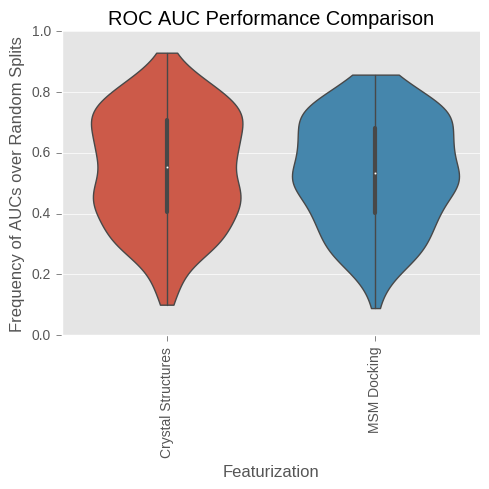

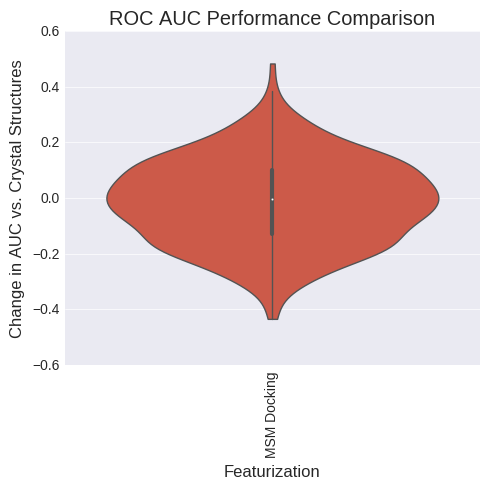

(6,)
(1, 6)


ValueError: Shape of passed values is (1, 6), indices imply (1, 3)

In [448]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

results_dict = {}
n_trials = 300
train_test_split_prop = 0.75

model_type = "rfr"

save_name = "three_class_sk_%s_trials%d_split%s" %(model_type, n_trials, str(train_test_split_prop))
results_dict[save_name] = generate_or_load_model(features, y, feature_names,
                                                 n_trials, train_test_split_prop, False,
                                                 model_type, "%s/%s.pkl" %(analysis_dir, save_name),
                                                 redo=True, worker_pool=dview, n_estimators=1000, 
                                                 max_depth=None, criterion='gini',
                                                 normalize=True, normalize_axis0=True)


analyze_multiclass_experiment(results_dict[save_name], 
                                                            ["Crystal Structures", "MSM Docking"],
                                                            [[n for n in docking_df.columns if "State" not in n], docking_df.columns], common_ligands, analysis_dir,
                                                            ["Antagonists", "Partial Agonists", "Agonists"], X, 
                                                            exp_title="Ligand Class", coef_name=model_type)

In [265]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

n_trials = 200
train_test_split_prop = 0.9

ligand_df = copy.deepcopy(ori_ligand_df)
classes = ligand_df["action"].values.tolist()
class_labels = []
indices = []
for i, label in enumerate(classes):
        if "antagonist" == label.lower():# or "neutral" in label.lower() or "negative" in label.lower():
                class_labels.append(0.)
                indices.append(i)
        elif "agonist" == label.lower():# or "positive" in label.lower():
                class_labels.append(1.)
                indices.append(i)
        else:
                print(label)
                class_labels.append(1.)
                indices.append(i)


ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels

#y = preprocessing.binarize(ligand_df["MOR"].values, 100.).reshape((-1,1))

model_type = "rfr"

save_name = "two_class_sk_%s_trials%d_split%s" %(model_type, n_trials, str(train_test_split_prop))
results_dict[save_name] = generate_or_load_model(features, y, feature_names,
                                                 n_trials, train_test_split_prop, False,
                                                 model_type, "%s/%s.pkl" %(analysis_dir, save_name),
                                                 redo=False, worker_pool=dview, n_estimators=1000, 
                                                 max_depth=None, criterion='gini',
                                                 normalize=True, normalize_axis0=False)

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                            ["Crystal Structures", "MSM Docking"],
                                                            [[n for n in docking_df.columns if "State" not in n], X_df.columns], common_ligands, analysis_dir,
                                                            ["Antagonists", "Agonists"], X)
"""

SyntaxError: EOF while scanning triple-quoted string literal (<ipython-input-265-5ad060015f2f>, line 44)

In [87]:
class_labels

[1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [457]:
ligand_df

,Opiates/Opioids,Molecular Structure,Mol. Wt.,MOR,KOR,DOR,Unnamed: 7,ligand,action,label
ligand,,,,,,,,,,
naloxone,Naloxone,NaN,327.1471,4.23000,NaN,NaN,antagonist,naloxone,antagonist,0.0
ctap,CTAP,NaN,1103.4681,2.33000,NaN,NaN,antagonist,ctap,antagonist,0.0
levallorphan,Levallorphan,NaN,283.1936,1.29000,NaN,NaN,antagonist,levallorphan,antagonist,0.0
naltrexone,Naltrexone,NaN,341.1627,1.15000,NaN,NaN,antagonist,naltrexone,antagonist,0.0
damgo,DAMGO,NaN,513.2587,3.34000,>500,>500,agonist,damgo,agonist,1.0
morphine,Morphine,NaN,285.1365,4.60000,NaN,NaN,agonist,morphine,agonist,1.0
mp1104,MP1104,NaN,554.1066,0.02100,0.0064,0.08,agonist,mp1104,agonist,1.0
mp1101,MP1101,NaN,514.0753,0.03700,0.21,0.88,agonist,mp1101,agonist,1.0
mp1102,MP1102,NaN,528.0910,1.19000,10.54,49.19,agonist,mp1102,agonist,1.0


In [485]:
regression_results = do_regression_experiment(features, np.log(ligand_df["MOR"].values), feature_names, 10, train_size=0.8, regularize=False, model="RidgeCV")


0
1
2
3
4
5
6
7
8
9


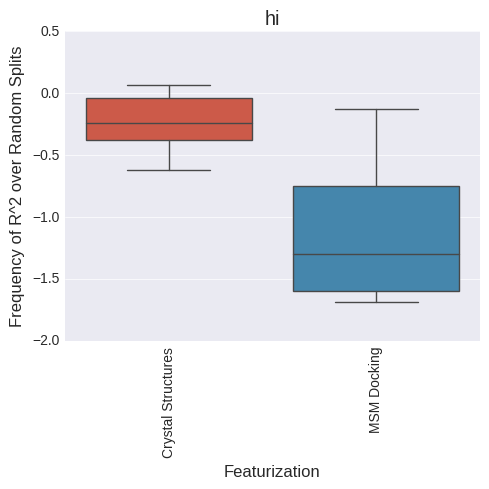

IndexError: list index out of range

In [486]:
analyze_regression_experiment(regression_results["test_r2s"], regression_results["feature_importances"], feature_names,
                        X, np.log(ligand_df["MOR"].values), X_df, X_df.columns.values.tolist(), common_ligands, "hi", analysis_dir)

In [428]:
ligand_df.sort("label", inplace=False)

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,Opiates/Opioids,Molecular Structure,Mol. Wt.,MOR,KOR,DOR,Unnamed: 7,ligand,action,label
ligand,,,,,,,,,,
va8a,VA8a,NaN,414.1943,0.10000,2.9,10.26,partial agonist,va8a,partial agonist,0.0
mp103,MP103,NaN,419.2573,10.30000,87.6,>100,partial agonist,mp103,partial agonist,0.0
mp101,MP101,NaN,447.2886,29.40000,>100,90.7,partial agonist,mp101,partial agonist,0.0
mgm15,MGM15,NaN,416.2311,10.46000,91.82,59.54,partial agonist,mgm15,partial agonist,0.0
vm1532,VM1532,NaN,384.2049,207.00000,>1000,>1000,partial agonist,vm1532,partial agonist,0.0
um1547,UM1547,NaN,400.1998,40.80000,133,12.6,partial agonist,um1547,partial agonist,0.0
mp100,MP100,NaN,461.3042,0.84000,0.44,2.65,partial agonist,mp100,partial agonist,0.0
vm1540,VM1540,NaN,368.2100,57.00000,385,172,partial agonist,vm1540,partial agonist,0.0
vm1500,VM1500,NaN,398.2206,230.00000,231,1011,partial agonist,vm1500,partial agonist,0.0


In [199]:
len(indices)

65

In [78]:
importance_dfs["MSM Docking"].sort(columns=["Importance"], inplace=False, ascending=False)

,Importance
State 37,0.026584
Inactive Crystal,0.024460
State 79,0.023735
State 26,0.022233
State 13,0.020633
State 25,0.020606
State 54,0.020175
State 53,0.018730
State 15,0.017296
difference,0.017198


In [52]:
full_docking_df.loc[[n for n in full_docking_df.index.values if "fent" in n]]

,Inactive Crystal,Active Crystal,State 0,State 10,State 11,State 12,State 13,State 14,State 15,State 16,State 17,State 18,State 19,State 1,State 20,State 21,State 22,State 23,State 24,State 25,State 26,State 27,State 28,State 29,State 2,State 30,State 31,State 32,State 33,State 34,State 35,State 36,State 37,State 38,State 39,State 3,State 40,State 41,State 42,State 43,State 44,State 45,State 46,State 47,State 48,State 49,State 4,State 50,State 51,State 52,State 53,State 54,State 55,State 56,State 57,State 58,State 59,State 5,State 60,State 61,State 62,State 63,State 64,State 65,State 66,State 67,State 68,State 69,State 6,State 70,State 71,State 72,State 73,State 74,State 75,State 76,State 77,State 78,State 79,State 7,State 80,State 81,State 82,State 83,State 84,State 85,State 86,State 87,State 88,State 89,State 8,State 90,State 91,State 92,State 93,State 94,State 95,State 96,State 97,State 98,State 99,State 9
Acetylfentanyl,7.23,5.82,4.56,5.83,4.20,7.30,4.25,7.74,5.57,7.15,5.63,3.61,6.89,4.94,5.01,3.29,5.35,4.24,5.75,6.04,5.85,4.31,5.83,3.62,7.03,5.85,4.06,5.59,4.76,6.10,5.05,5.33,4.51,5.34,4.13,5.00,5.45,7.44,5.72,3.98,3.90,6.08,6.22,6.62,6.47,6.00,4.63,6.18,3.98,4.73,5.95,5.36,7.04,6.87,4.04,5.01,6.29,6.28,5.02,5.33,5.54,4.60,5.60,5.15,5.16,4.90,7.54,6.43,5.16,5.06,5.36,4.96,6.18,6.70,6.75,4.80,6.78,5.75,7.10,4.54,4.95,7.59,5.55,7.10,6.54,5.50,6.45,7.03,6.52,6.97,5.20,6.77,6.14,6.08,4.95,5.55,5.26,4.01,4.74,6.72,5.70,6.11
sufentanil,6.07,3.63,4.39,5.37,4.26,6.98,3.39,5.13,5.32,7.36,6.31,5.00,7.28,5.17,4.93,3.89,4.64,5.15,5.65,5.06,4.39,5.05,4.74,6.62,5.63,4.55,5.11,5.60,3.96,5.80,4.49,4.02,3.88,4.60,5.63,4.98,4.69,7.09,5.89,5.10,4.24,5.55,5.56,5.20,6.33,7.55,4.13,5.42,4.11,5.77,4.12,4.43,6.75,6.18,4.24,4.31,6.45,5.49,4.35,4.24,5.70,5.40,5.06,4.45,4.61,5.29,5.29,5.26,4.52,4.82,4.62,4.91,5.24,5.67,7.13,4.72,4.90,4.00,7.05,4.85,3.19,5.08,4.90,6.13,5.52,5.66,5.92,7.05,6.08,5.24,4.66,6.78,5.30,5.06,4.34,6.70,6.44,4.01,5.85,5.96,7.18,5.95
Remifentanil,5.30,5.59,4.64,5.41,5.37,5.70,4.55,5.53,5.88,6.64,6.51,3.59,6.38,5.00,4.84,4.89,5.27,5.11,6.23,5.84,4.45,4.75,3.96,5.18,4.18,5.71,5.68,6.37,2.84,5.07,5.19,4.91,3.57,5.10,6.23,4.73,5.49,4.92,5.76,4.20,4.03,5.49,4.75,6.09,6.79,7.27,4.83,5.69,5.51,5.24,5.46,4.86,6.11,4.58,4.20,4.71,5.13,4.98,4.80,4.54,5.84,5.54,5.29,4.61,4.52,5.08,6.27,5.38,5.34,5.39,5.76,5.66,5.19,5.22,5.74,5.47,5.37,4.76,6.67,5.11,4.98,4.63,4.11,5.85,6.03,5.46,6.05,6.66,6.21,5.60,2.72,5.81,5.52,5.44,4.75,6.81,5.82,3.66,5.43,5.89,6.33,5.09
N-Methylcarfentanil,4.75,4.87,4.54,4.75,4.44,5.87,4.44,5.32,4.93,6.17,5.79,3.63,5.99,4.60,3.54,4.02,5.56,4.81,3.71,5.67,3.47,3.77,3.97,5.13,4.85,5.35,4.50,5.13,4.23,5.49,4.37,3.71,3.81,5.15,5.26,5.02,5.30,5.03,4.76,3.78,3.83,5.09,5.36,4.76,5.91,6.15,4.14,5.55,4.44,5.65,4.33,5.08,5.91,5.39,3.40,3.83,5.82,4.74,4.33,3.64,4.63,4.26,4.41,4.82,4.63,5.01,4.45,4.33,5.05,3.62,4.00,4.93,4.00,4.85,5.59,4.61,4.27,3.51,6.03,4.45,3.42,4.41,4.18,6.07,5.10,4.76,5.55,6.04,4.67,4.79,5.35,4.90,4.42,3.44,4.43,5.13,5.59,3.70,4.42,4.79,6.11,4.50
Trefentanil,6.92,5.37,5.92,6.92,4.90,6.37,4.92,7.90,6.91,7.31,4.76,4.37,7.19,5.02,6.00,4.97,5.54,6.39,5.81,6.30,4.54,5.49,6.06,6.01,5.84,6.99,5.21,7.21,5.50,7.06,6.01,6.17,5.03,6.69,7.20,6.43,4.77,6.44,5.26,5.51,3.97,6.00,5.60,6.22,8.26,8.52,4.79,6.13,6.36,6.63,5.31,5.66,7.65,6.57,4.68,4.47,6.66,5.81,6.92,5.10,6.47,4.89,5.83,6.40,5.53,6.77,7.21,5.93,5.95,6.19,6.07,6.27,5.94,5.92,7.30,6.21,5.43,5.93,7.45,5.59,7.19,7.70,5.87,7.48,6.07,6.73,5.89,7.21,8.09,5.93,4.31,4.23,6.69,5.46,6.09,7.41,8.33,4.44,5.49,7.58,6.83,6.52
Lofentanil,5.06,5.51,4.63,5.70,5.34,6.97,4.47,6.75,6.26,8.11,6.04,3.61,7.12,5.50,5.82,4.32,6.55,4.27,4.64,5.75,3.16,4.49,6.86,4.90,5.62,4.53,4.95,6.05,3.12,6.86,4.37,4.47,4.24,4.80,5.30,5.49,5.37,7.64,6.52,5.52,4.23,5.23,6.37,4.70,7.29,5.16,4.03,7.37,3.96,6.41,6.54,4.61,7.37,6.01,4.82,3.32,7.43,6.54,6.21,4.72,7.24,5.22,3.73,3.83,3.67,3.56,5.94,6.01,5.63,6.23,5.58,6.33,6.25,5.60,7.03,5.62,6.34,5.57,7.53,5.74,4.59,5.76,4.40,6.59,4.30,5.60,6.37,8.10,6.83,

In [128]:
model = results_dict[save_name]['MSM Docking'][0]
test_ligands = [n for n in full_docking_df.index.values.tolist()]# if n.lower() not in [m.lower() for m in X_df.index.values.tolist()]]
X_test_df = full_docking_df.loc[test_ligands]
C_test_df = full_docking_df.loc[test_ligands][[n for n in full_docking_df.columns.values.tolist() if "State" not in n]]
C_test_df["difference"] = C_test_df[C_test_df.columns[0]].subtract(C_test_df[C_test_df.columns[1]])
C_test_df[C_test_df.columns] = np.nan_to_num(C_test_df.values)
X_test_df["difference"] = C_test_df["difference"]
X_test_df[X_test_df.columns] = np.nan_to_num(X_test_df.values)
y_test = model.predict_proba(X_test_df.values)
y_test_df = pd.DataFrame(y_test, index=X_test_df.index, columns=["class A", "class B"]).sort("class B", ascending=False, inplace=False)

In [50]:
grandisine_df = y_test_df.loc[[n for n in y_test_df.index.values if "4-" in n]]
grandisine_df.to_csv("%s/grandisine_predictions_%s.csv" %(analysis_dir, save_name))
grandisine_df

,class A,class B
4-Fluoropethidine,0.000,1.000
4-8,0.010,0.990
4-24,0.010,0.990
4-7,0.013,0.987
4-40,0.013,0.987
14-Hydroxydihydrocodeine,0.014,0.986
4-9,0.018,0.982
4-23,0.018,0.982
4-Fluorobutyrfentanyl,0.019,0.981
4-37,0.023,0.977


In [579]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *

X_df = full_docking_df
X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"]).dropna()
C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]

ligand_df = copy.deepcopy(full_ligand_df[[c for c in full_ligand_df.columns.values if "fp" not in c.lower()]]).drop_duplicates(subset=['name'], keep='first')
ligand_df = ligand_df.loc[[n for n in ligand_df.index.values if n in full_docking_df.index.values]]

mols = [pybel.readstring("smi", x) for x in ligand_df.smiles]
fps = [x.calcfp(fptype='FP4') for x in mols] # Calculate their fingerprints
ligand_df["fp"] = fps

classes = ligand_df["Edits"].values.tolist()
class_labels = []
indices = []
n_antagonists = 0
n_agonists = 0
for i, label in enumerate(classes):
        if "antagonist" == label.lower():# or "neutral" in label.lower() or "negative" in label.lower():
                class_labels.append(0.)
                indices.append(i)
                n_antagonists += 1
        elif "agonist" == label.lower():# or "positive" in label.lower():
                class_labels.append(1.)
                indices.append(i)
                n_agonists += 1

print("n_antagonists: %d" %n_antagonists)
print("n_agonists: %d" %n_agonists)

ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels

model_agonists = ligand_df.index.values

y = ligand_df["label"].values.reshape((-1,1))
y_df = pd.DataFrame(y, index=ligand_df.index)

n_trials = 3
train_test_split_prop = 0.9
model_type = "logistic_cv"

normalize = False
normalize_axis0 = True
if normalize_axis0:
    double_features = 2
    X_df = normalize_per_ligand(X_df)

else: 
    double_features = 1
n_estimators = 1000

features = [C_df.loc[model_agonists], X_df.loc[model_agonists]]#, all_features_df]#, all_features]
feature_names = ["Crystal Structures", "MSM Docking"]
print([f.shape for f in features])
base_ligand = "fentanyl"

#fent_ligands = [n.lower().strip().replace(" ", "_") for n in ["18-Methoxycoronaridine", "7-Acetoxymitragynine", "7-Hydroxymitragynine", "Akuammidine","Akuammine", "Coronaridine", "Eseroline", "Hodgkinsine", "Ibogaine", "Mitragynine", "Mitragynine pseudoindoxyl", "Noribogaine", "Pericine", "Pseudoakuammigine"] if n.lower().strip().replace(" ", "_") in model_agonists]
fent_ligands = [n for n in model_agonists if "methad" in n]
print(fent_ligands)
base_ligand = "methadone"
#fent_ligands = [n for n in model_agonists if base_ligand in n.lower()]
print(fent_ligands)
tanimoto_cutoff = 0.7
fent_ligands = [n for n in model_agonists if n in fent_ligands or (ligand_df.loc[n]["fp"] | ligand_df.loc[base_ligand]["fp"]) > tanimoto_cutoff]

fent_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n in fent_ligands]
antagonists = [n for n in ligand_df.loc[ligand_df.label == 0.].index.values.tolist() if n not in fent_ligands]
other_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n not in fent_ligands and (ligand_df.loc[n]["fp"] | ligand_df.loc["fentanyl"]["fp"]) < (tanimoto_cutoff-.2)]


c_log_aucs = []
c_aucs = []

m_log_aucs = []
m_aucs = []

import random

names = ligand_df.index.values.tolist()
antagonist_inds = [names.index(n) for n in antagonists]
non_fentanyl_agonist_inds = [names.index(n) for n in other_agonists]
fentanyl_inds = [names.index(n) for n in fent_agonists]

splitter = CustomSplitter(antagonist_inds,
                          non_fentanyl_agonist_inds,
                          fentanyl_inds)

"""
    random.shuffle(antagonists)
    random.shuffle(other_agonists)

    test_ligands = [n for n in ligand_df.index.values.tolist() if n not in non_fent_ligands or n in antagonists[:5]]
    train_ligands = [n for n in ligand_df.index.values.tolist() if n not in test_ligands]

    X_train = X_df.loc[train_ligands].values
    C_train = C_df.loc[train_ligands].values
    y_train = ligand_df.loc[train_ligands].label.values.reshape((-1,1))

    X_test = X_df.loc[test_ligands].values
    C_test = C_df.loc[test_ligands].values
    y_test = ligand_df.loc[test_ligands].label.values.reshape((-1,1))

    features = [C_train, X_train]
"""

save_name = "two_class_nofent_%s_trials%d_tanimoto%s" %(model_type, n_trials, str(tanimoto_cutoff))
results_dict[save_name] = generate_or_load_model([f.values for f in features], y, feature_names, n_trials, train_test_split_prop, False, model_type, 
                                                 "%s/%s.pkl" %(analysis_dir, save_name),redo=True, worker_pool=None,
                                                 parallel=False, n_estimators=1000, max_depth=None, criterion='gini',
                                                 normalize=False, splitter=splitter, normalize_axis0=False)


n_antagonists: 27
n_agonists: 158
[(185, 3), (185, 205)]
['acetylmethadol', 'alphacetylmethadol', 'alphamethadol', 'betacetylmethadol', 'betamethadol', 'isomethadone', 'levacetylmethadol', 'levomethadone', 'methadone', 'noracymethadol']
['acetylmethadol', 'alphacetylmethadol', 'alphamethadol', 'betacetylmethadol', 'betamethadol', 'isomethadone', 'levacetylmethadol', 'levomethadone', 'methadone', 'noracymethadol']
Aobut to fit model(s).
Fitting models over all data...
Fitting models over split train data...
train inds:
[179, 164, 184, 77, 161, 166, 165, 170, 175, 171, 168, 169, 173, 176, 159, 181, 162, 172, 183, 178, 182, 58, 70, 101, 112, 44, 114, 158, 102, 94, 132, 89, 66, 141, 152, 100, 155, 42, 146, 53, 104, 127, 73, 16, 30, 116, 68, 93, 43, 65, 15, 6, 107, 46, 106, 126, 34, 57, 52, 75, 31, 0, 124, 118, 67, 150, 131, 26, 56, 33, 105, 147, 88, 51, 115, 148, 29, 80, 128, 79, 37, 144, 95, 45, 28, 32]test_inds:
[2, 10, 11, 18, 21, 49, 71, 72, 74, 76, 78, 85, 98, 109, 121, 139, 142, 174,

In [563]:
print(len(fent_agonists))
print(len(other_agonists))
print(len(antagonists))

17
65
27


In [546]:
print(other_agonists, end="")

['7-pet', 'alimadol', 'azidomorphine', 'bdpc', 'c-8813', 'cebranopadol', 'chloromorphide', 'chloroxymorphamine', 'ciprefadol', 'clonitazene', 'dadle', 'damgo', 'desomorphine', 'dihydroetorphine', 'dihydromorphine', 'dimenoxadol', 'dimepheptanol', 'dimethylaminopivalophenone', 'eluxadoline', 'endomorphin', 'endomorphin-1', '14-ethoxymetopon', 'etonitazene', 'etorphine', 'hemorphin-4', 'heterocodeine', 'hydromorphinol', 'hydromorphone', 'ibntxa', 'ketamine', 'lefetamine', 'levophenacylmorphan', 'levorphanol', '14-methoxydihydromorphinone', '14-methoxymetopon', 'methyldesorphine', 'methyldihydromorphine', '6-methylenedihydrodesoxymorphine', 'metopon', 'mitragynine_pseudoindoxyl', '6-monoacetylmorphine', 'morphine', 'morphine-6-glucuronide', 'morphinone', 'mr-2096', 'oliceridine', 'oxymorphazone', 'oxymorphol', 'oxymorphone', 'pentamorphone', 'phenazocine', 'n-phenethylnordesomorphine', 'n-phenethylnormorphine', 'phenomorphan', '14-phenylpropoxymetopon', 'picenadol', 'pzm21', 'racemorphan'

In [550]:
print(fent_agonists, end="")

['acetylmethadol', 'alphacetylmethadol', 'alphamethadol', 'betacetylmethadol', 'betamethadol', 'dipipanone', 'ic-26', 'isomethadone', 'ketobemidone', 'levacetylmethadol', 'levomethadone', 'methadone', 'methylketobemidone', 'noracymethadol', 'phenadoxone', 'propylketobemidone', 'r-4066']

In [560]:
print(antagonists, end="")

['levallorphan', '6beta-naltrexol-d4', 'beta-chlornaltrexamine', 'beta-funaltrexamine', 'alvimopan', 'at-076', 'axelopran', 'bevenopran', 'clocinnamox', 'cyclofoxy', 'cyprodime', 'eptazocine', 'ly-255582', 'methocinnamox', 'methylnaltrexone', 'methylsamidorphan', 'nalmefene', 'naloxazone', 'naloxegol', 'naloxol', 'naloxonazine', 'naloxone', 'naltrexazone', 'naltrexone', 'oxilorphan', 'quadazocine', 'samidorphan']

analyzing Recall Means:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures         1.0               0.0   
MSM Docking                1.0               0.0   

                                          Sign Test 99% CI  
Crystal Structures                                (0, 0.0)  
MSM Docking         (-4.33680868994e-19, 0.00659116490341)  


ValueError: list.remove(x): x not in list

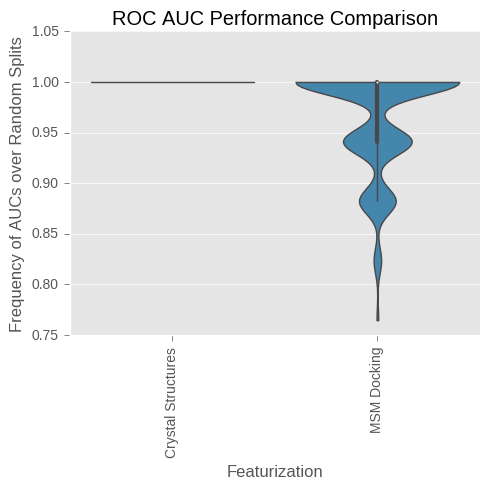

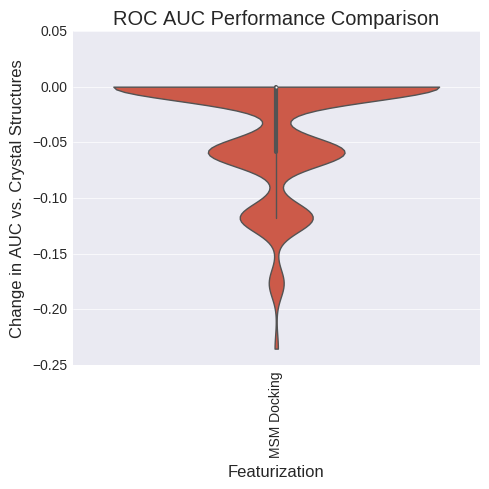

analyzing tpr_means:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.739130          0.000000   
MSM Docking           0.809524          0.070393   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.822904652511, 0.880428802737)  


ValueError: list.remove(x): x not in list

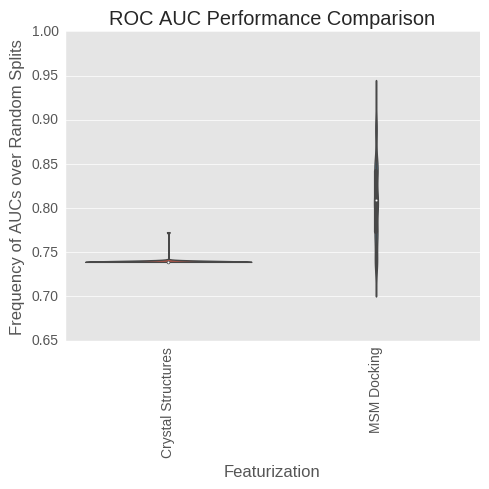

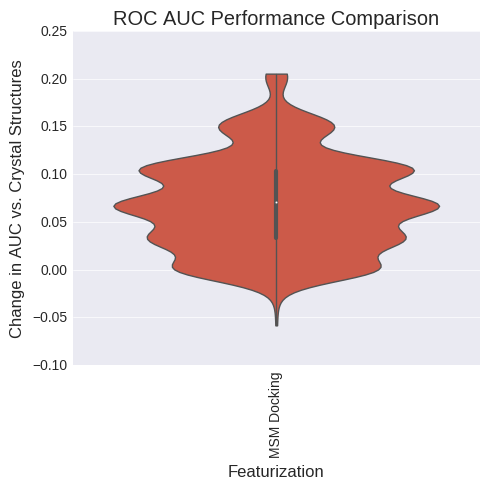

analyzing FPR Means:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.260870          0.000000   
MSM Docking           0.190476         -0.070393   

                                       Sign Test 99% CI  
Crystal Structures                             (0, 0.0)  
MSM Docking         (0.00646953398808, 0.0259502606278)  


ValueError: list.remove(x): x not in list

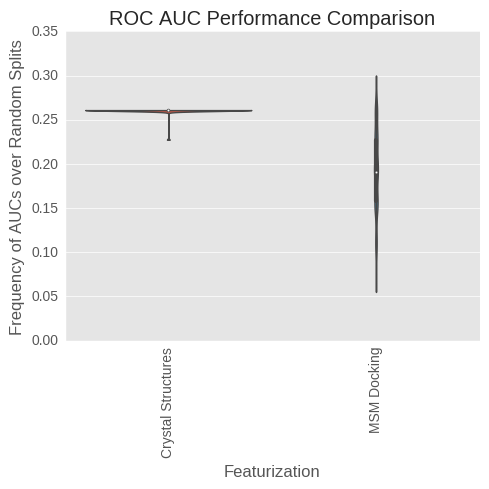

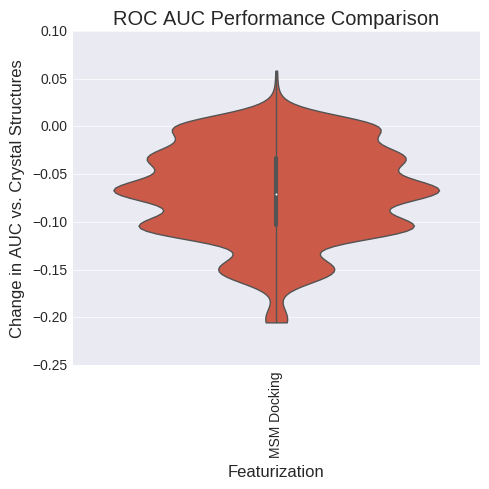

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures         1.0               0.0   
MSM Docking                1.0               0.0   

                                          Sign Test 99% CI  
Crystal Structures                                (0, 0.0)  
MSM Docking         (-4.33680868994e-19, 0.00659116490341)  


ValueError: list.remove(x): x not in list

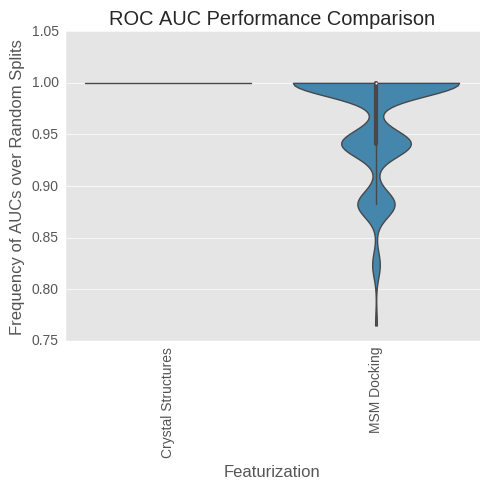

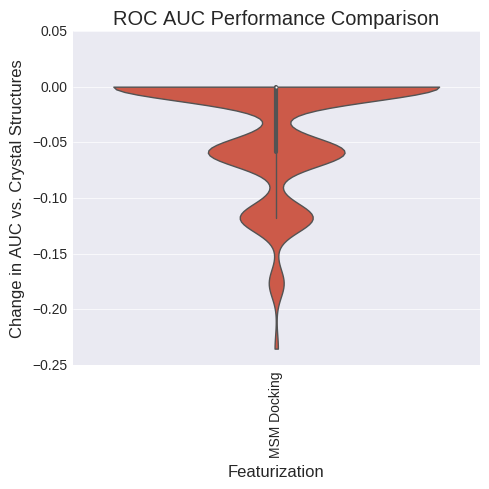

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.739130          0.000000   
MSM Docking           0.809524          0.070393   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.822904652511, 0.880428802737)  


ValueError: list.remove(x): x not in list

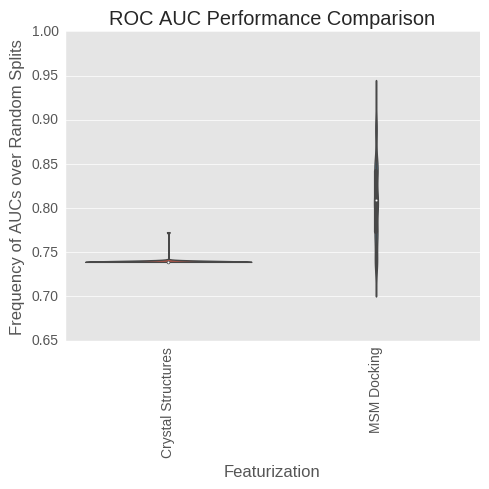

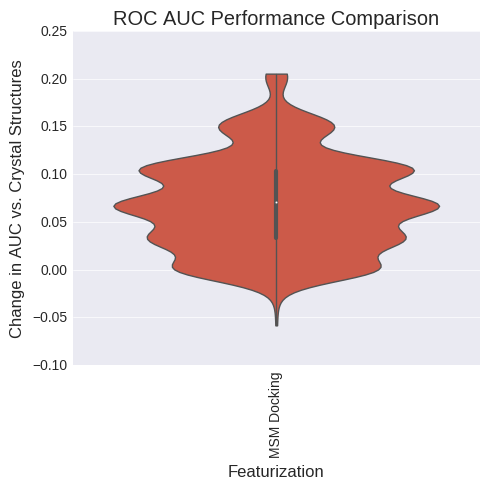

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.260870          0.000000   
MSM Docking           0.190476         -0.070393   

                                       Sign Test 99% CI  
Crystal Structures                             (0, 0.0)  
MSM Docking         (0.00646953398808, 0.0259502606278)  


ValueError: list.remove(x): x not in list

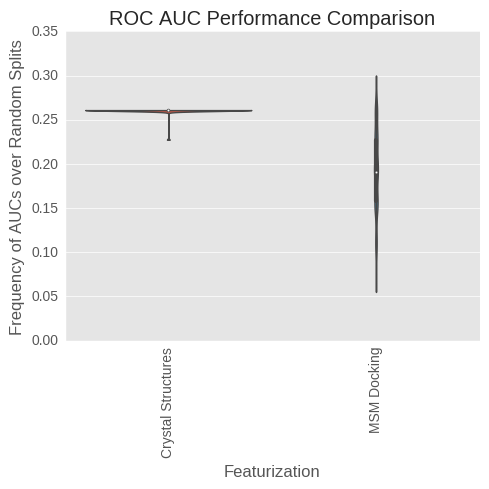

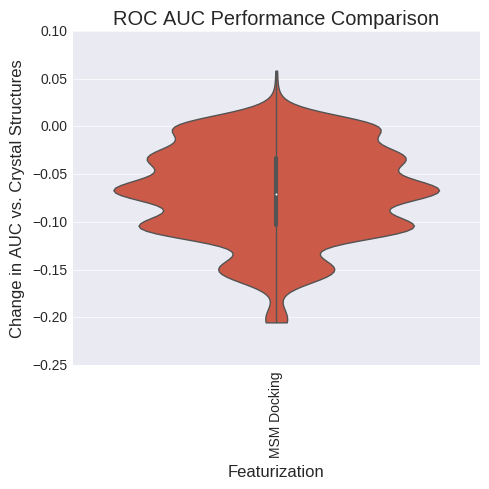

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.705882          0.000000   
MSM Docking           0.745098          0.029412   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.532357938371, 0.612679751554)  


ValueError: list.remove(x): x not in list

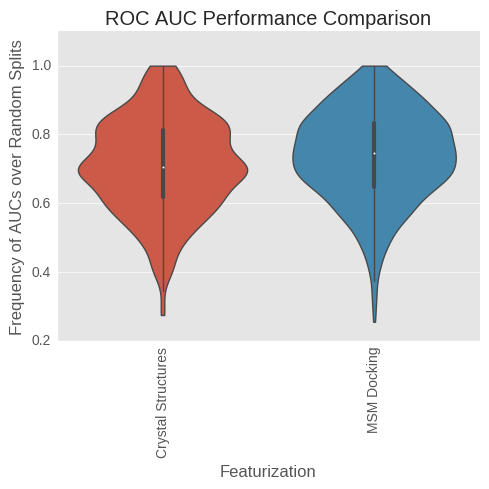

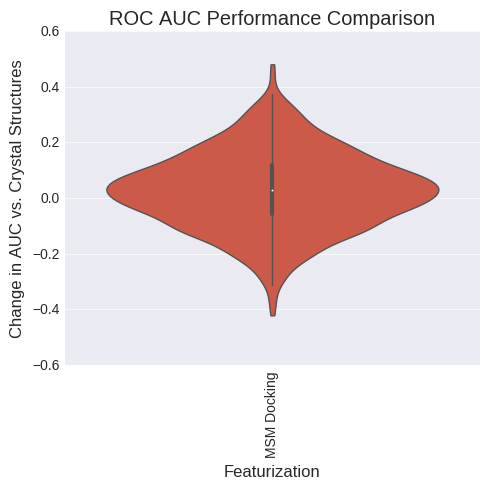

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.854398          0.000000   
MSM Docking           0.953734          0.026237   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.589936838696, 0.668349458429)  


ValueError: list.remove(x): x not in list

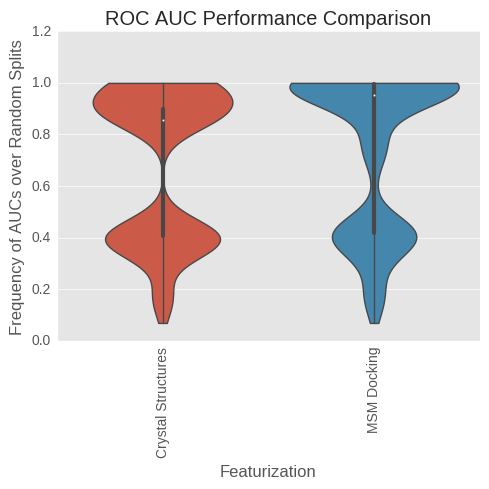

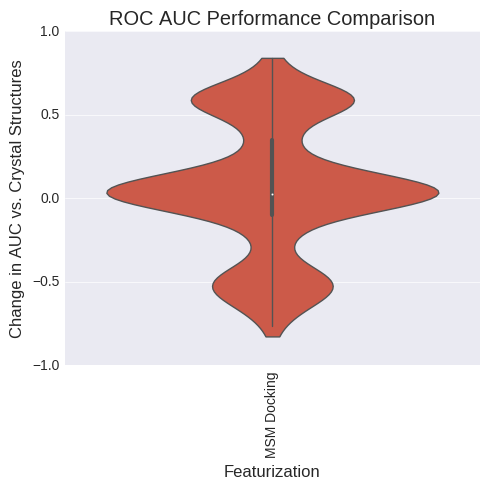

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.176748          0.000000   
MSM Docking           0.194456          0.008352   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.511282933585, 0.592031585265)  


ValueError: list.remove(x): x not in list

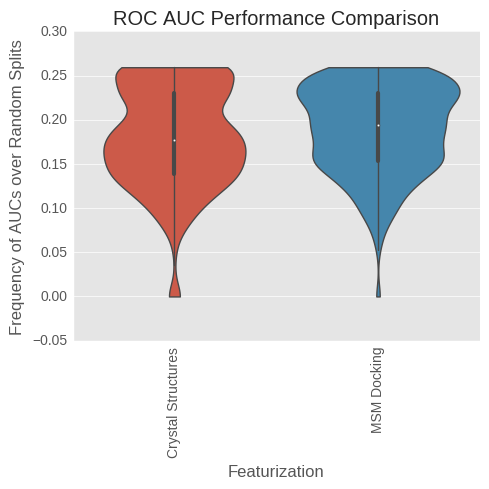

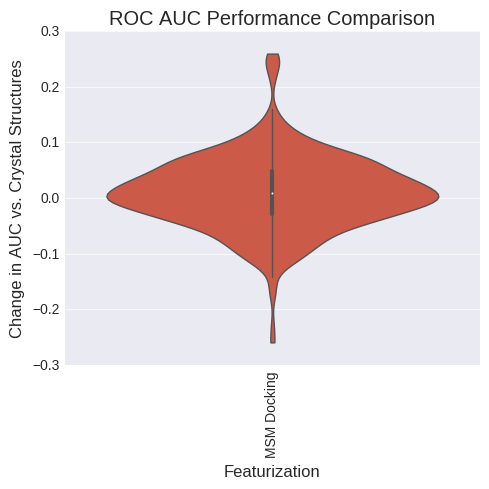

(1, 3)
(1, 3)


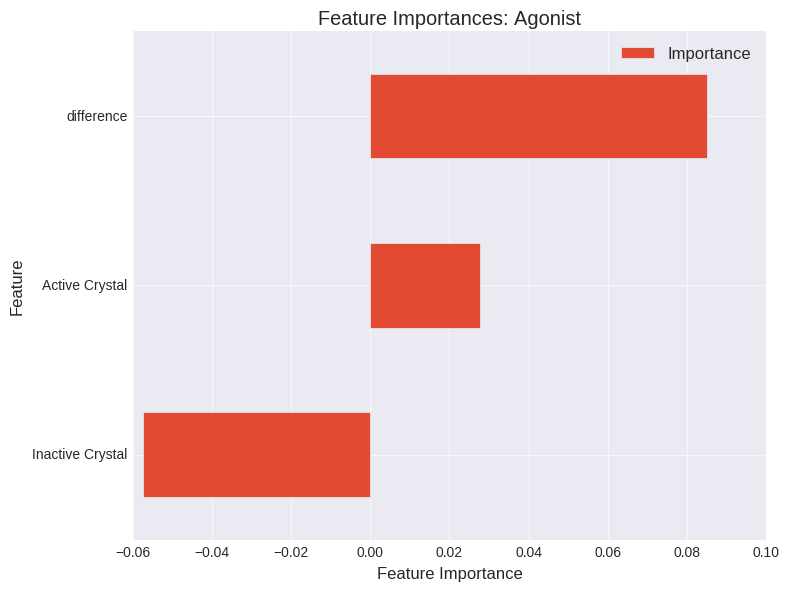

(1, 205)
(1, 205)


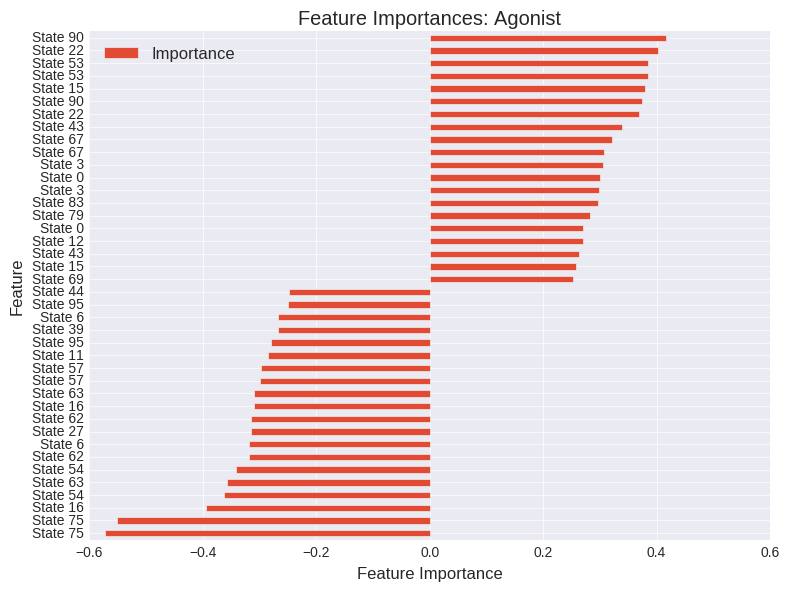

In [567]:
#Normalize False, axis0 True, LR, methadone, 0.7, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

analyzing Recall Means:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.676471               0.0   
MSM Docking           0.676471               0.0   

                                          Sign Test 99% CI  
Crystal Structures                                (0, 0.0)  
MSM Docking         (-4.33680868994e-19, 0.00659116490341)  


ValueError: list.remove(x): x not in list

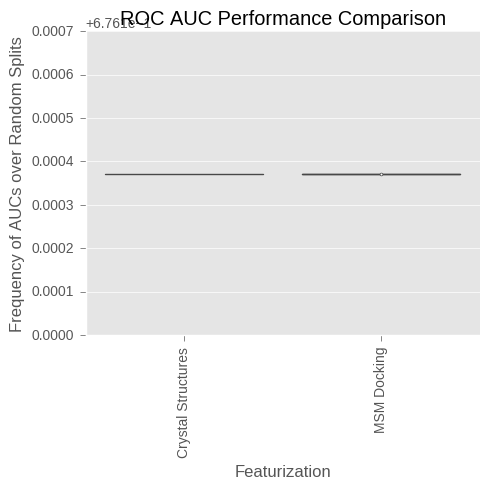

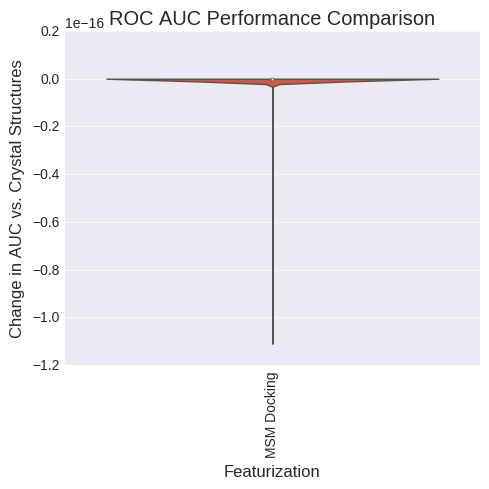

analyzing tpr_means:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures         1.0               0.0   
MSM Docking                1.0               0.0   

                                     Sign Test 99% CI  
Crystal Structures                           (0, 0.0)  
MSM Docking         (0.00274117715473, 0.01775771144)  


ValueError: list.remove(x): x not in list

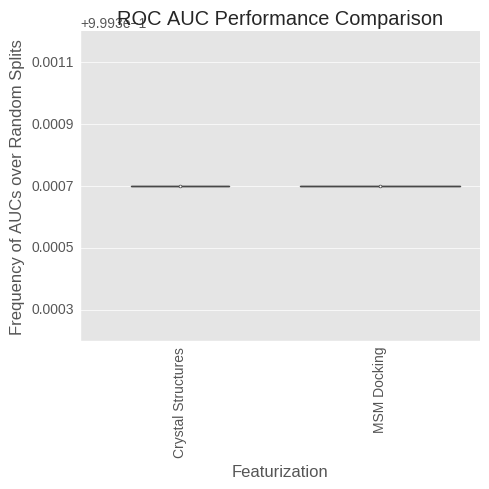

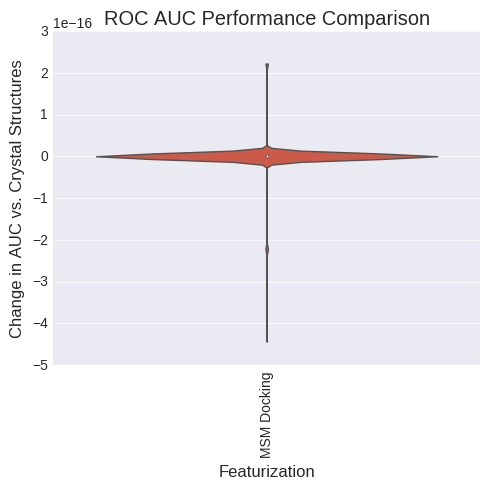

analyzing FPR Means:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures         1.0               0.0   
MSM Docking                1.0               0.0   

                                       Sign Test 99% CI  
Crystal Structures                             (0, 0.0)  
MSM Docking         (0.00782350679074, 0.0285699231656)  


ValueError: list.remove(x): x not in list

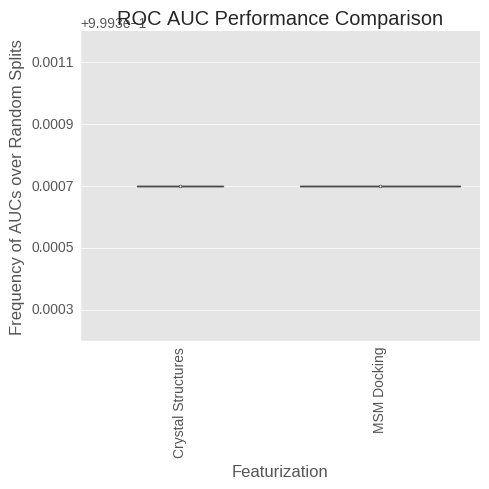

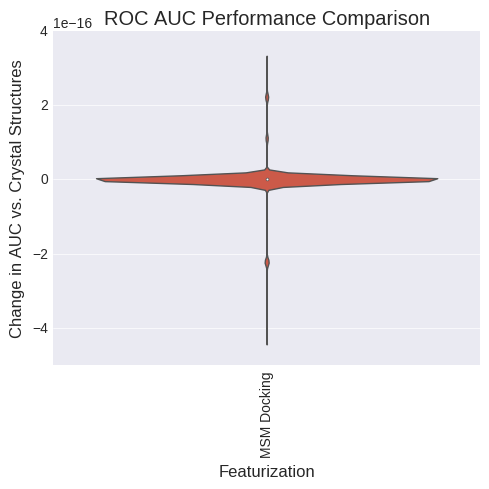

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.882353          0.000000   
MSM Docking           1.000000          0.117647   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.765488110491, 0.830557190567)  


ValueError: list.remove(x): x not in list

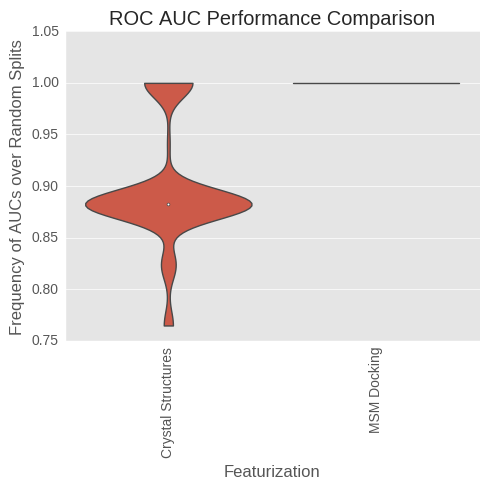

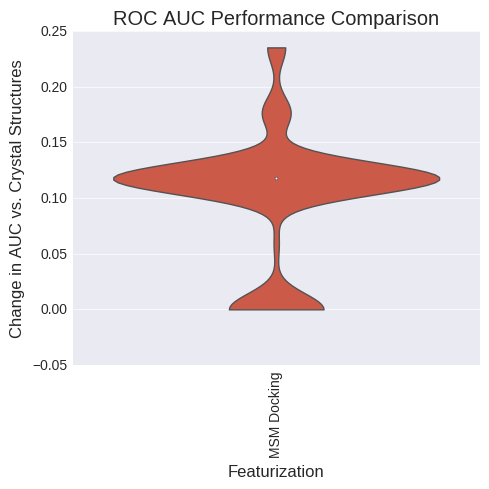

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures     0.75000           0.00000   
MSM Docking            0.73913          -0.01087   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.299683933798, 0.37646478596)  


ValueError: list.remove(x): x not in list

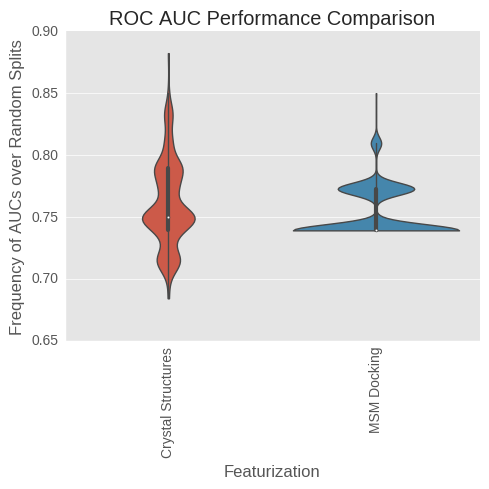

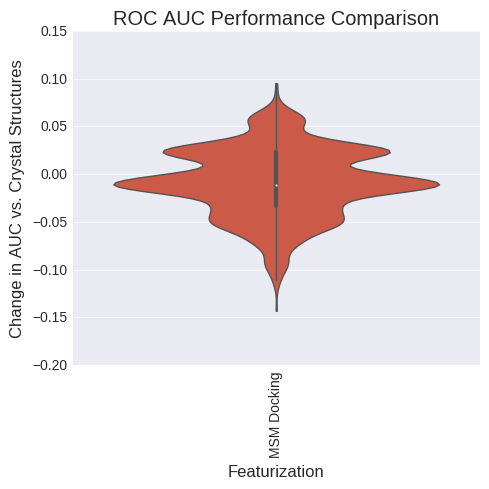

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures     0.25000           0.00000   
MSM Docking            0.26087           0.01087   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.546448680738, 0.626404456569)  


ValueError: list.remove(x): x not in list

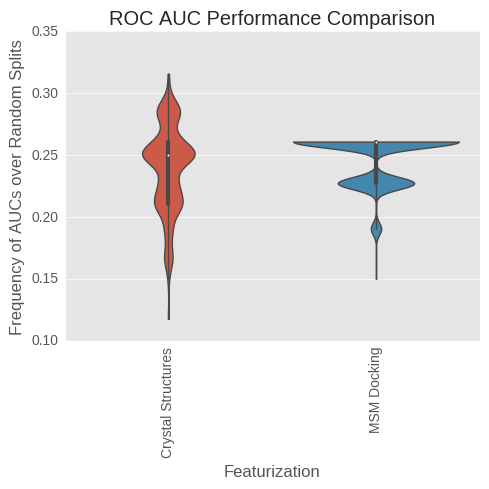

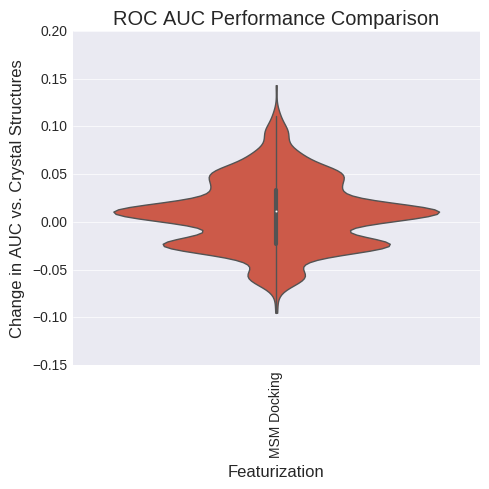

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.661765          0.000000   
MSM Docking           0.843137          0.176471   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.895033216145, 0.939430205336)  


ValueError: list.remove(x): x not in list

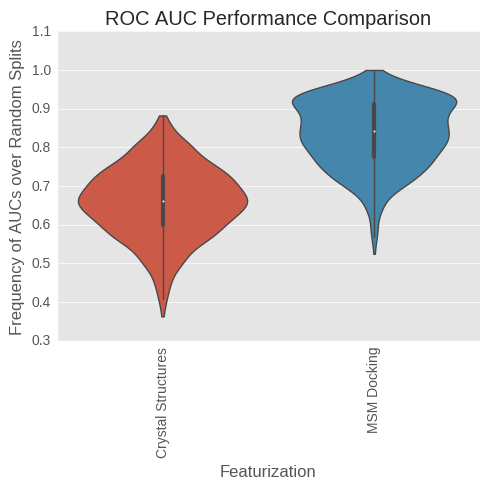

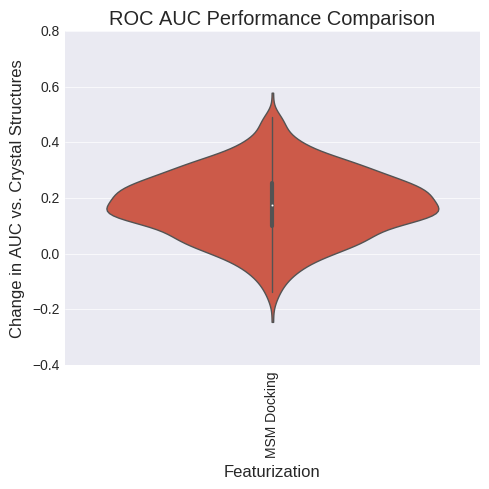

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.981702          0.000000   
MSM Docking           0.999440          0.003168   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.667629625978, 0.741654814082)  


ValueError: list.remove(x): x not in list

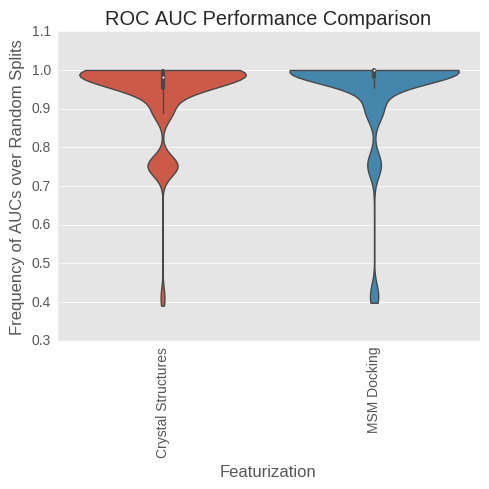

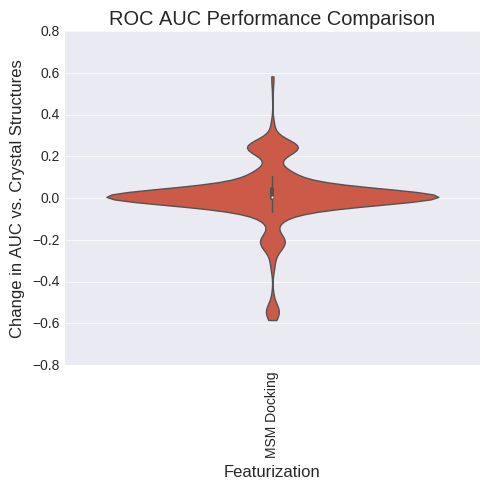

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.170942          0.000000   
MSM Docking           0.221152          0.046024   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.747617678347, 0.814651722317)  


ValueError: list.remove(x): x not in list

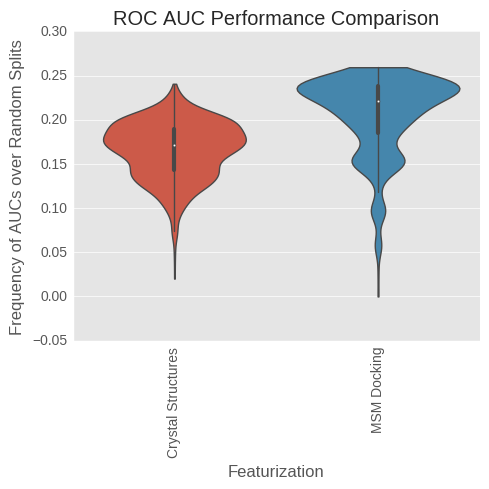

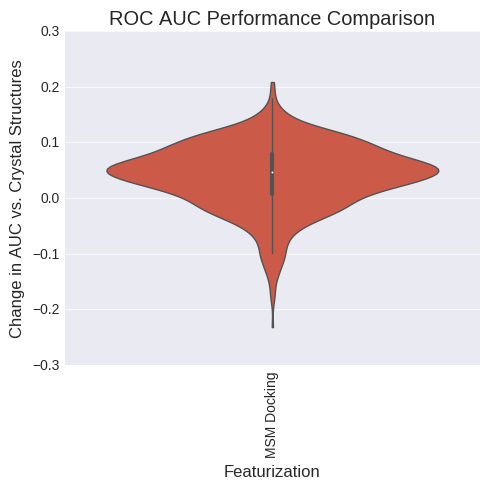

(3,)
(1, 3)


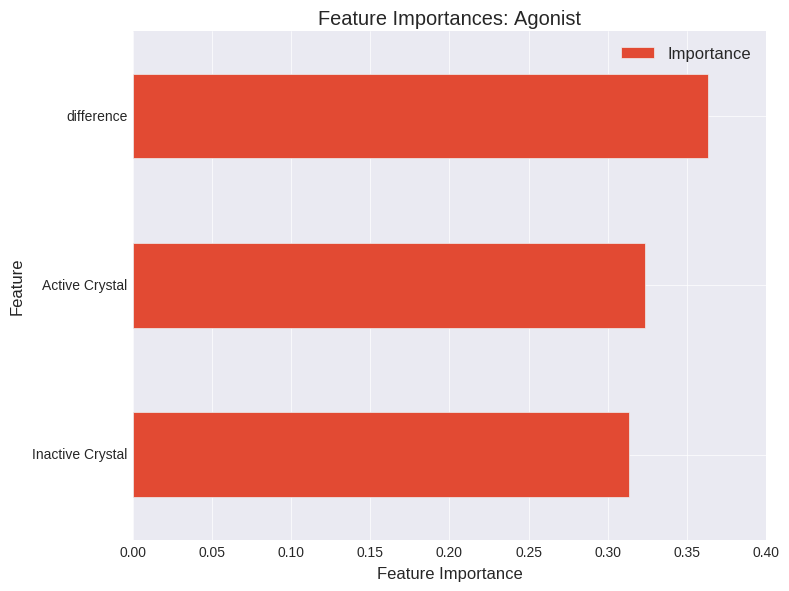

(205,)
(1, 205)


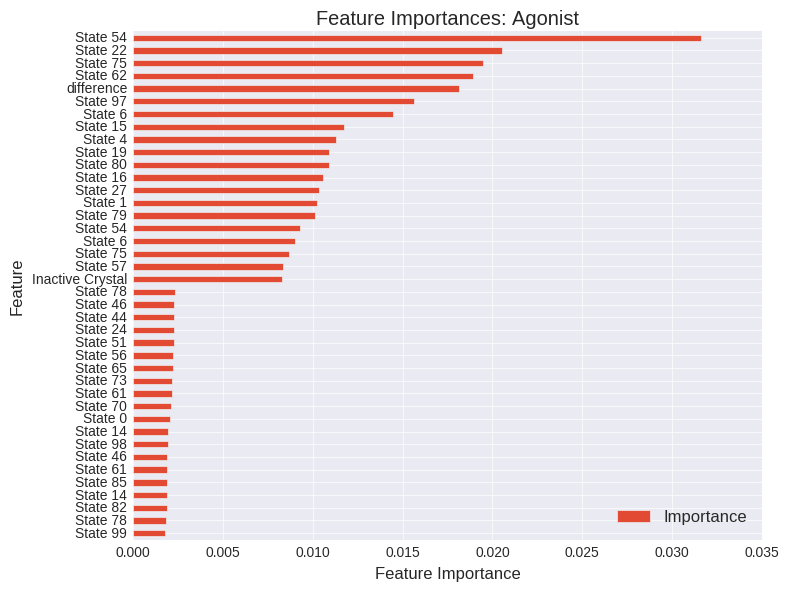

In [571]:
#Normalize False, axis0 True, RFR, methadone, 0.7, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.948718          0.000000   
MSM Docking           1.000000          0.051282   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.918744296024, 0.957442296531)  


ValueError: list.remove(x): x not in list

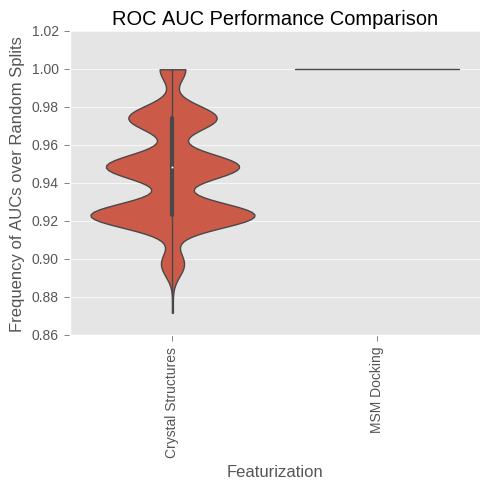

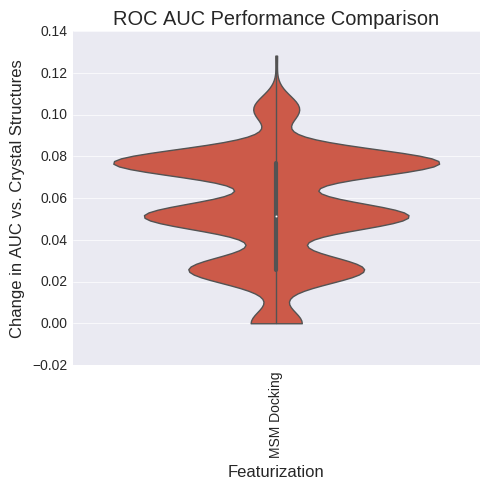

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.812500          0.000000   
MSM Docking           0.795918         -0.012592   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.162919359744, 0.227127615507)  


ValueError: list.remove(x): x not in list

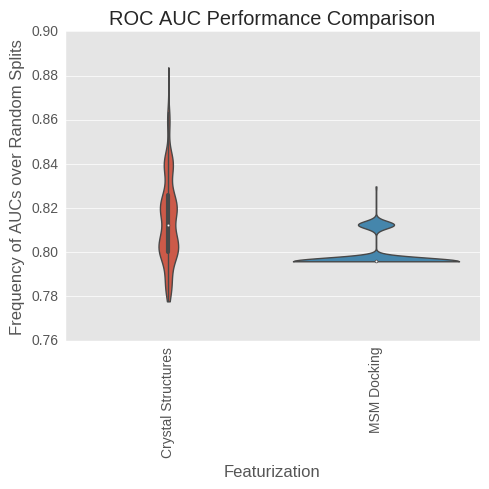

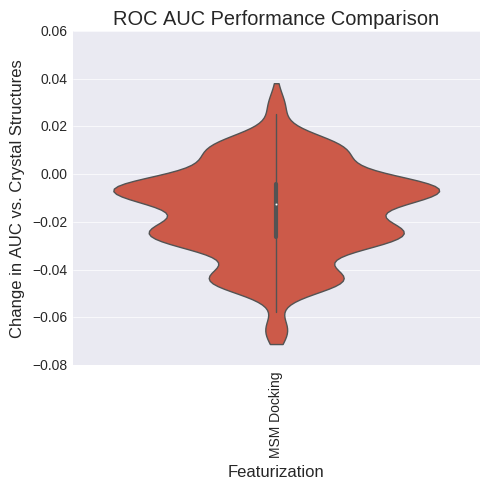

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.187500          0.000000   
MSM Docking           0.204082          0.012592   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.758119192522, 0.824018384845)  


ValueError: list.remove(x): x not in list

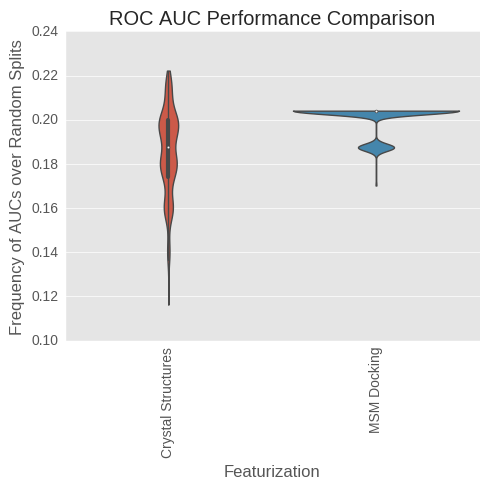

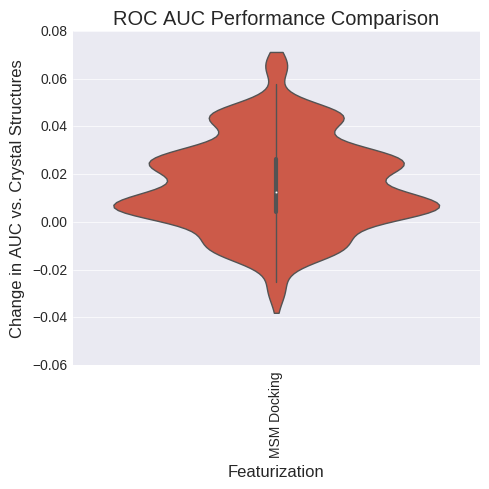

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures     0.74359          0.000000   
MSM Docking            0.84359          0.101282   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.839067916047, 0.894067804254)  


ValueError: list.remove(x): x not in list

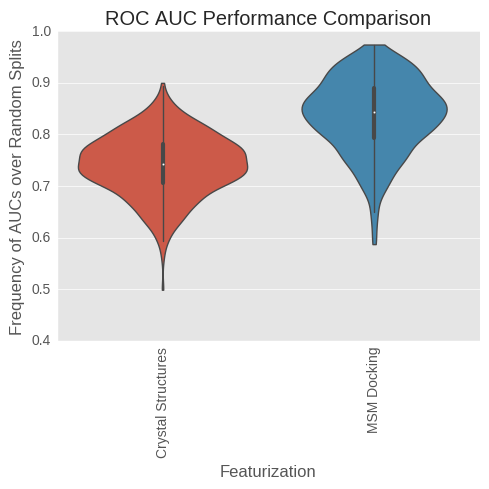

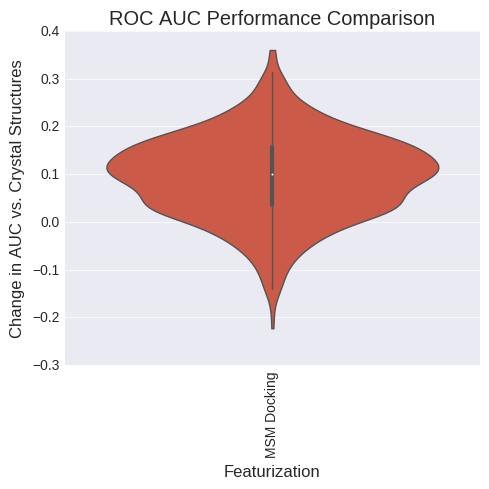

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.996140          0.000000   
MSM Docking           0.996174          0.000008   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.466364819143, 0.547542904548)  


ValueError: list.remove(x): x not in list

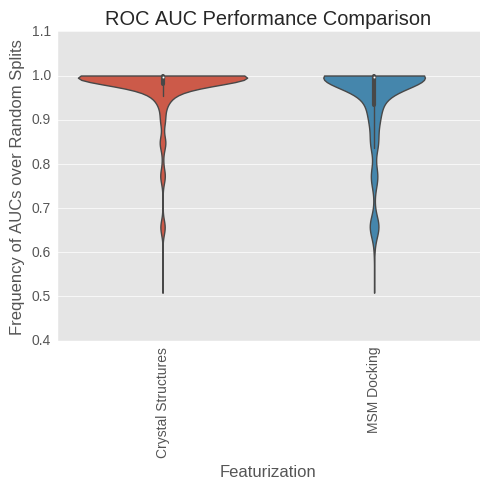

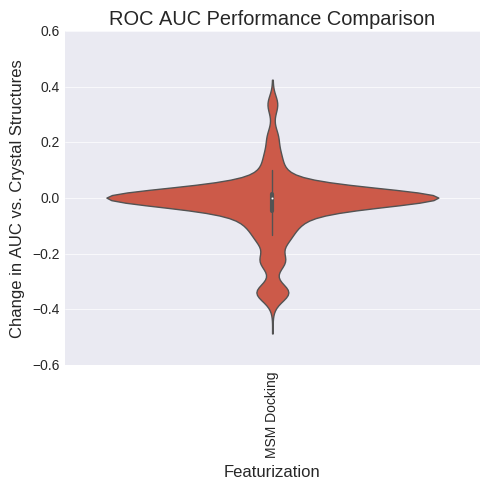

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.231124          0.000000   
MSM Docking           0.275060          0.040531   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.767596309778, 0.832422626621)  


ValueError: list.remove(x): x not in list

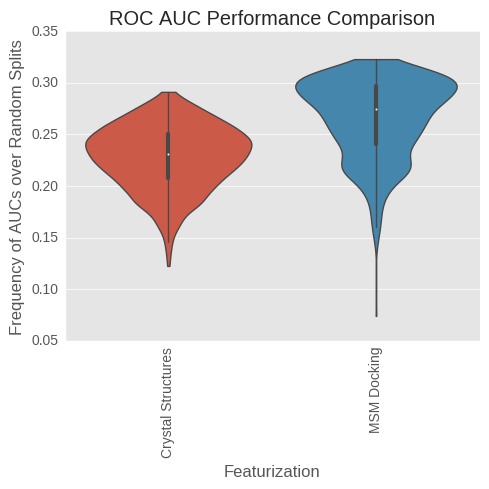

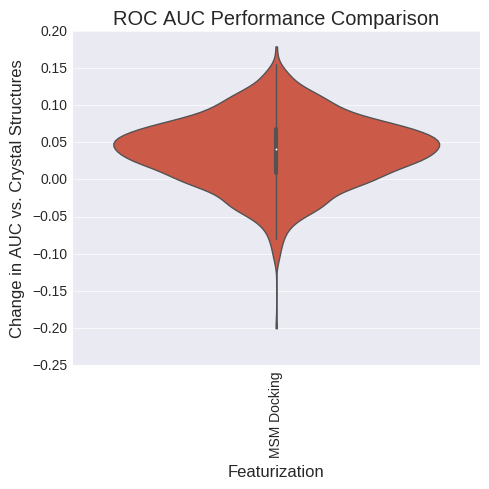

(3,)
(1, 3)


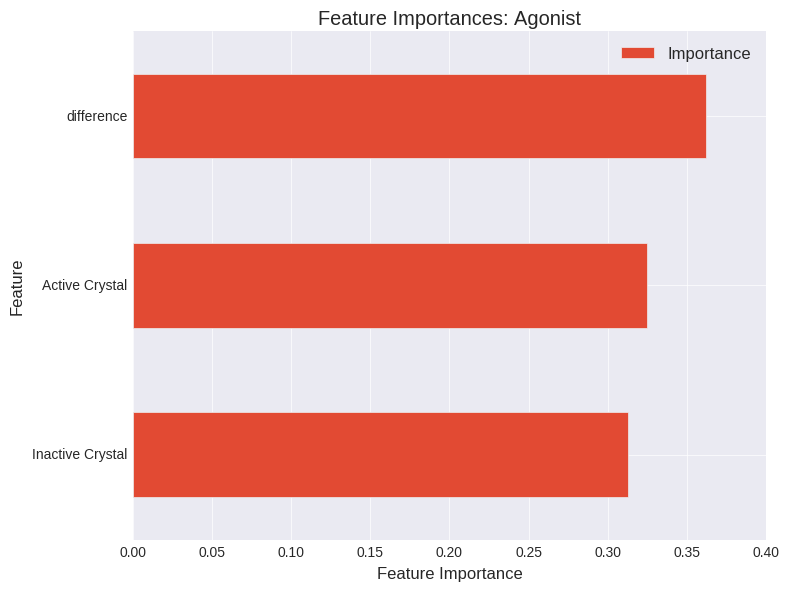

(205,)
(1, 205)


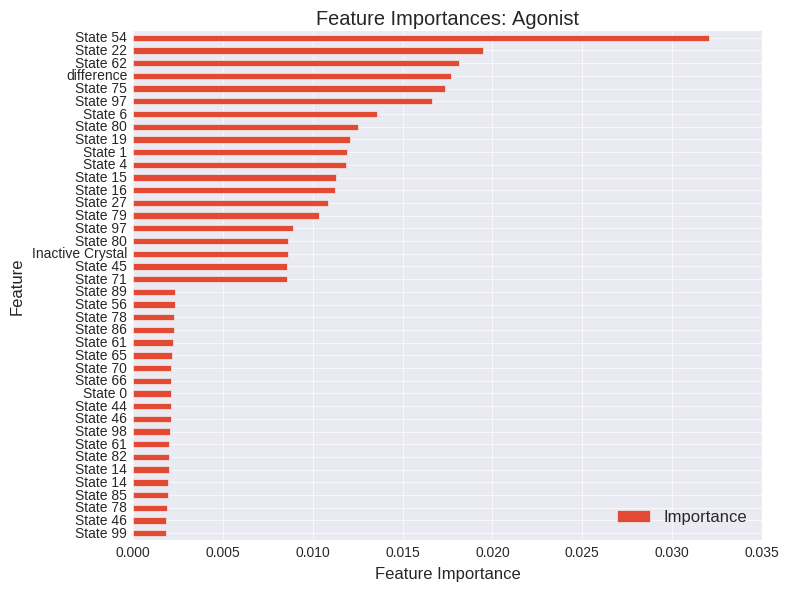

In [502]:
#Normalize False, axis0 True, RFR, fentanyl, 0.7, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures         1.0               0.0   
MSM Docking                1.0               0.0   

                                          Sign Test 99% CI  
Crystal Structures                                (0, 0.0)  
MSM Docking         (-4.33680868994e-19, 0.00659116490341)  


ValueError: list.remove(x): x not in list

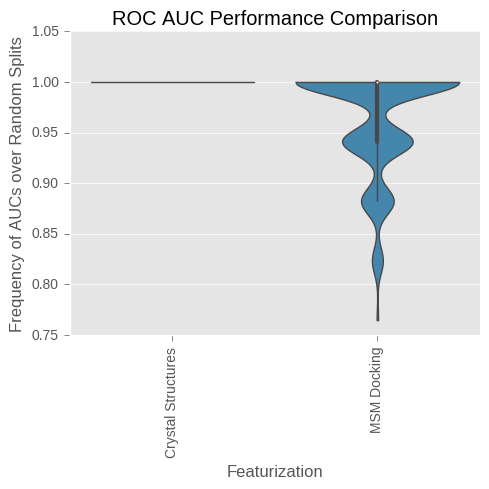

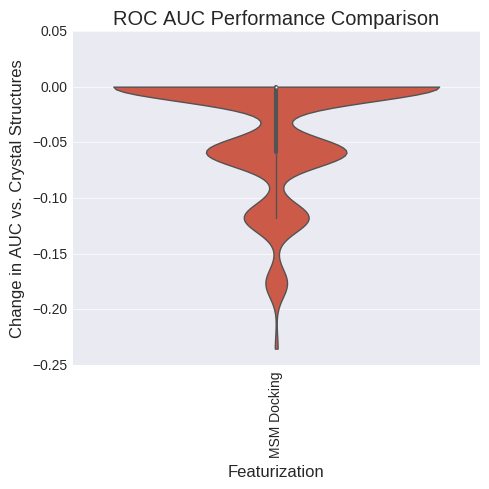

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.739130          0.000000   
MSM Docking           0.809524          0.070393   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.831511478554, 0.887716518056)  


ValueError: list.remove(x): x not in list

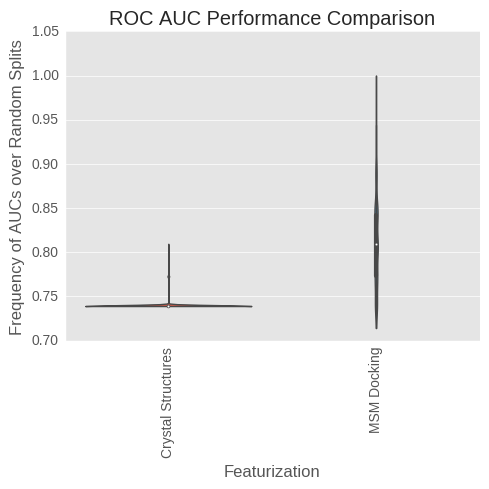

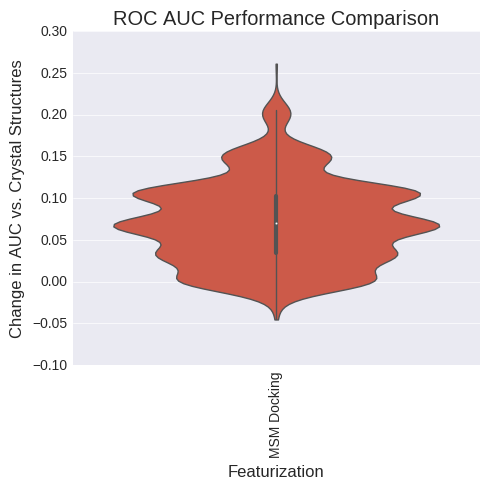

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.260870          0.000000   
MSM Docking           0.190476         -0.070393   

                                       Sign Test 99% CI  
Crystal Structures                             (0, 0.0)  
MSM Docking         (0.00782350679074, 0.0285699231656)  


ValueError: list.remove(x): x not in list

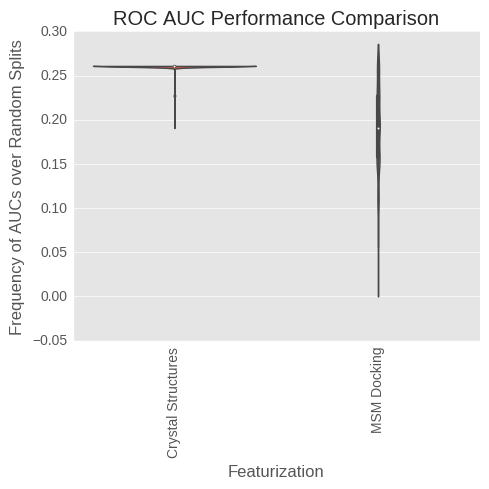

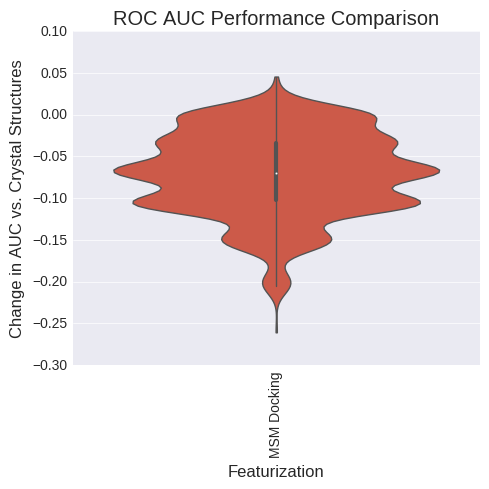

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.715686          0.000000   
MSM Docking           0.754902          0.029412   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.531352711078, 0.611698161176)  


ValueError: list.remove(x): x not in list

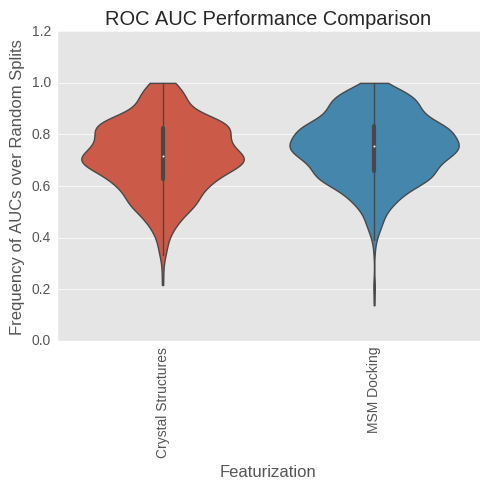

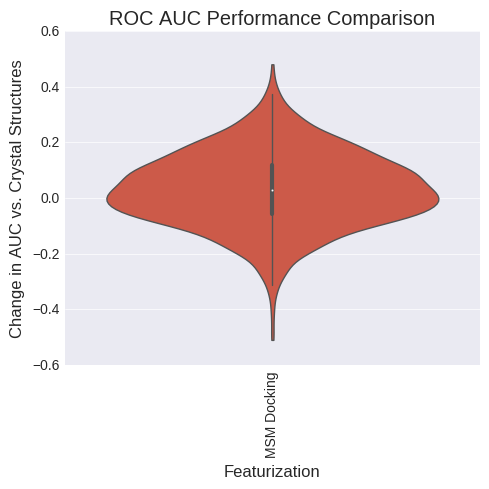

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.854399          0.000000   
MSM Docking           0.947197          0.020305   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.583849332349, 0.662516058755)  


ValueError: list.remove(x): x not in list

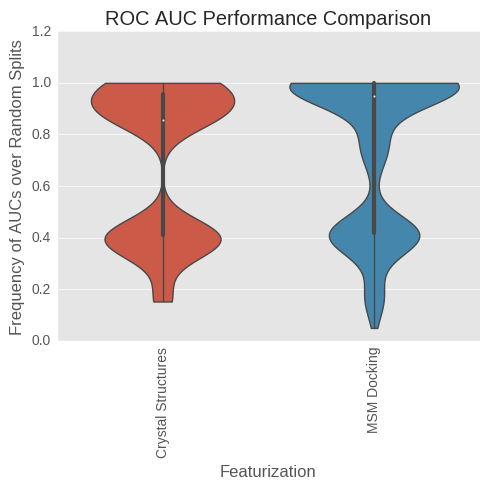

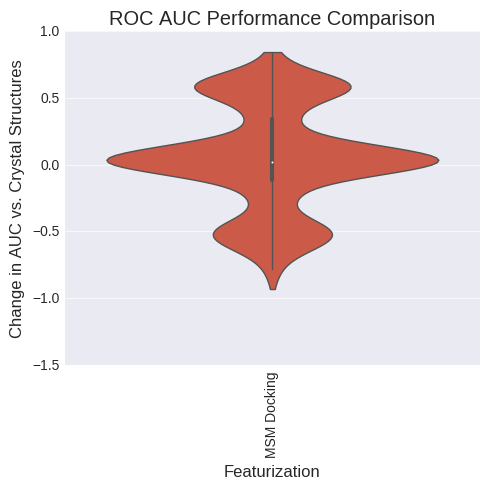

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.180645          0.000000   
MSM Docking           0.198627          0.007682   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.50427405069, 0.585132744469)  


ValueError: list.remove(x): x not in list

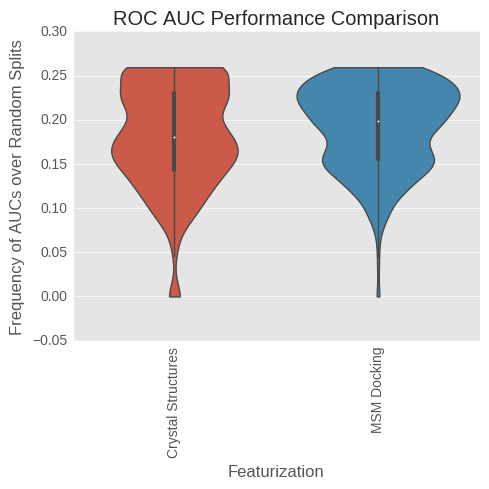

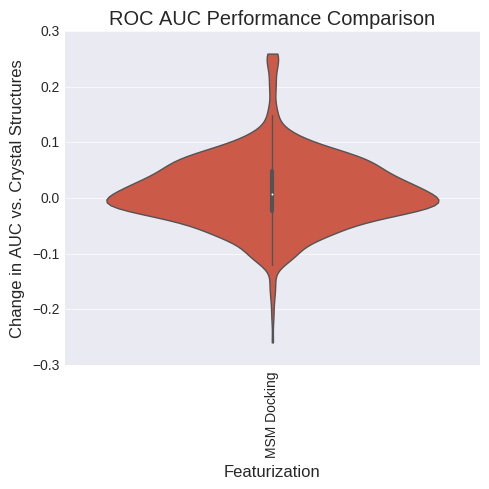

(1, 3)
(1, 3)


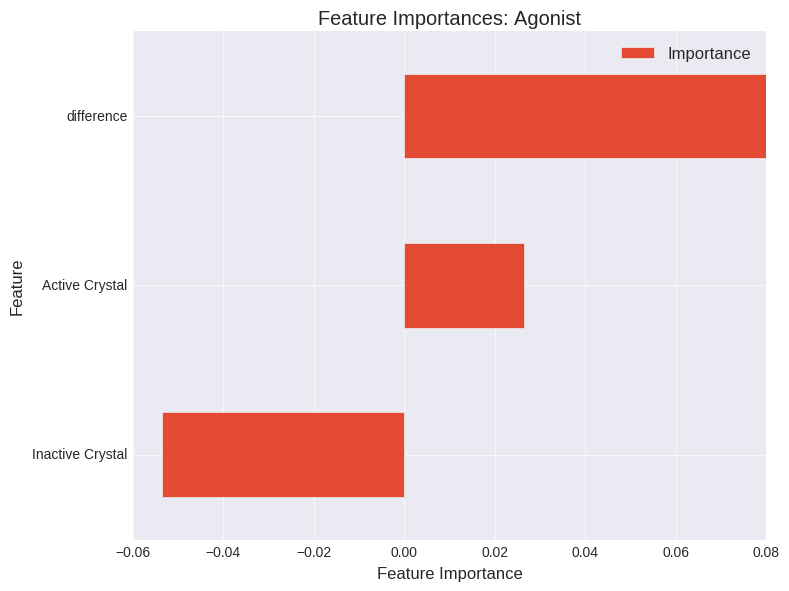

(1, 205)
(1, 205)


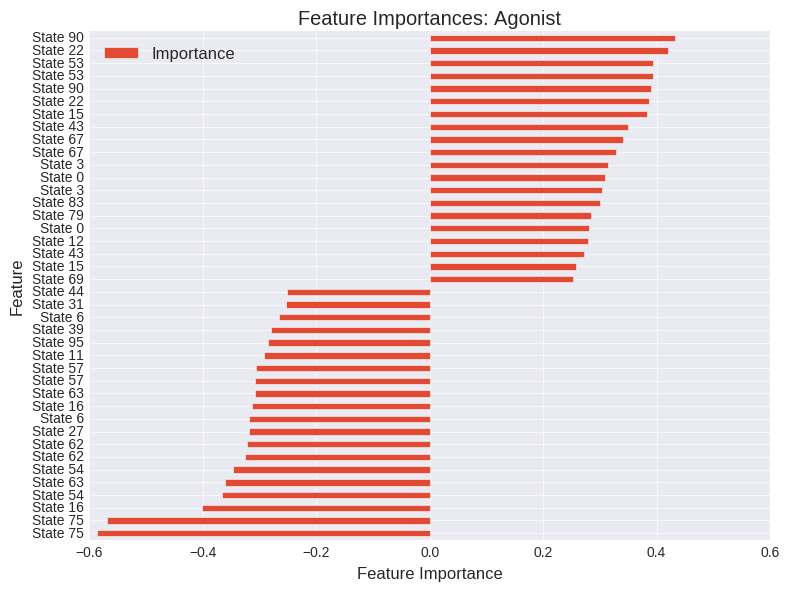

In [559]:
#Normalize False, axis0 True, LR, fentanyl, 0.7, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures      0.9415            0.0000   
MSM Docking             1.0000            0.0585   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.967571463606, 0.990074653427)  


ValueError: list.remove(x): x not in list

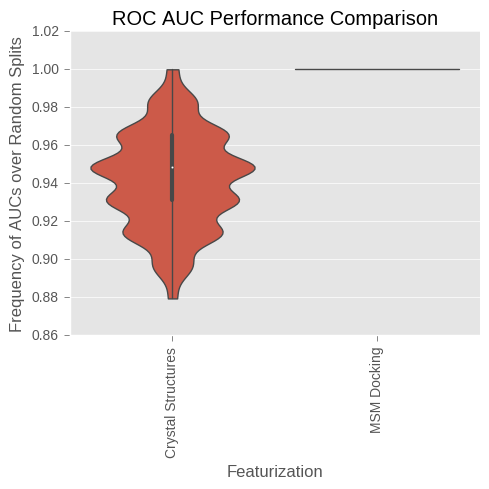

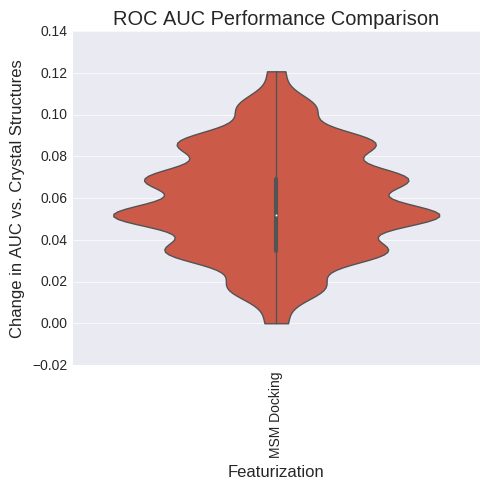

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.821041          0.000000   
MSM Docking           0.806588         -0.014453   

                                  Sign Test 99% CI  
Crystal Structures                        (0, 0.0)  
MSM Docking         (0.1388350005, 0.199554715326)  


ValueError: list.remove(x): x not in list

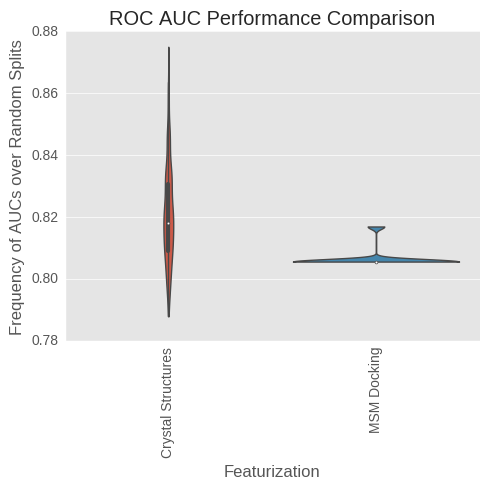

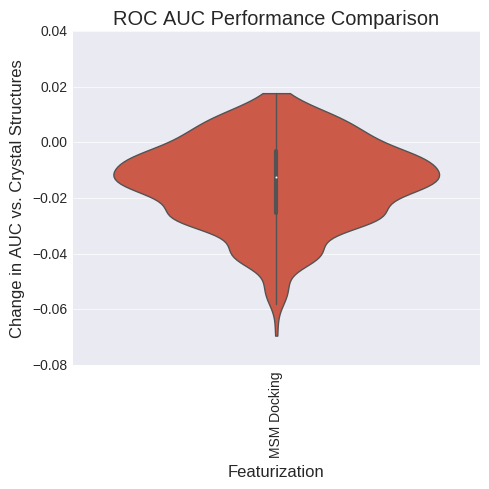

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.178959          0.000000   
MSM Docking           0.193412          0.014453   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.797251326324, 0.85839850484)  


ValueError: list.remove(x): x not in list

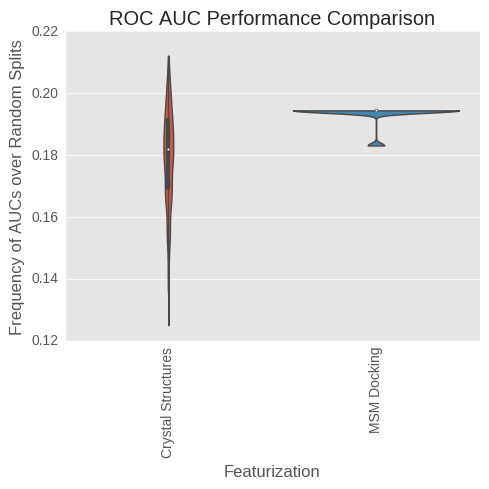

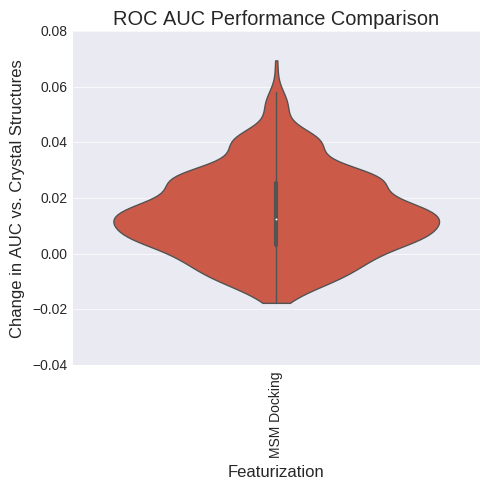

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.718036          0.000000   
MSM Docking           0.836924          0.118888   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.915322916861, 0.954903222684)  


ValueError: list.remove(x): x not in list

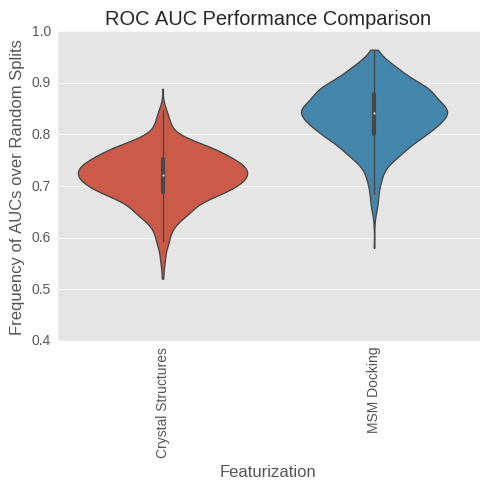

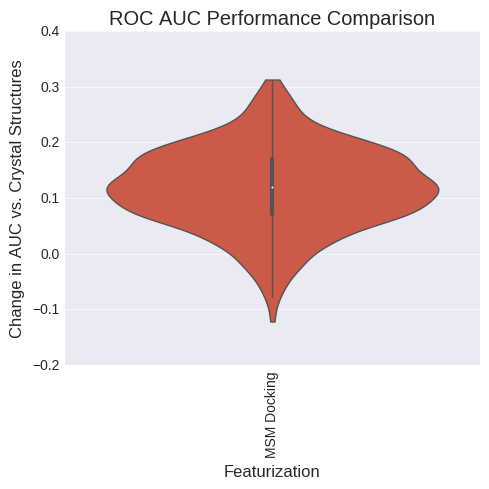

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.963296          0.000000   
MSM Docking           0.958758         -0.004538   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.501272694622, 0.582173647526)  


ValueError: list.remove(x): x not in list

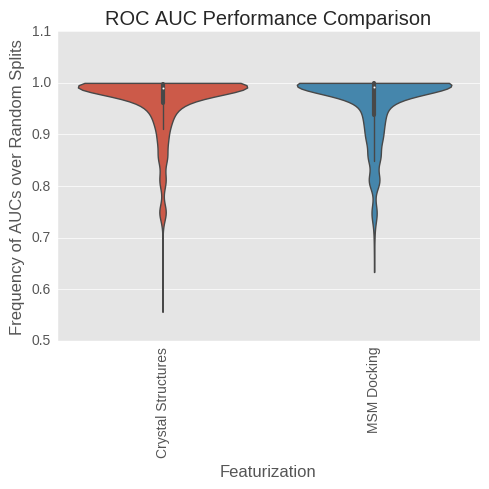

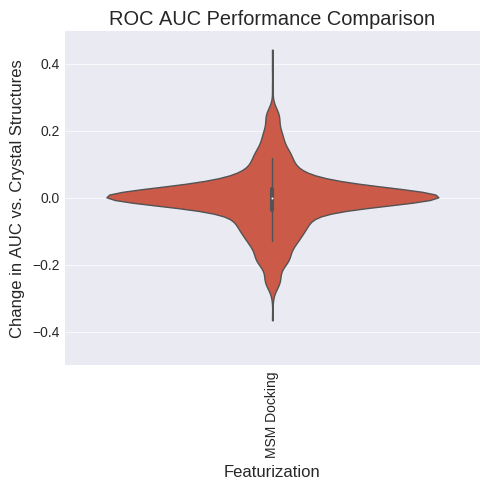

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.232810          0.000000   
MSM Docking           0.290314          0.057504   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.848820965884, 0.902196113449)  


ValueError: list.remove(x): x not in list

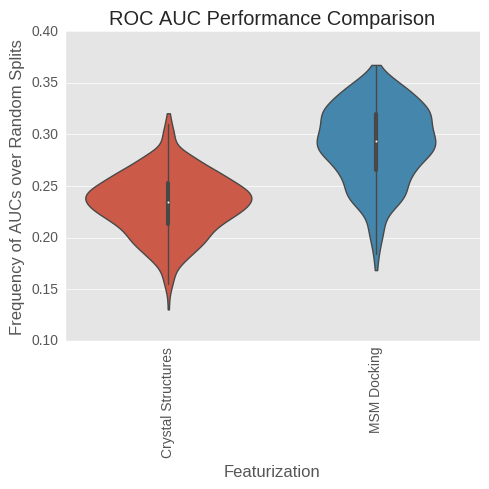

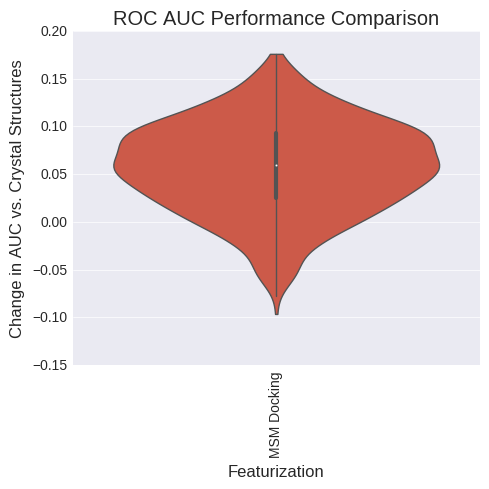

(3,)
(1, 3)


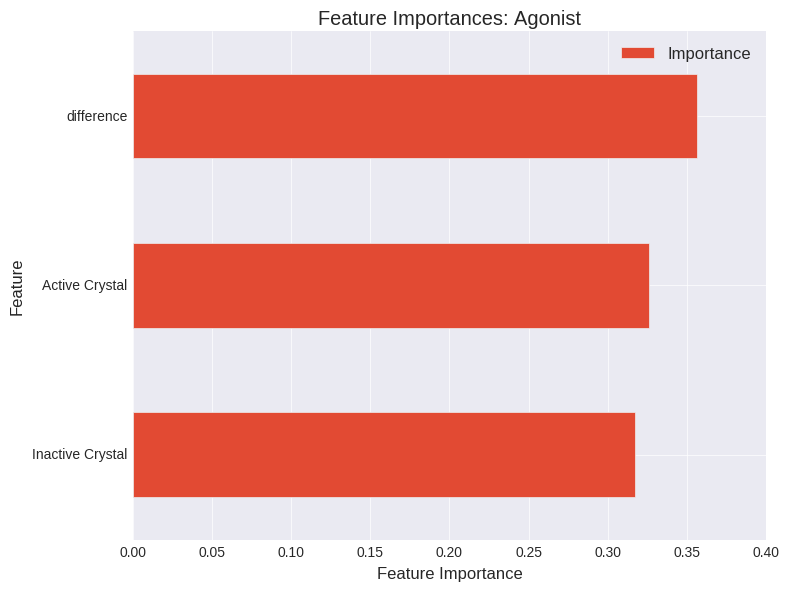

(205,)
(1, 205)


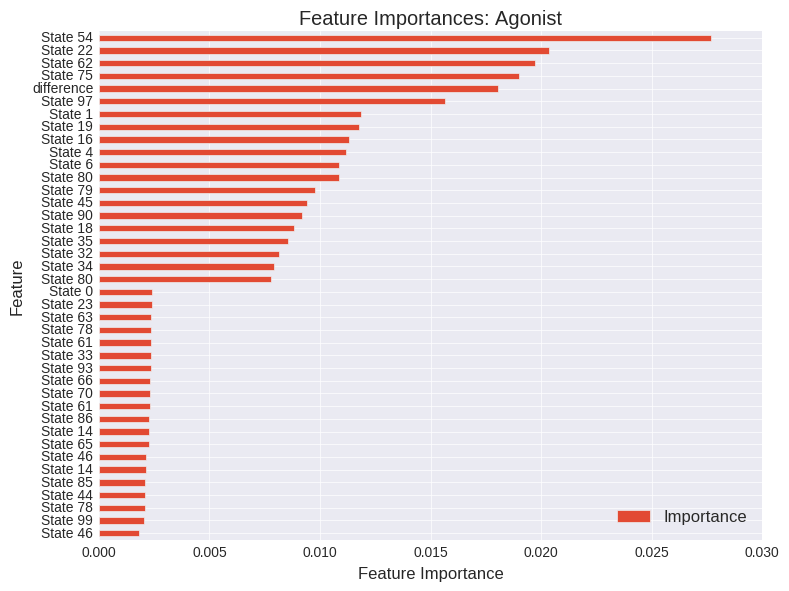

In [360]:
#Normalize False, axis0 True, RFR, fentanyl, 0.6, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.997552          0.000000   
MSM Docking           0.977172         -0.020379   

                                      Sign Test 99% CI  
Crystal Structures                            (0, 0.0)  
MSM Docking         (0.0400320439005, 0.0778209105337)  


ValueError: list.remove(x): x not in list

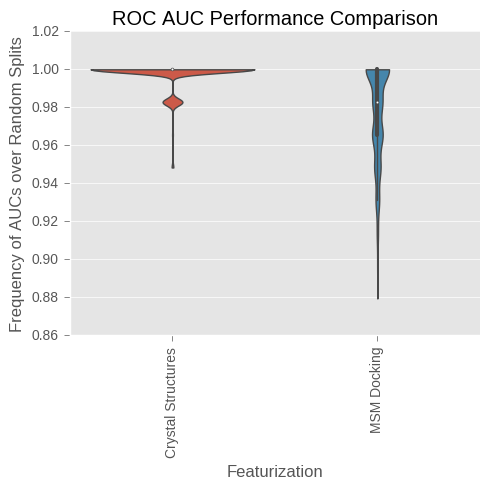

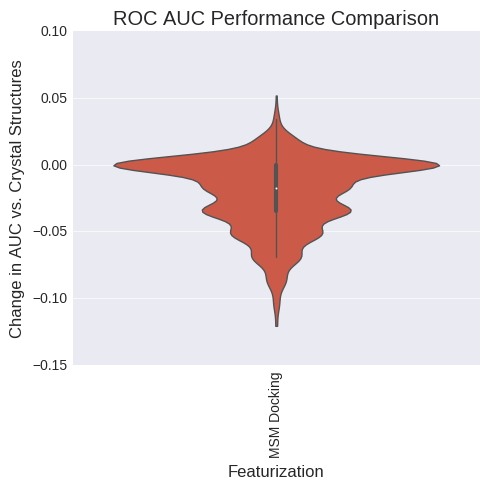

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.805792          0.000000   
MSM Docking           0.841909          0.036118   

                                  Sign Test 99% CI  
Crystal Structures                        (0, 0.0)  
MSM Docking         (0.7038096611, 0.775013397417)  


ValueError: list.remove(x): x not in list

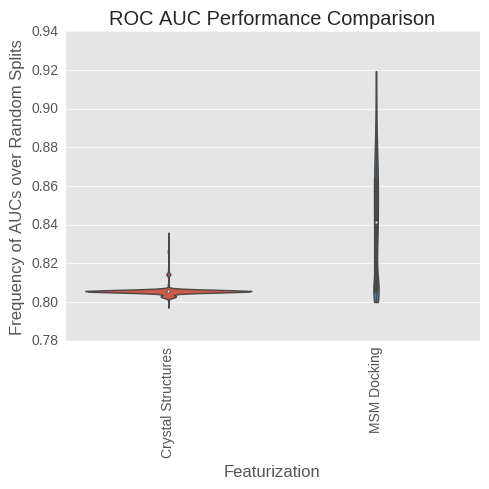

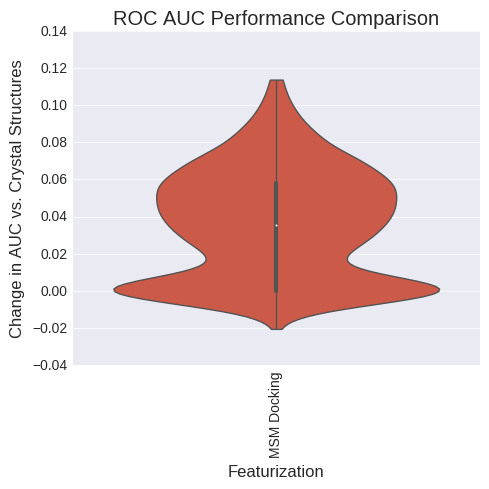

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.194208          0.000000   
MSM Docking           0.158091         -0.036118   

                                       Sign Test 99% CI  
Crystal Structures                             (0, 0.0)  
MSM Docking         (0.00580954161478, 0.0246234353309)  


ValueError: list.remove(x): x not in list

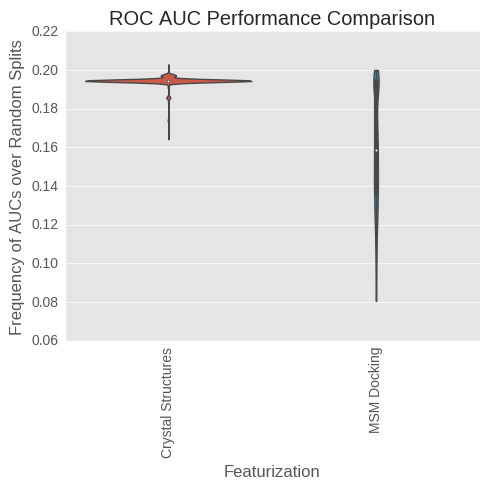

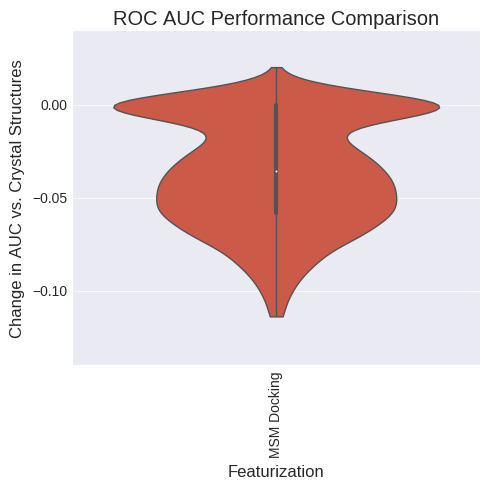

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.554367          0.000000   
MSM Docking           0.765241          0.210874   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.946703228737, 0.977166987903)  


ValueError: list.remove(x): x not in list

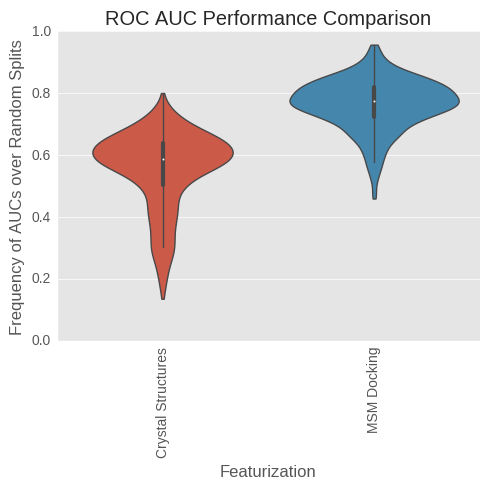

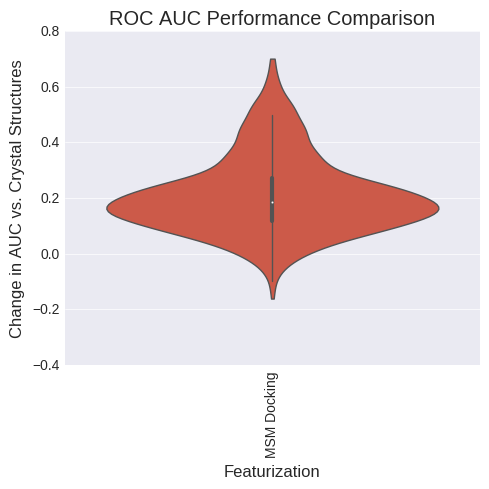

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.643574          0.000000   
MSM Docking           0.815801          0.172228   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.743425178453, 0.810896951531)  


ValueError: list.remove(x): x not in list

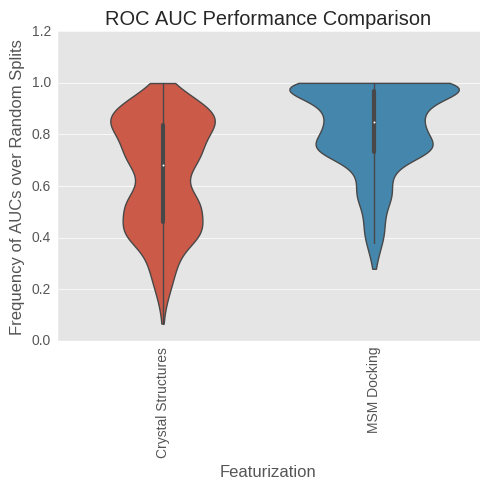

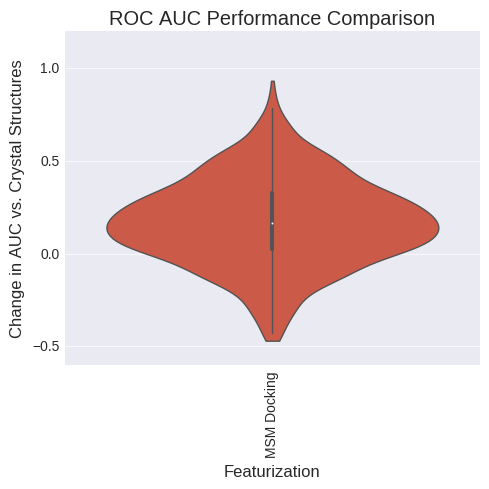

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.142566          0.000000   
MSM Docking           0.241748          0.099182   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.929093027309, 0.964974924277)  


ValueError: list.remove(x): x not in list

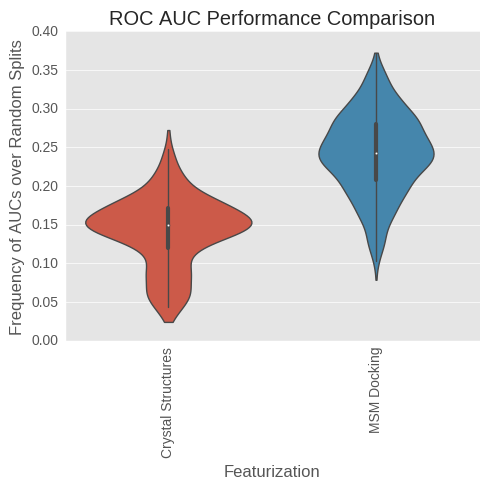

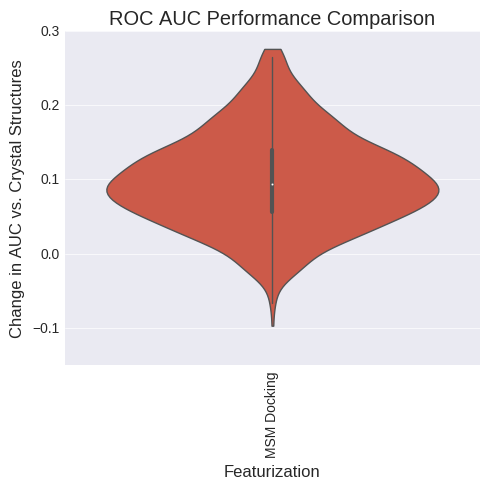

(1, 3)
(1, 3)


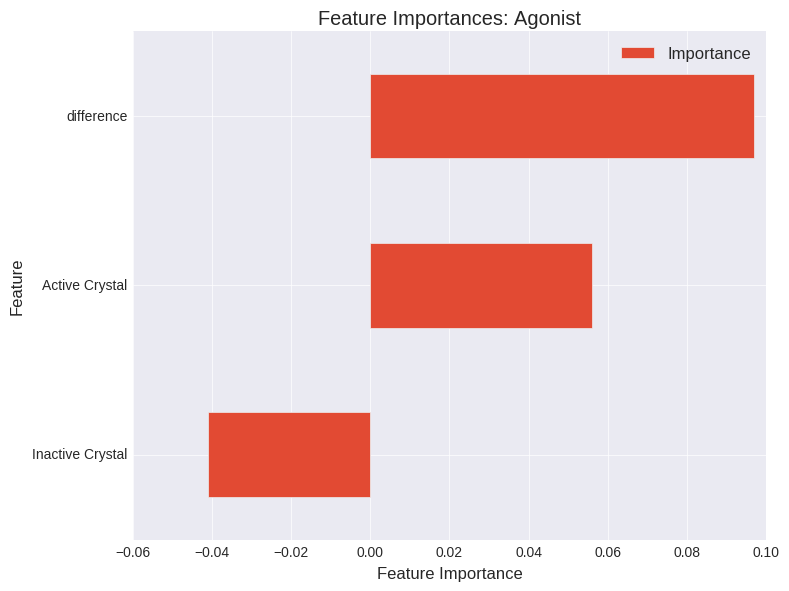

(1, 205)
(1, 205)


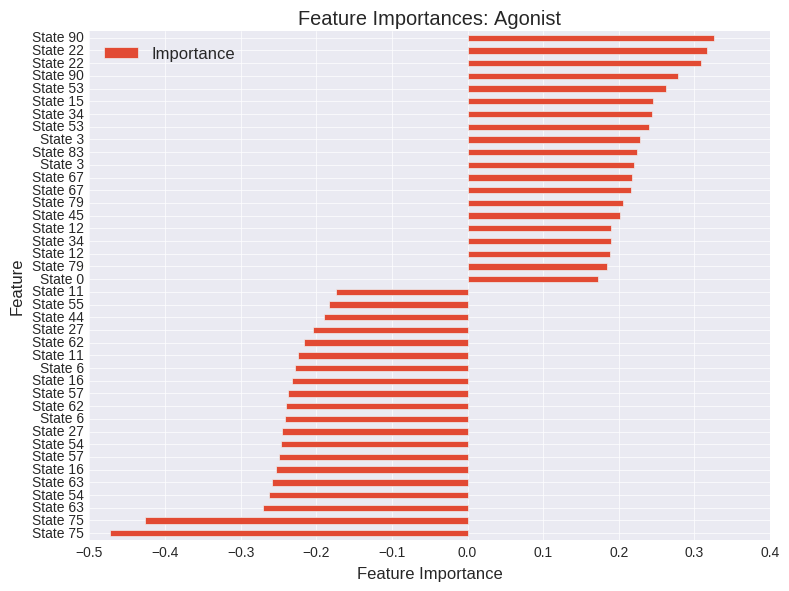

In [362]:
#Normalize False, axis0 True, LR, fentanyl, 0.6, 0.5



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.994814          0.000000   
MSM Docking           0.978279         -0.016535   

                                     Sign Test 99% CI  
Crystal Structures                           (0, 0.0)  
MSM Docking         (0.0684335832569, 0.114984354294)  


ValueError: list.remove(x): x not in list

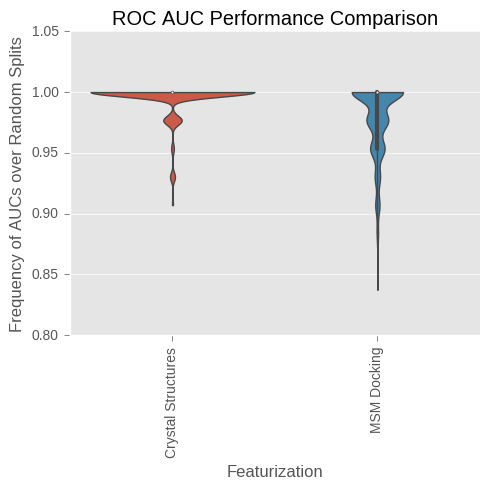

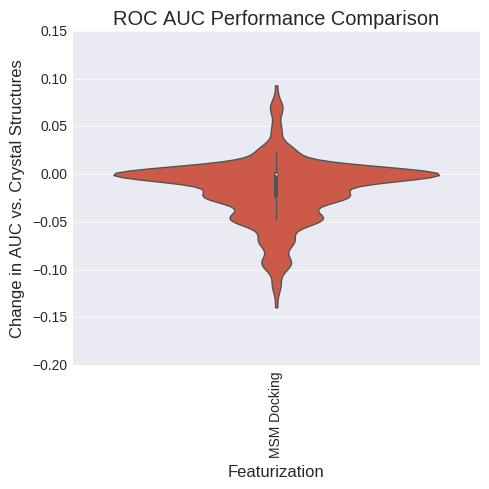

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.747910          0.000000   
MSM Docking           0.783796          0.035886   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.611294313938, 0.688715154261)  


ValueError: list.remove(x): x not in list

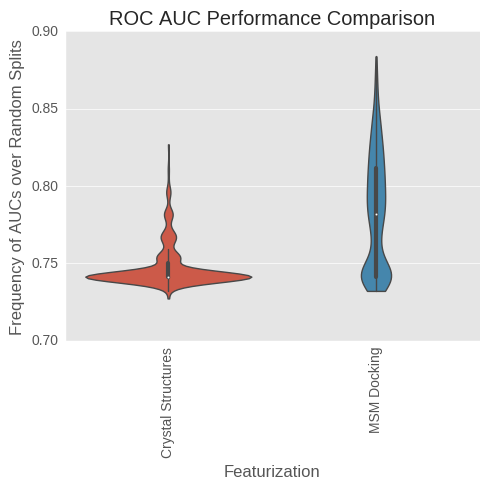

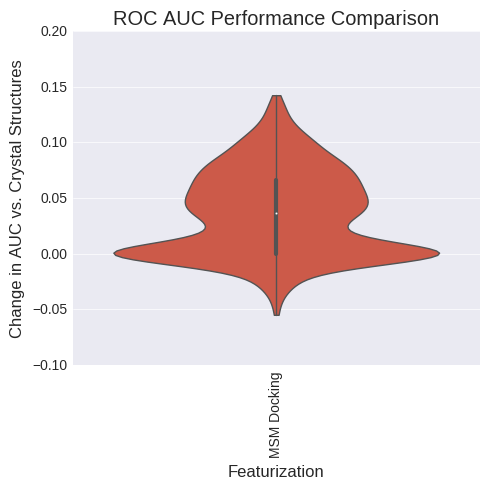

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.252090          0.000000   
MSM Docking           0.216204         -0.035886   

                                     Sign Test 99% CI  
Crystal Structures                           (0, 0.0)  
MSM Docking         (0.0649294153573, 0.110541251513)  


ValueError: list.remove(x): x not in list

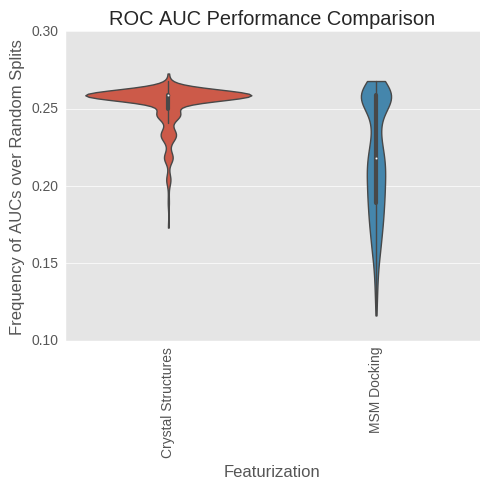

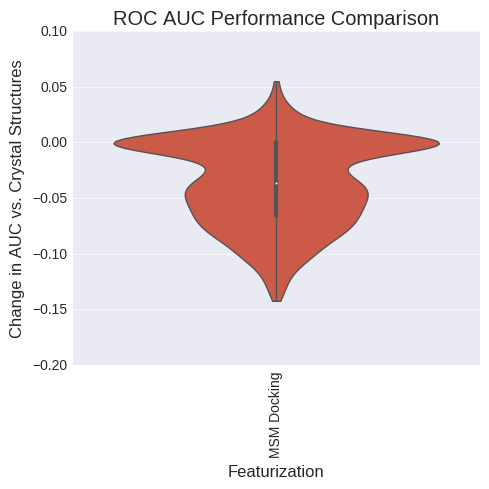

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.614509          0.000000   
MSM Docking           0.740758          0.126249   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.817540256059, 0.875859110838)  


ValueError: list.remove(x): x not in list

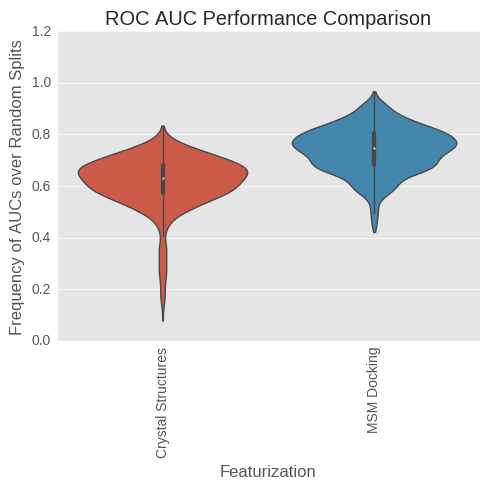

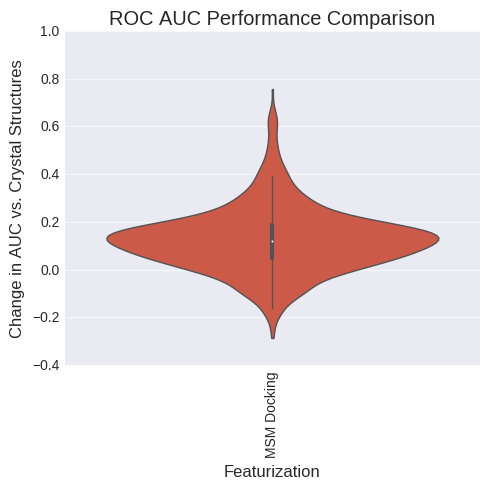

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures     0.54432           0.00000   
MSM Docking            0.66491           0.12059   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.73505358332, 0.803374005302)  


ValueError: list.remove(x): x not in list

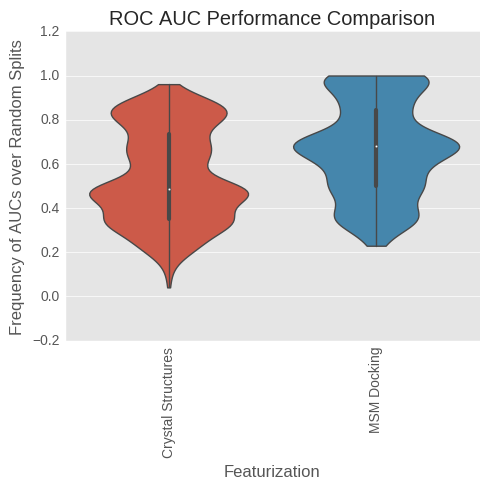

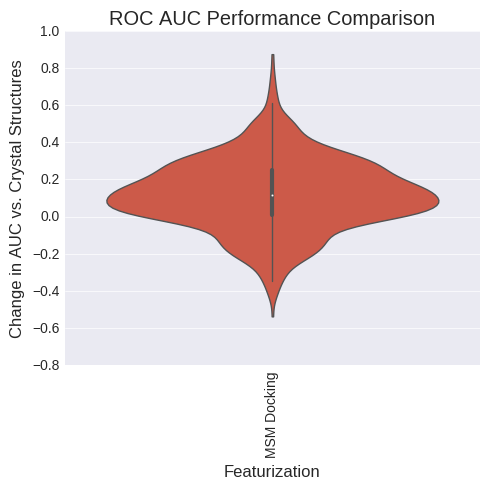

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.158485          0.000000   
MSM Docking           0.224859          0.066374   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.842314075917, 0.896782097394)  


ValueError: list.remove(x): x not in list

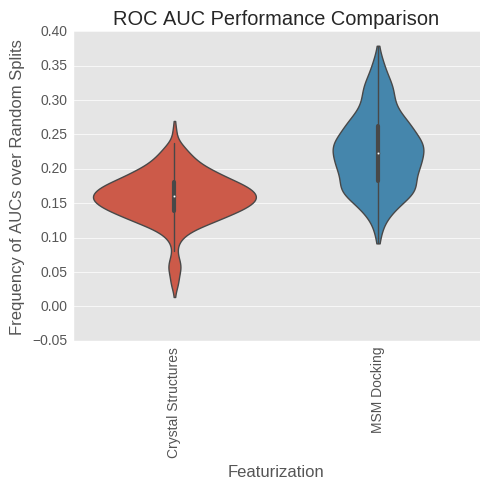

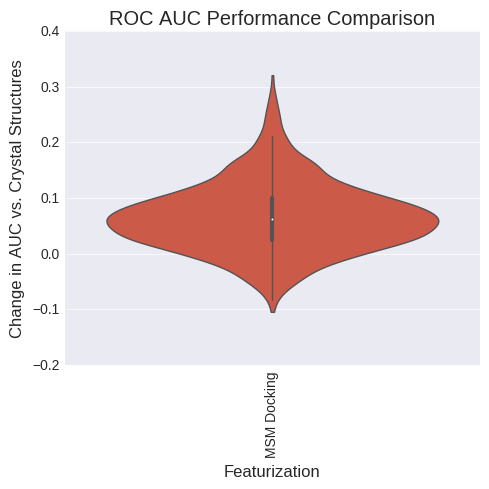

(1, 3)
(1, 3)


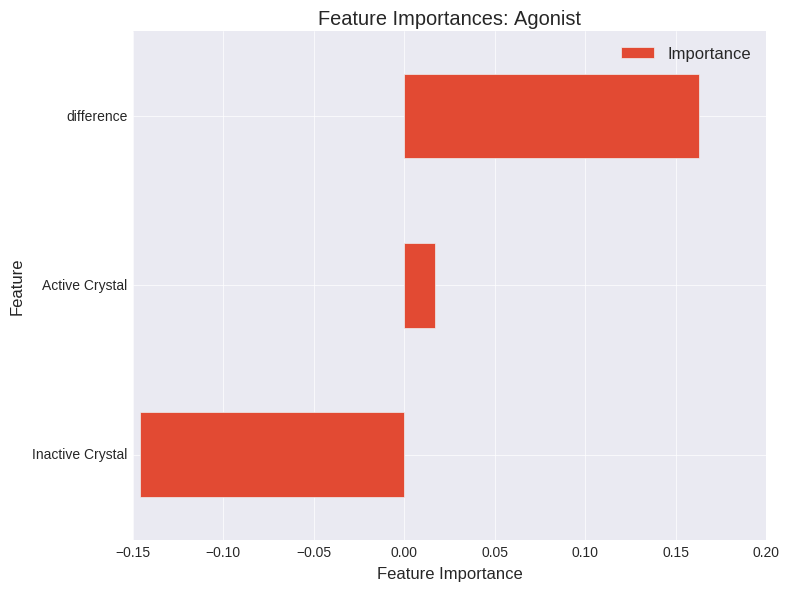

(1, 205)
(1, 205)


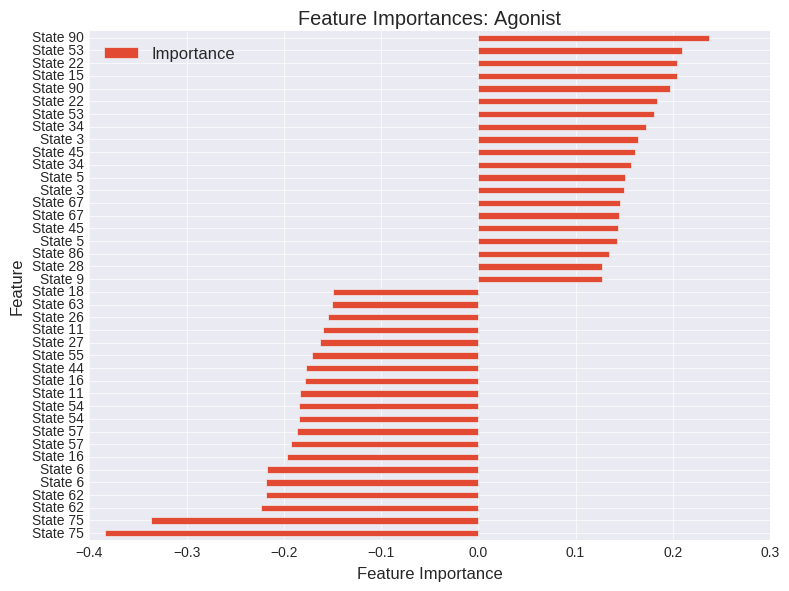

In [378]:
#Normalize False, axis0 True, RFR, fentanyl, 0.7, 0.4



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.995186          0.000000   
MSM Docking           0.977605         -0.017581   

                                     Sign Test 99% CI  
Crystal Structures                           (0, 0.0)  
MSM Docking         (0.0666797353012, 0.112764566909)  


ValueError: list.remove(x): x not in list

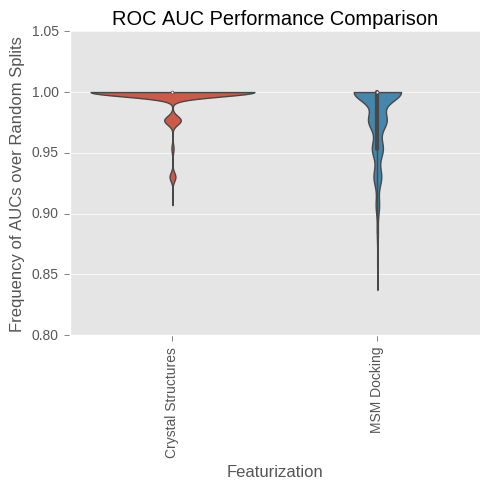

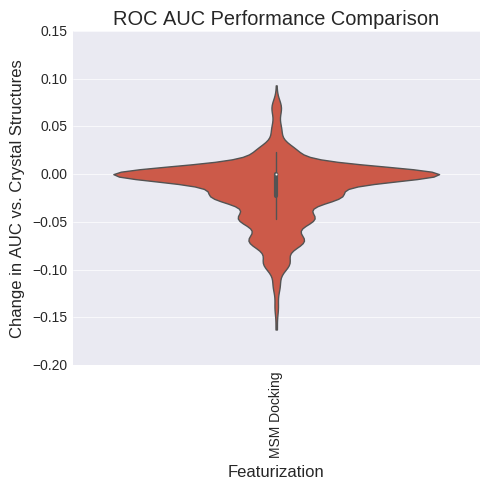

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.746977          0.000000   
MSM Docking           0.781369          0.034392   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.598063551337, 0.67611728715)  


ValueError: list.remove(x): x not in list

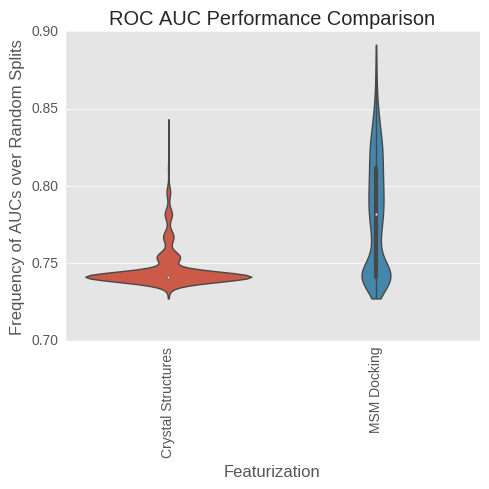

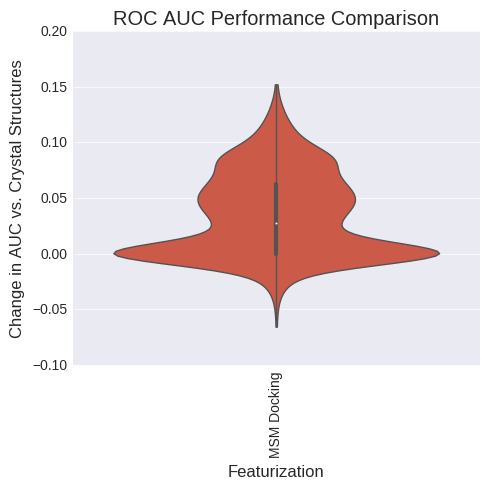

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.253023          0.000000   
MSM Docking           0.218631         -0.034392   

                                      Sign Test 99% CI  
Crystal Structures                            (0, 0.0)  
MSM Docking         (0.0562348582935, 0.0993676318744)  


ValueError: list.remove(x): x not in list

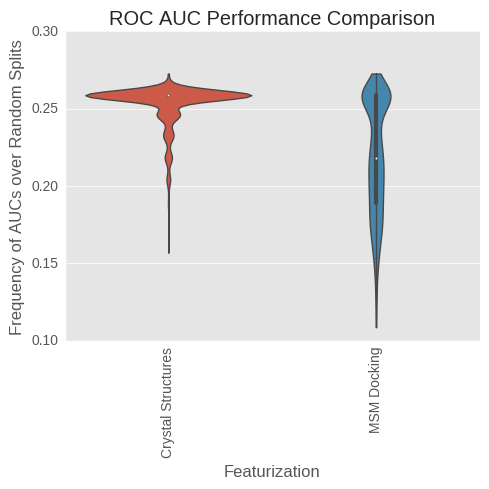

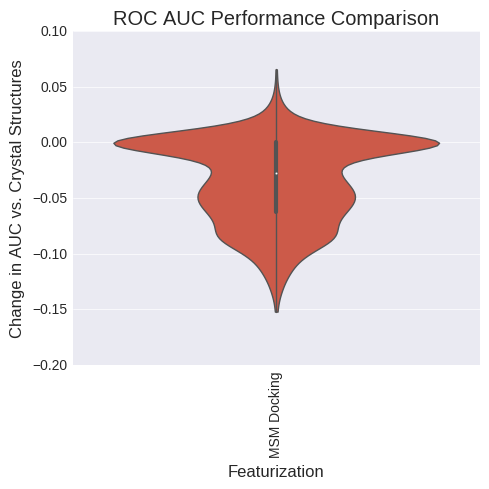

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.621064          0.000000   
MSM Docking           0.737629          0.116565   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.790873534559, 0.852855390584)  


ValueError: list.remove(x): x not in list

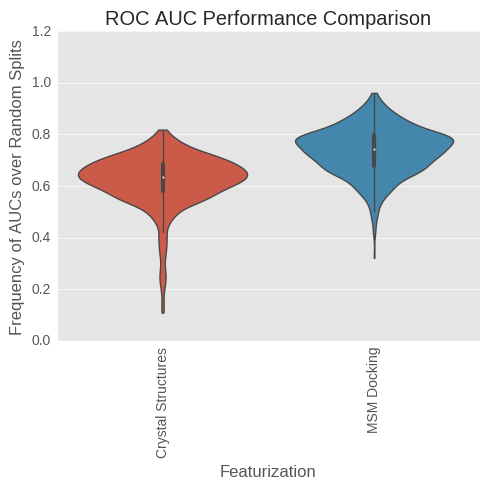

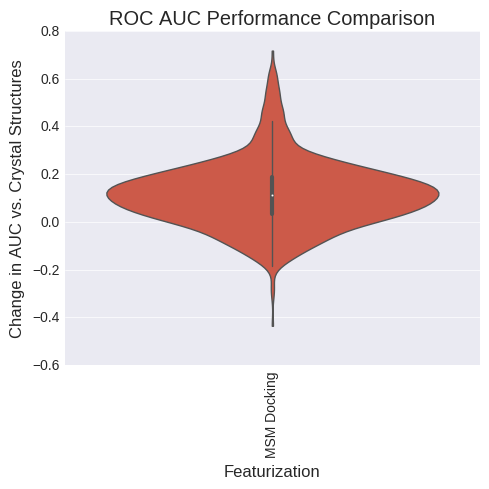

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.556428          0.000000   
MSM Docking           0.659757          0.103329   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.681035911159, 0.754077158614)  


ValueError: list.remove(x): x not in list

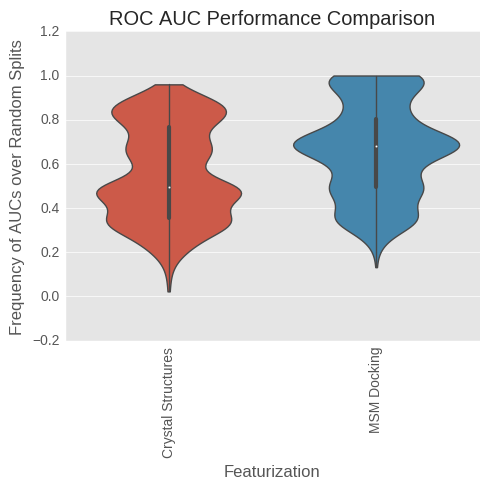

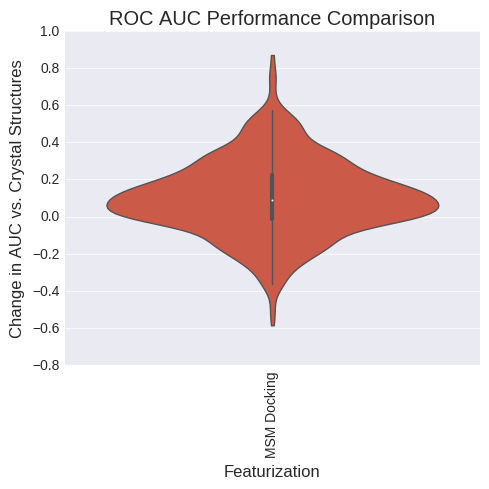

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.161556          0.000000   
MSM Docking           0.223924          0.062368   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.813256594764, 0.872195501453)  


ValueError: list.remove(x): x not in list

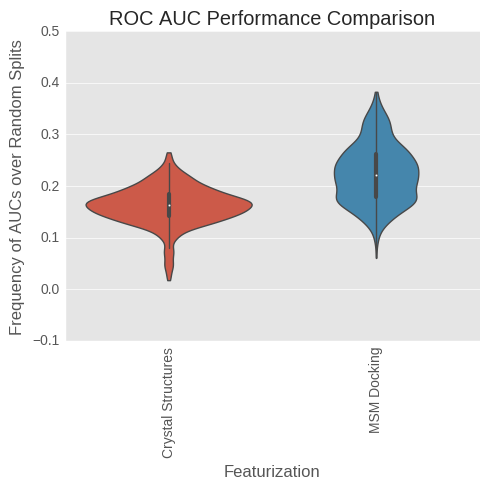

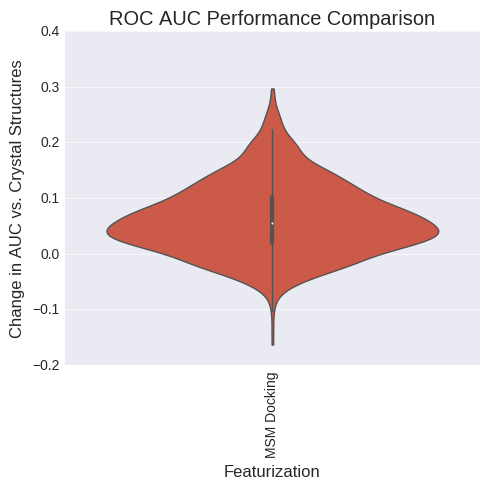

(1, 3)
(1, 3)


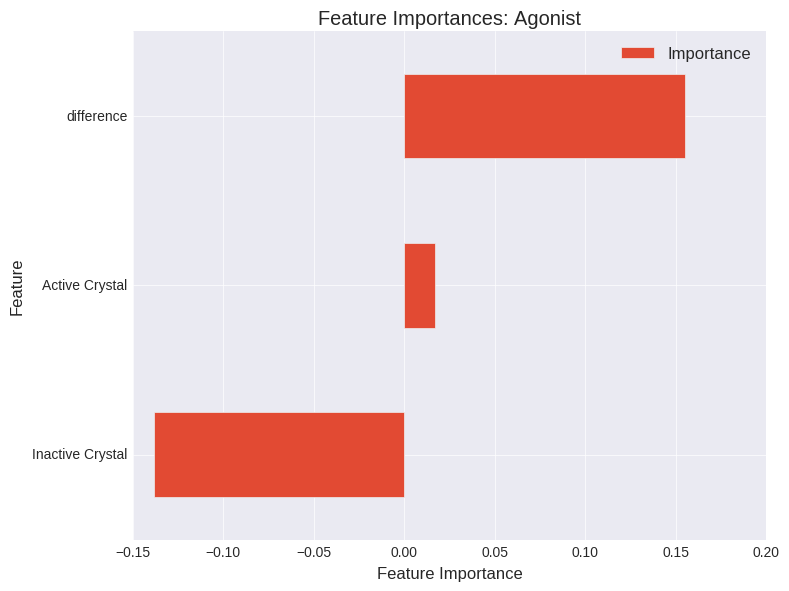

(1, 205)
(1, 205)


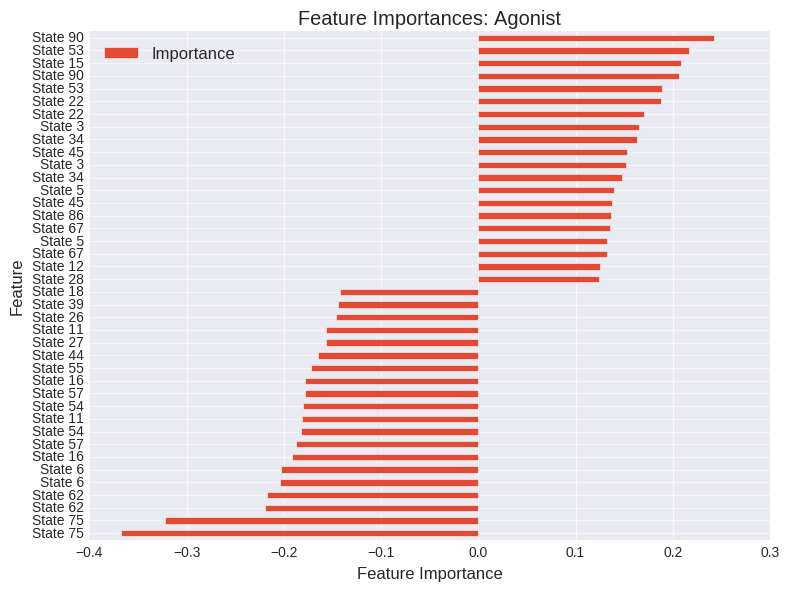

In [376]:
#Normalize False, axis0 True, LR, fentanyl, 0.7, 0.4



importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], model_agonists, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)

In [253]:
fent_ligands = ["18-Methoxycoronaridine", "7-Acetoxymitragynine", "7-Hydroxymitragynine", "Akuammidine","Akuammine", "Coronaridine", "Eseroline", "Hodgkinsine", "Ibogaine", "Mitragynine", "Mitragynine pseudoindoxyl", "Noribogaine", "Pericine", "Pseudoakuammigine"]
fent_ligands = [n for n in ligand_df.index.values.tolist() if n in fent_ligands or (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Eseroline"]["fp"]) > .8]
antagonists = [n for n in ligand_df.loc[ligand_df.label == 0.].index.values.tolist() if n not in fent_ligands]
other_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n not in fent_ligands and (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Eseroline"]["fp"]) < .6]



In [265]:
fent_ligands = ["18-Methoxycoronaridine", "7-Acetoxymitragynine", "7-Hydroxymitragynine", "Akuammidine","Akuammine", "Coronaridine", "Eseroline", "Hodgkinsine", "Ibogaine", "Mitragynine", "Mitragynine pseudoindoxyl", "Noribogaine", "Pericine", "Pseudoakuammigine"]
fent_ligands = [n for n in ligand_df.index.values.tolist() if n in fent_ligands or (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Eseroline"]["fp"]) > .8]

fent_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n in fent_ligands]
antagonists = [n for n in ligand_df.loc[ligand_df.label == 0.].index.values.tolist() if n not in fent_ligands]
other_agonists = [n for n in ligand_df.loc[ligand_df.label == 1.].index.values.tolist() if n not in fent_ligands and (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Eseroline"]["fp"]) < .5]




In [266]:
len(other_agonists)

188

In [281]:
ligand_df.iloc[non_fentanyl_agonist_inds]

,name,action,ligand,label
ligand,,,,
7-PET,7-PET,agonist,7-PET,1.0
Acetorphine,Acetorphine,agonist,Acetorphine,1.0
Adrenorphin,Adrenorphin,agonist,Adrenorphin,1.0
Akuammine,Akuammine,agonist,Akuammine,1.0
Alimadol,Alimadol,agonist,Alimadol,1.0
Alphamethadol,Alphamethadol,agonist,Alphamethadol,1.0
Azidomorphine,Azidomorphine,agonist,Azidomorphine,1.0
BDPC,BDPC,agonist,BDPC,1.0
Benzhydrocodone,Benzhydrocodone,agonist,Benzhydrocodone,1.0


In [227]:
set(fentanyl_inds).intersection(set(antagonist_inds))

set()

In [226]:
len(fentanyl_inds)

32

In [171]:
ligand_df.shape

(252, 4)

In [167]:
fent_ligands = [n for n in ligand_df.index.values.tolist() if "fent" in n.lower()]# or (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Fentanyl"]["fp"]) > .7]
fent_ligands = [n for n in ligand_df.index.values.tolist() if "fent" in n.lower() or (new_ligand_df.loc[n]["fp"] | new_ligand_df.loc["Fentanyl"]["fp"]) > .6]
len(fent_ligands)


54

                    Median AUC  Median delta AUC  \
Crystal Structures    0.789062           0.00000   
MSM Docking           0.914062           0.12207   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.868469952086, 0.918309845311)  


ValueError: list.remove(x): x not in list

                    Median AUC  Median delta AUC  \
Crystal Structures    0.235320          0.000000   
MSM Docking           0.276487          0.039033   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.787689565687, 0.850078906445)  


ValueError: list.remove(x): x not in list

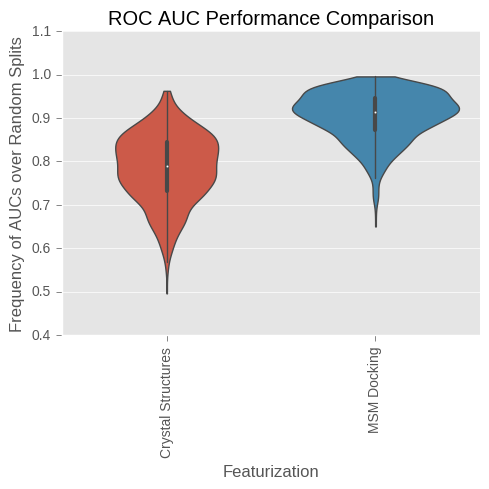

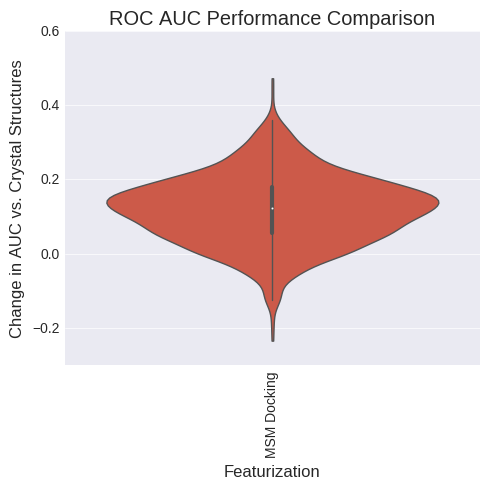

(3,)
(1, 3)


ValueError: Shape of passed values is (1, 3), indices imply (1, 103)

In [105]:
print(np.mean(c_aucs))
print(np.mean(m_aucs))
print(np.mean(c_log_aucs))
print(np.mean(m_log_aucs))

0.845661450925
0.895590327169
0.18615934073
0.180907569367
The history saving thread hit an unexpected error (OperationalError('unable to open database file',)).History will not be written to the database.


In [107]:
pd.DataFrame(results_dict[save_name]['Crystal Structures'][0].predict_proba(C_test), columns=["proba", "probb"], index=test_ligands).sort("probb", ascending=False, inplace=False)

/home/enf/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,proba,probb
Alphamethylthiofentanyl,0.000,1.000
Betahydroxyfentanyl,0.000,1.000
Acrylfentanyl,0.000,1.000
Thiofentanyl,0.002,0.998
Lofentanil,0.002,0.998
Acetylfentanyl,0.004,0.996
Carfentanil,0.004,0.996
Remifentanil,0.006,0.994
Alfentanil,0.008,0.992
Ohmefentanyl,0.014,0.986


In [ ]:
roc_auc_score(convert_to_n_class(y_test[:,0]), results_dict[save_name]['MSM Docking'][0].predict_proba(C_test))

In [90]:
results_dict = {}

In [345]:
ligand_df.index.values.tolist()

['7-pet',
 'acetorphine',
 'acetyldihydrocodeine',
 'acetylfentanyl',
 'acetylmethadol',
 'acetylpropionylmorphine',
 'acrylfentanyl',
 'ad-1211',
 'adrenorphin',
 'ah-7921',
 'akuammine',
 'alfentanil',
 'alimadol',
 '3-allylfentanyl',
 'allylnorpethidine',
 'allylprodine',
 'alphacetylmethadol',
 'alphamethadol',
 'alphamethylthiofentanyl',
 'anileridine',
 'azaprocin',
 'azidomorphine',
 'bdpc',
 'benzethidine',
 'benzhydrocodone',
 'benzylmorphine',
 'betacetylmethadol',
 'betahydroxyfentanyl',
 'betahydroxythiofentanyl',
 'betamethadol',
 'bezitramide',
 'brifentanil',
 'bromadoline',
 'buprenorphine',
 'butyrfentanyl',
 'bw373u86',
 'c-8813',
 '8-carboxamidocyclazocine',
 'carfentanil',
 'cebranopadol',
 'chloromorphide',
 'chloroxymorphamine',
 '14-cinnamoyloxycodeinone',
 'ciprefadol',
 'ciramadol',
 'clonitazene',
 'codeine-6-glucuronide',
 'codeinone',
 'codoxime',
 'conorfone',
 'dadle',
 'damgo',
 'dermorphin',
 'desmethylclozapine',
 'desmethylprodine',
 'o-desmethyltramad

In [528]:
X_df = full_docking_df
X_df["difference"] = X_df["Active Crystal"].subtract(X_df["Inactive Crystal"])
X_df = X_df.dropna()
C_df = X_df[[n for n in X_df.columns.values.tolist() if "State" not in n]]

if not os.path.exists("%s/x_df.pkl" %analysis_dir):
    with open("%s/x_df.pkl" %analysis_dir, "wb") as f:
        pickle.dump(X_df, f, protocol=2)

ligand_df = copy.deepcopy(full_ligand_df[[c for c in full_ligand_df.columns.values if "fp" not in c.lower()]]).drop_duplicates(subset=['name'], keep='first')
ligand_df = ligand_df.loc[[n for n in ligand_df.index.values if n in full_docking_df.index.values]]
print(full_ligand_df.shape)
print(ligand_df.shape)

classes = ligand_df["Edits"].values.tolist()
class_labels = []
indices = []
n_antagonists = 0
n_agonists = 0
non_existing_ligands = []
for i, label in enumerate(classes):
        if "antagonist" == label.lower():# or "neutral" in label.lower() or "negative" in label.lower():
                class_labels.append(0.)
                indices.append(i)
                n_antagonists += 1
        elif "agonist" == label.lower():# or "positive" in label.lower():
                class_labels.append(1.)
                indices.append(i)
                n_agonists += 1
        else:
                non_existing_ligands.append(ligand_df.index.values[i])

print("n_antagonists: %d" %n_antagonists)
print("n_agonists: %d" %n_agonists)


ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels

model_agonists = ligand_df.index.values

y = ligand_df["label"].values.reshape((-1,1))
y_df = pd.DataFrame(y, index=ligand_df.index)

n_trials = 1000
train_test_split_prop = 0.9
model_type = "rfr"
def normalize_per_ligand(df):
    new_df = copy.deepcopy(df)
    n_df = new_df.ix[:, [i for i in range(0, new_df.shape[1]) if "difference" not in new_df.columns.values[i].lower()]]
    n_df = pd.DataFrame(preprocessing.scale(n_df.values, axis=1), index=n_df.index, columns=n_df.columns.values.tolist())
    new_df = pd.concat([new_df, n_df], axis=1)
    return(new_df)

normalize = False
normalize_axis0 = True
if normalize_axis0:
    double_features = 2
    new_df = normalize_per_ligand(X_df)
else: 
    new_df = X_df
    double_features = 1
n_estimators = 1000

features = [C_df.loc[model_agonists], new_df.loc[model_agonists]]#, all_features_df]#, all_features]
feature_names = ["Crystal Structures", "MSM Docking"]
print([f.shape for f in features])
save_name = "agonist_%s_trials%d_split%s_normalize%s_normalize-axis0%s_n-estimators%d_precision%s" %(model_type, n_trials, str(train_test_split_prop), str(normalize), str(normalize_axis0), n_estimators, precision)

if not os.path.exists("%s/%s_new_df.pkl" %(analysis_dir, save_name)):
    with open("%s/%s_new_df.pkl" %(analysis_dir, save_name), "wb") as f:
        pickle.dump(new_df, f, protocol=2)

(334, 10)
(265, 9)
n_antagonists: 27
n_agonists: 158
[(185, 3), (185, 205)]


In [527]:
"%s/%s_new_df.pkl" %(analysis_dir, save_name)

'/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components10all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_regularization_wolf_autoShrinkage0pt01-backup/analysis_n_clusters100_random/agonist_rfr_trials1000_split0.9_normalizeFalse_normalize-axis0True_n-estimators1000_precisionXP_new_df.pkl'

In [509]:
pd.DataFrame(ligand_df[["action"]])

,action
name,
7-pet,agonist
acetylfentanyl,agonist
acetylmethadol,agonist
acrylfentanyl,agonist
ah-7921,agonist
alfentanil,agonist
alimadol,agonist
3-allylfentanyl,agonist
allylnorpethidine,agonist


In [521]:
results_dict[save_name] = generate_or_load_model(features, y, feature_names,
                                                 n_trials, train_test_split_prop, False,
                                                 model_type, "%s/%s.pkl" %(analysis_dir, save_name),
                                                 redo=True, worker_pool=dview, parallel=True, n_estimators=n_estimators, 
                                                 max_depth=None, criterion='gini',
                                                 normalize=normalize, normalize_axis0=False)

Aobut to fit model(s).
Fitting models over all data...
Fitting models over split train data...
Finished fitting models


In [ ]:
[n for n in ]

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures         1.0               0.0   
MSM Docking                1.0               0.0   

                                       Sign Test 99% CI  
Crystal Structures                             (0, 0.0)  
MSM Docking         (0.00167204411098, 0.0148532091434)  


ValueError: list.remove(x): x not in list

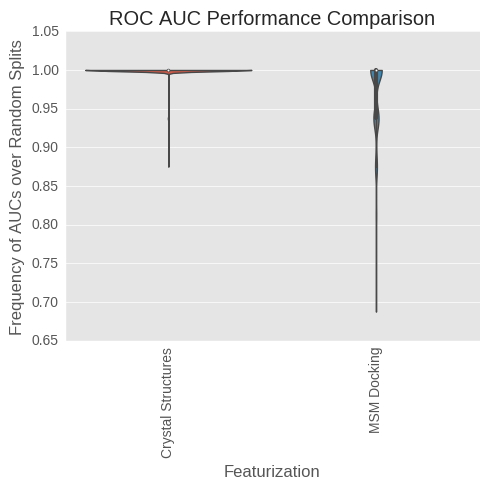

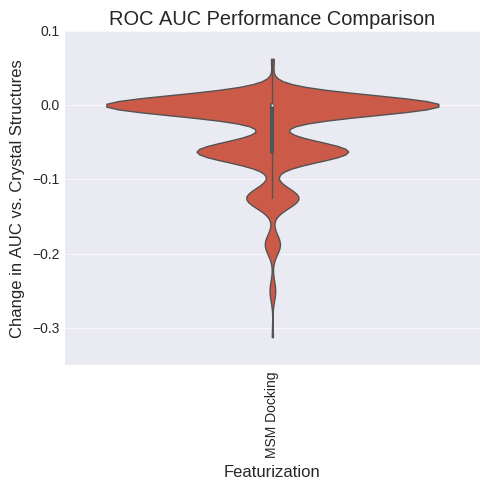

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.842105          0.000000   
MSM Docking           0.888889          0.046784   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.665570348092, 0.739740456628)  


ValueError: list.remove(x): x not in list

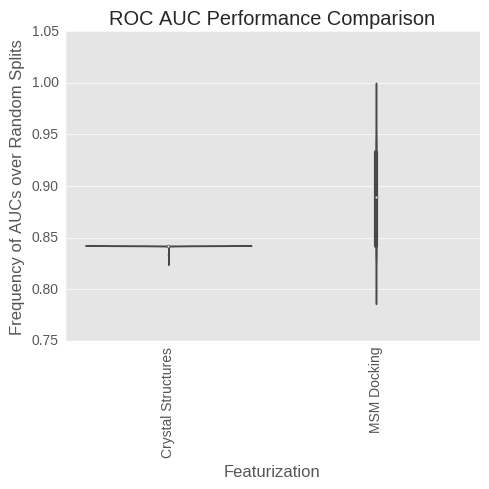

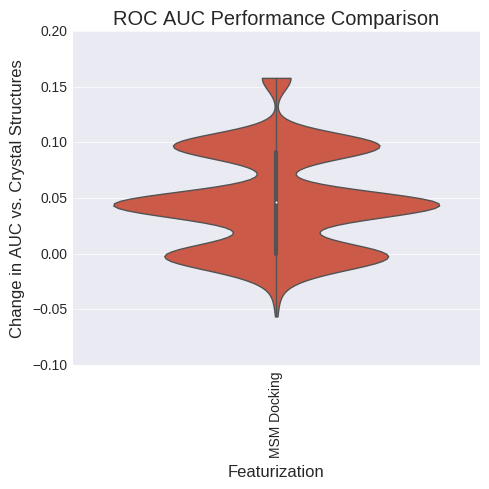

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.157895          0.000000   
MSM Docking           0.111111         -0.046784   

                                     Sign Test 99% CI  
Crystal Structures                           (0, 0.0)  
MSM Docking         (0.0790252528016, 0.128234496791)  


ValueError: list.remove(x): x not in list

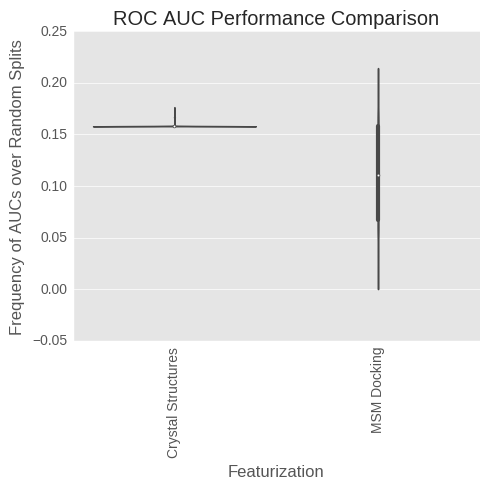

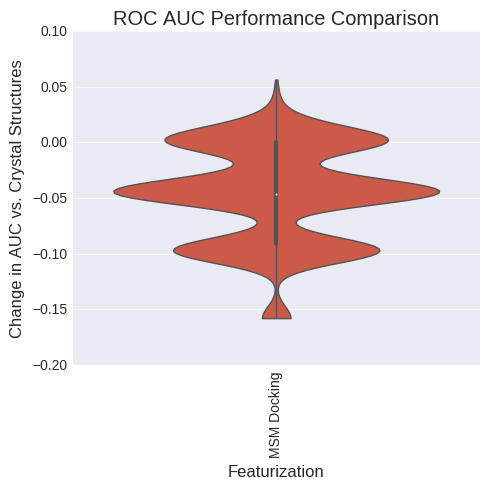

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures      0.6250          0.000000   
MSM Docking             0.8125          0.166667   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.782390029746, 0.845444354035)  


ValueError: list.remove(x): x not in list

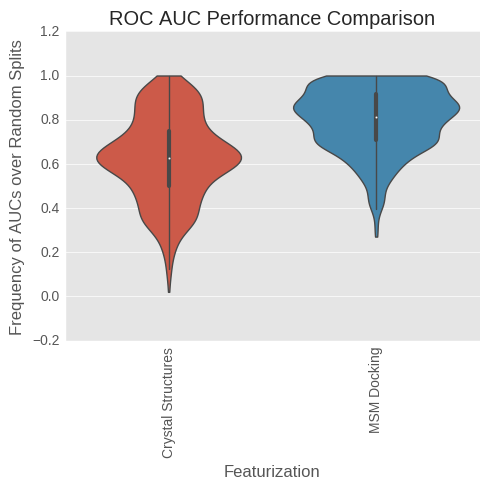

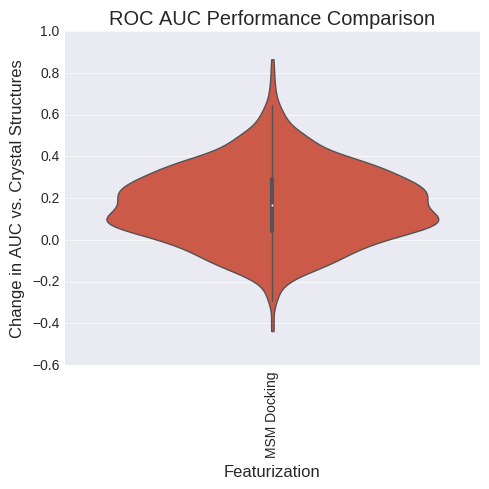

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.971092          0.000000   
MSM Docking           0.999980          0.018817   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.746569127054, 0.81371345594)  


ValueError: list.remove(x): x not in list

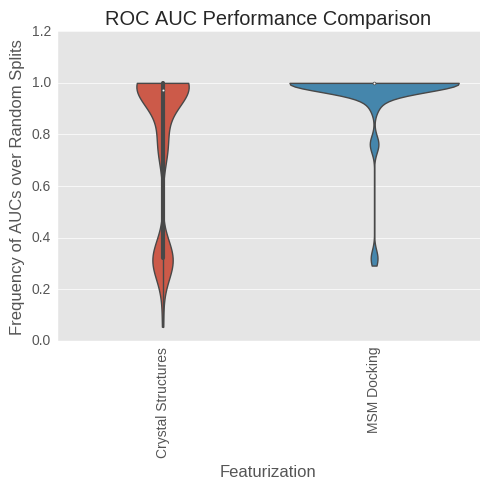

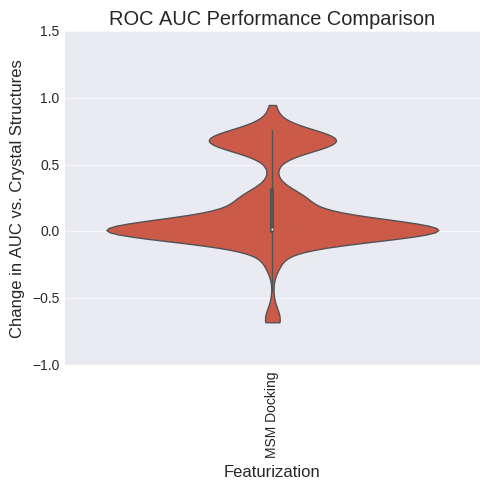

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.129220          0.000000   
MSM Docking           0.142829          0.012543   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.586892283832, 0.665433560282)  


ValueError: list.remove(x): x not in list

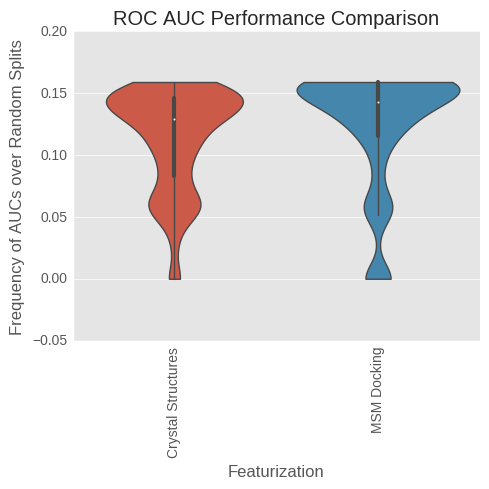

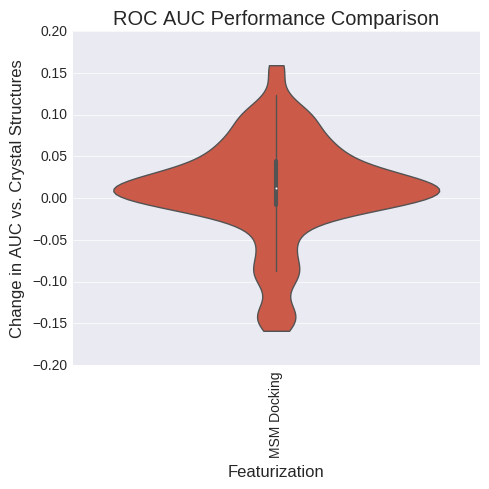

(1, 3)
(1, 3)


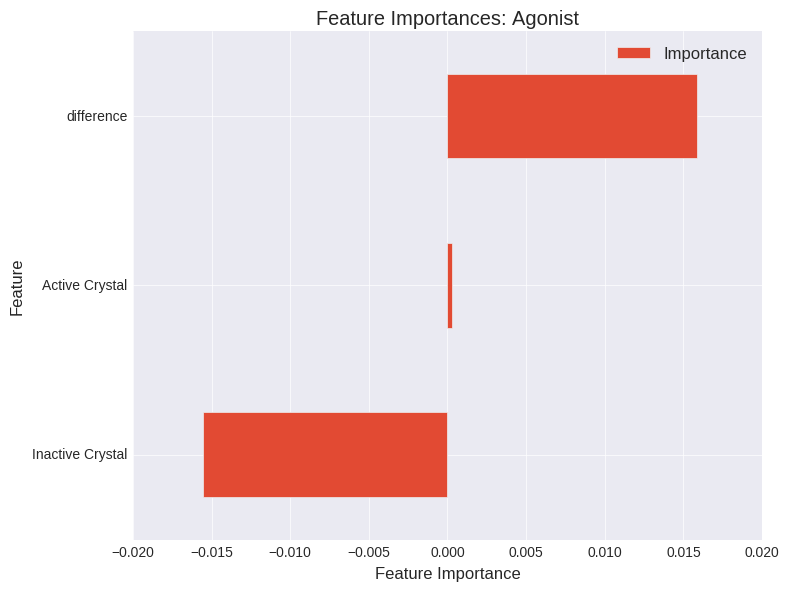

(1, 103)
(1, 103)


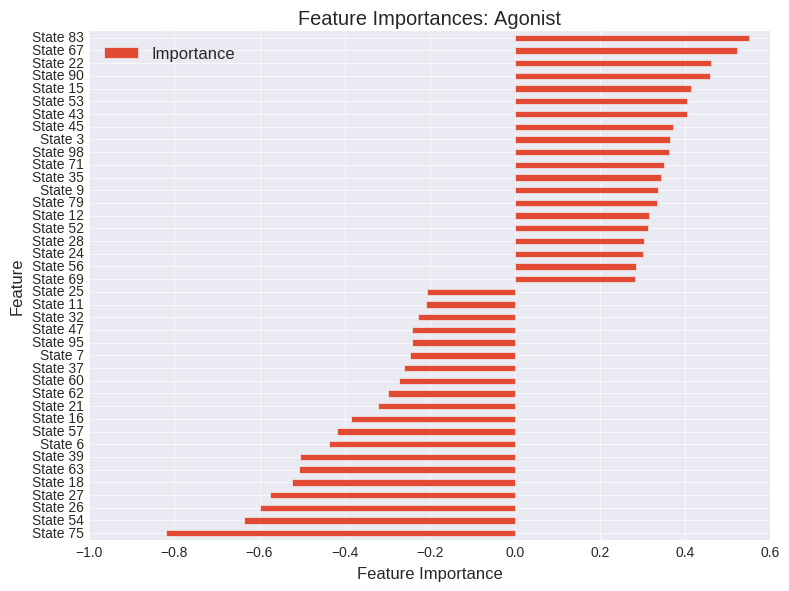

In [497]:
#Normalize False, axis0 True, LR
importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], ligand_df.index.values, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures      0.9375            0.0000   
MSM Docking             1.0000            0.0625   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.607219998375, 0.684842199144)  


ValueError: list.remove(x): x not in list

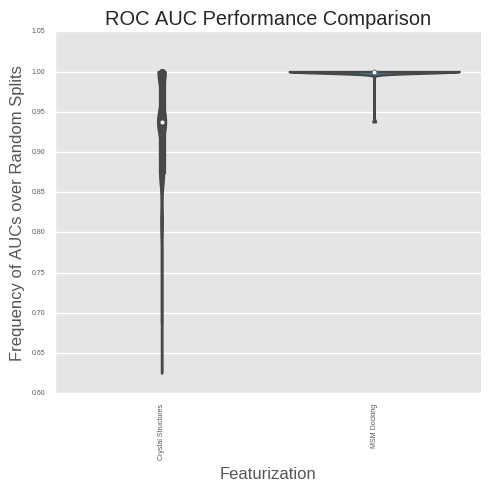

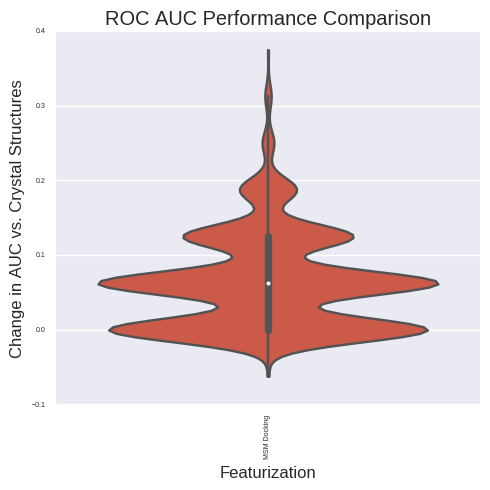

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.842105          0.000000   
MSM Docking           0.842105          0.008772   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.555524464318, 0.63521003202)  


ValueError: list.remove(x): x not in list

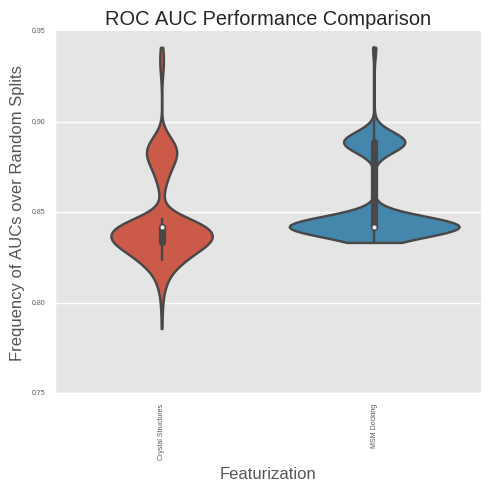

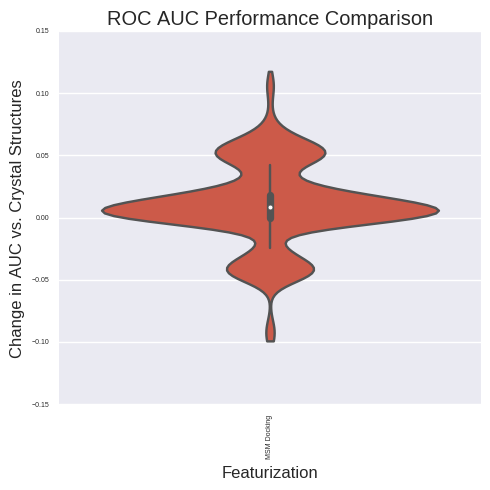

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.157895          0.000000   
MSM Docking           0.157895         -0.008772   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.140678949209, 0.201684401957)  


ValueError: list.remove(x): x not in list

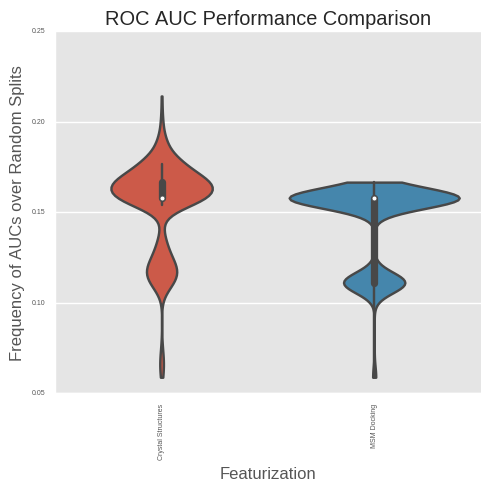

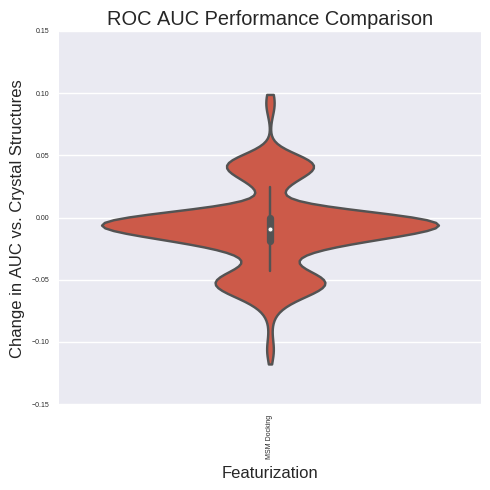

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.729167          0.000000   
MSM Docking           0.875000          0.145833   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.772872384493, 0.837080640256)  


ValueError: list.remove(x): x not in list

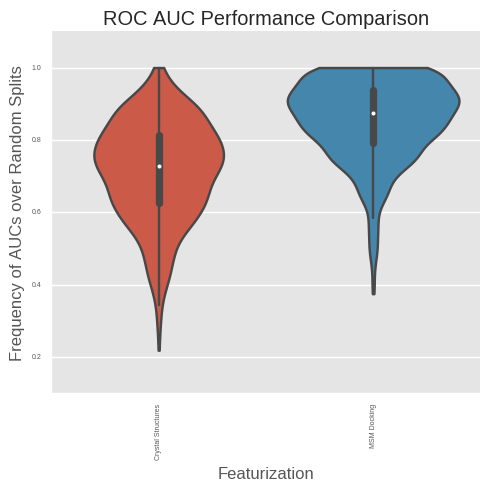

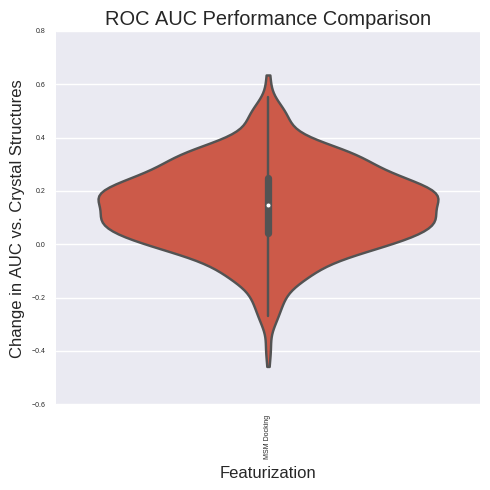

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.999941          0.000000   
MSM Docking           0.999994          0.000034   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.702772048123, 0.774064192723)  


ValueError: list.remove(x): x not in list

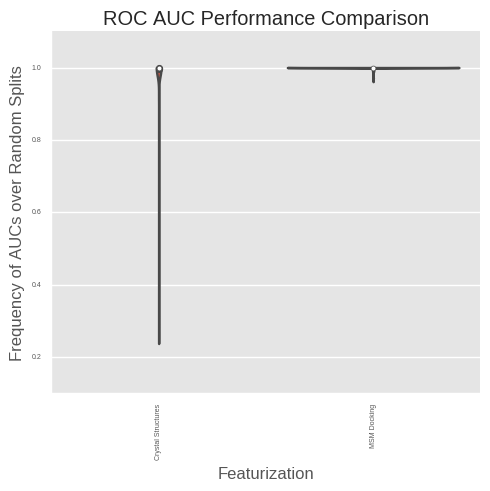

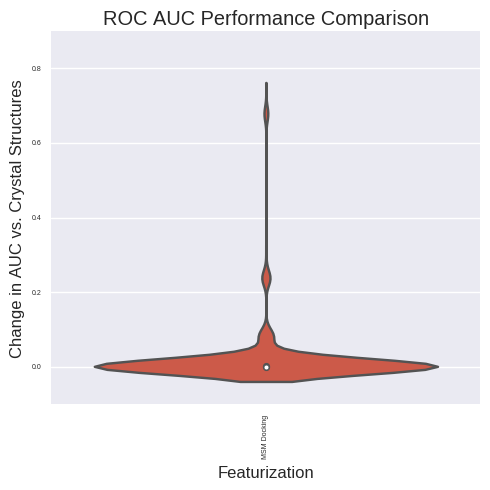

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.126617          0.000000   
MSM Docking           0.149100          0.016211   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.62353521404, 0.700316066202)  


ValueError: list.remove(x): x not in list

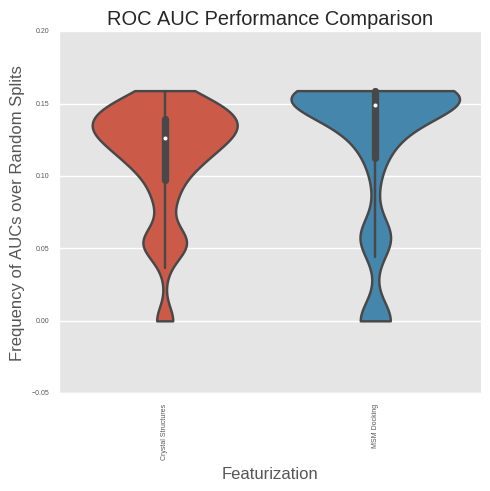

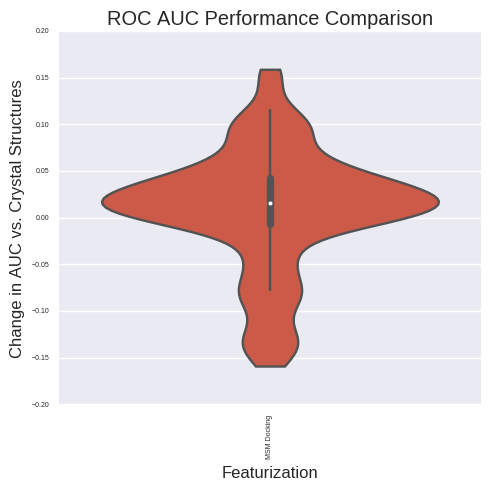

(3,)
(1, 3)


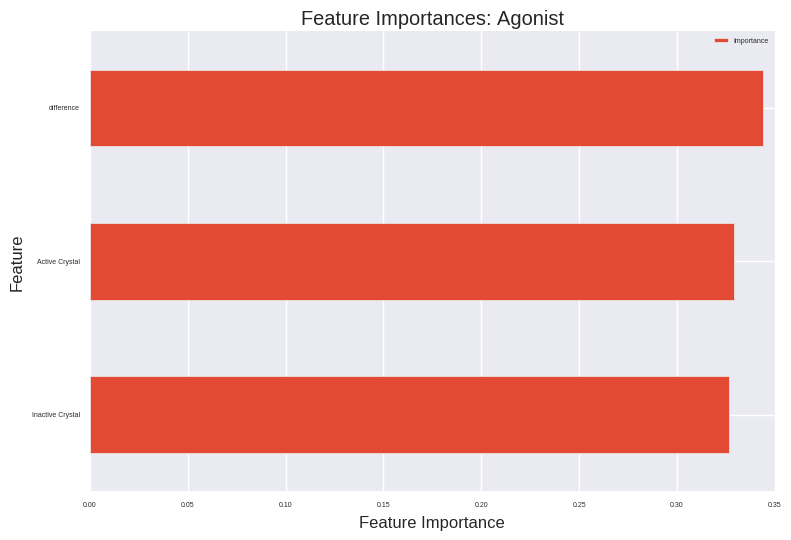

(205,)
(1, 205)


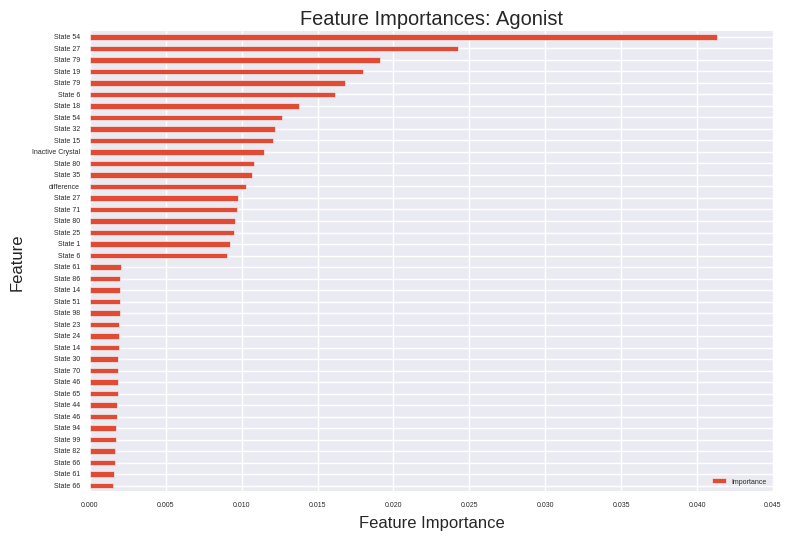

In [523]:
#Normalize False, axis0 True, RFR

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], ligand_df.name.values, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([new_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)

In [531]:
plot_clustermap(X_df.loc[model_agonists], 
                save_file="%s/ligands_vs_msm_states_ddg.eps" %(analysis_dir), 
                method='average', z_score=1, ytick_labelsize=0, xtick_labelsize=0)

analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.926412          0.000000   
MSM Docking           0.987059          0.060647   

                                  Sign Test 99% CI  
Crystal Structures                        (0, 0.0)  
MSM Docking         (0.61537160555, 0.69258513333)  


ValueError: list.remove(x): x not in list

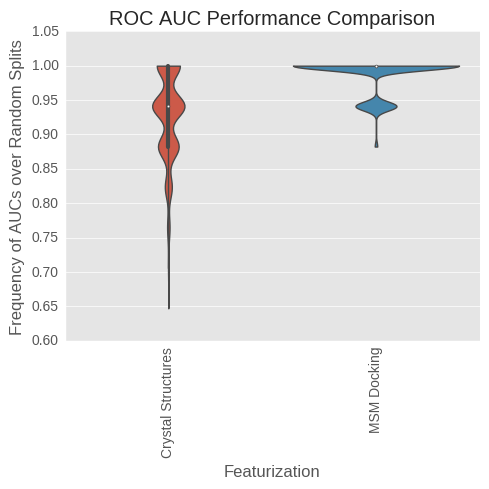

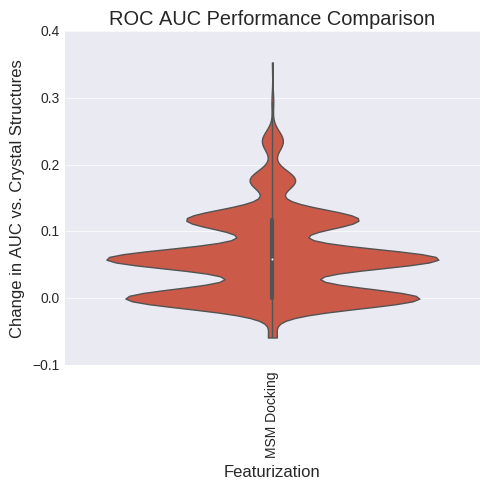

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.864056            0.0000   
MSM Docking           0.877456            0.0134   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.580807976587, 0.659596961506)  


ValueError: list.remove(x): x not in list

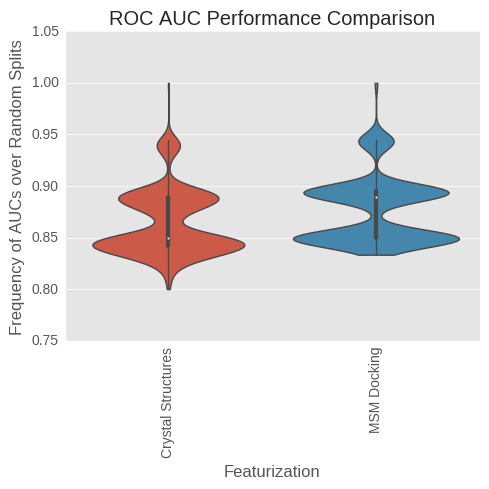

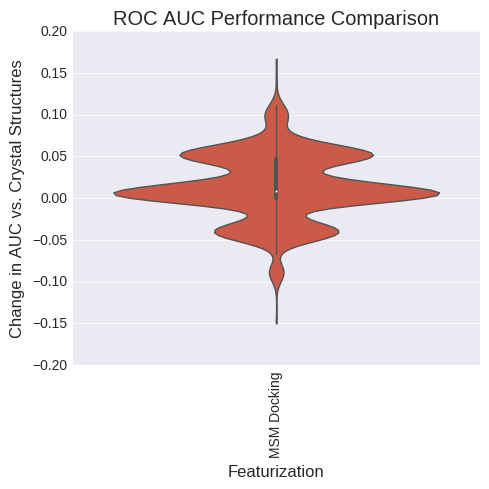

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.135944            0.0000   
MSM Docking           0.122544           -0.0134   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.174111852368, 0.239776934925)  


ValueError: list.remove(x): x not in list

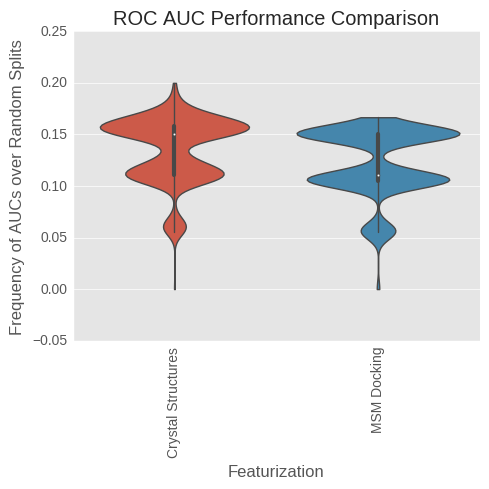

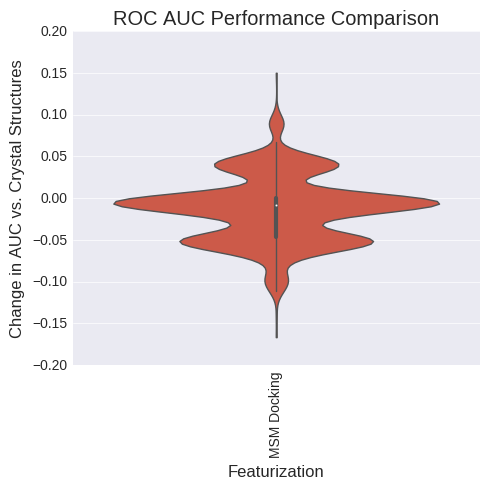

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.719078          0.000000   
MSM Docking           0.852010          0.132931   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.752864761823, 0.819338727193)  


ValueError: list.remove(x): x not in list

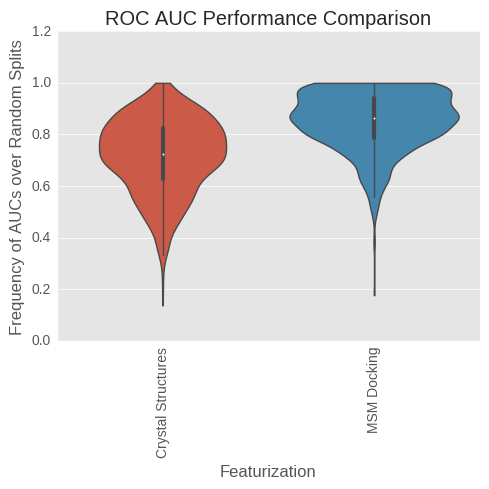

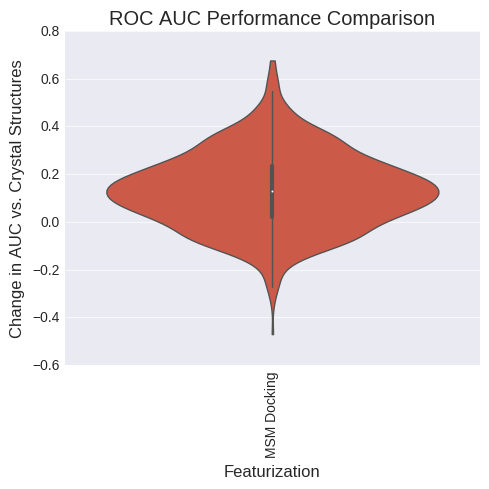

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.983244          0.000000   
MSM Docking           0.999602          0.016357   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.709001330541, 0.779755816326)  


ValueError: list.remove(x): x not in list

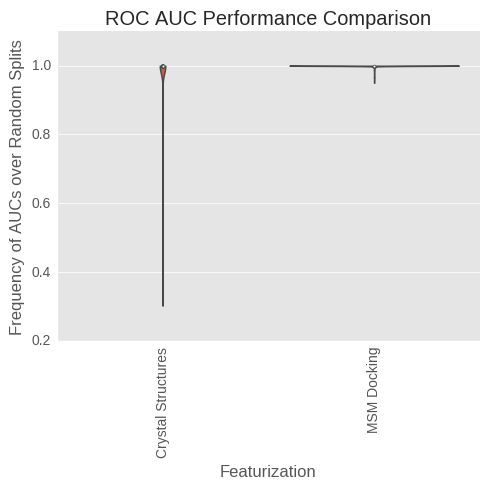

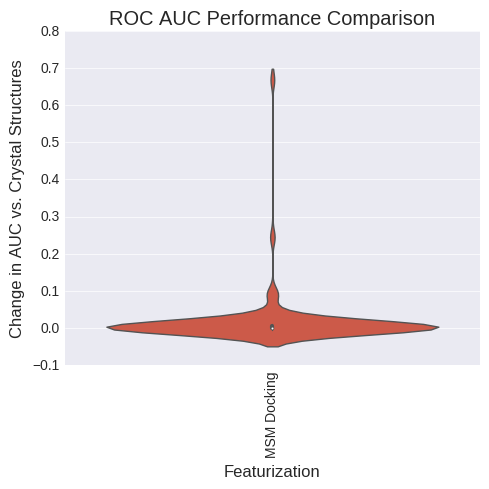

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.114552          0.000000   
MSM Docking           0.118961          0.004409   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.591967436599, 0.670292495867)  


ValueError: list.remove(x): x not in list

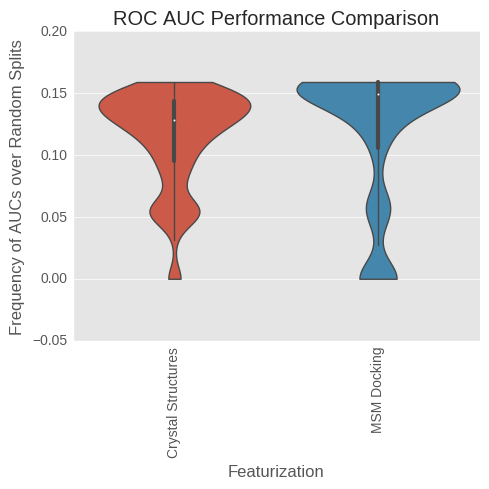

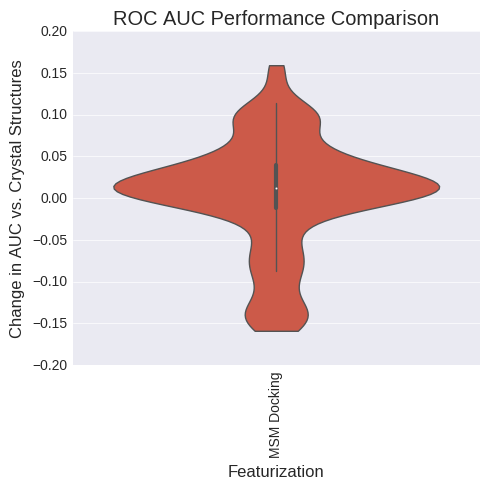

(3,)
(1, 3)


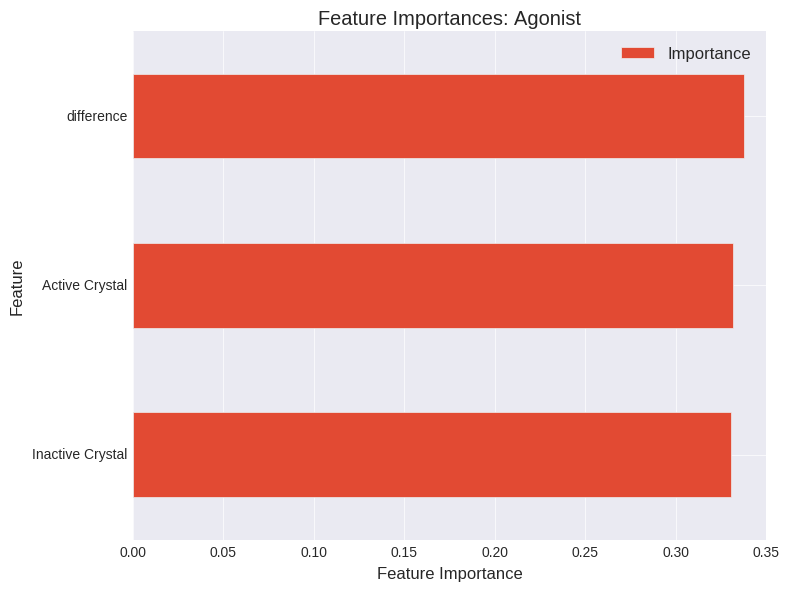

(409,)
(1, 409)


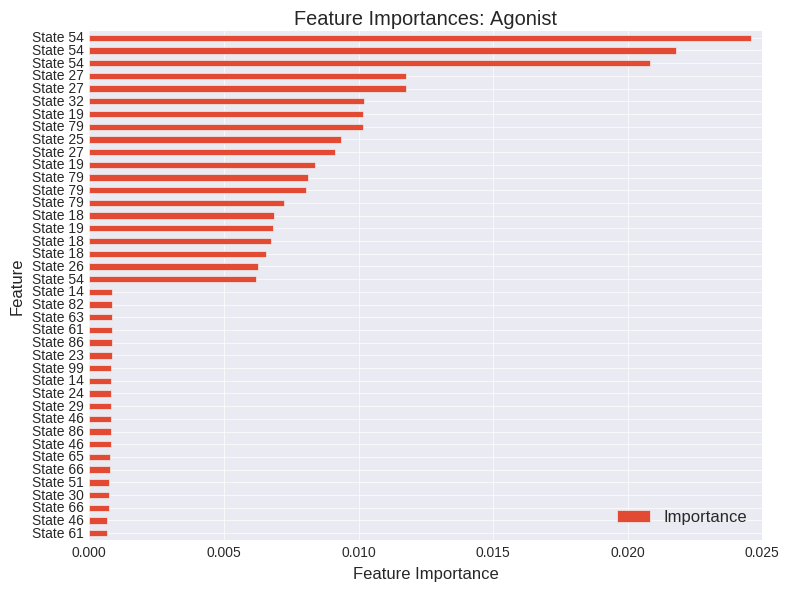

In [338]:
#Normalize True, axis0 True

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], ligand_df.name.values[indices], analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)



analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.909478             0.000   
MSM Docking           0.965478             0.056   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.668659583788, 0.742611673941)  


ValueError: list.remove(x): x not in list

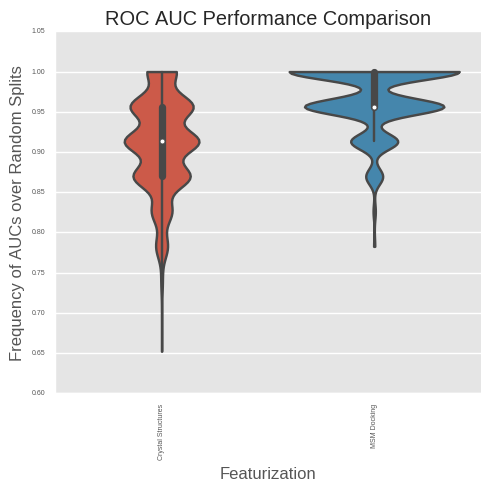

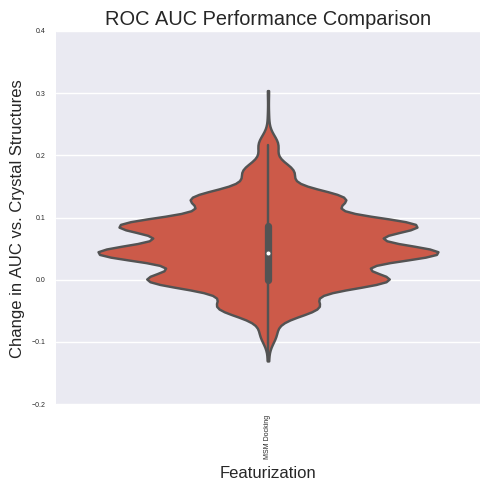

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.844974          0.000000   
MSM Docking           0.855688          0.010713   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.557543176512, 0.637164955167)  


ValueError: list.remove(x): x not in list

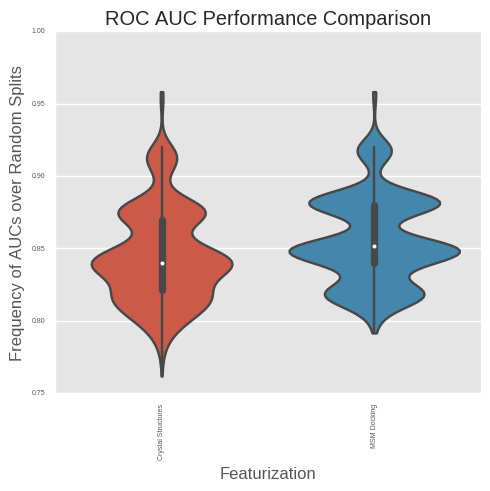

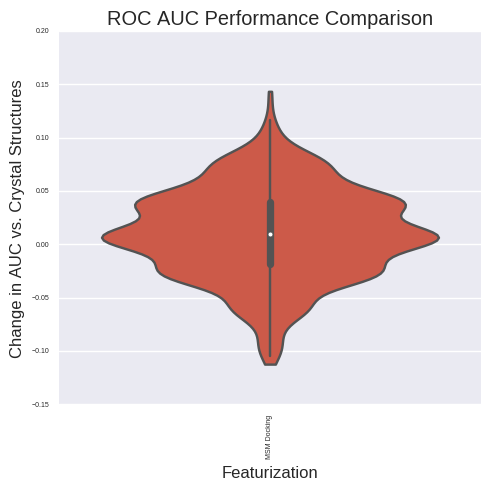

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.155026          0.000000   
MSM Docking           0.144312         -0.010713   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.304514349825, 0.381568458284)  


ValueError: list.remove(x): x not in list

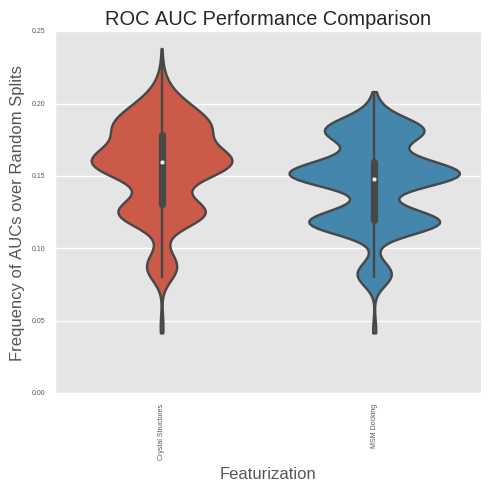

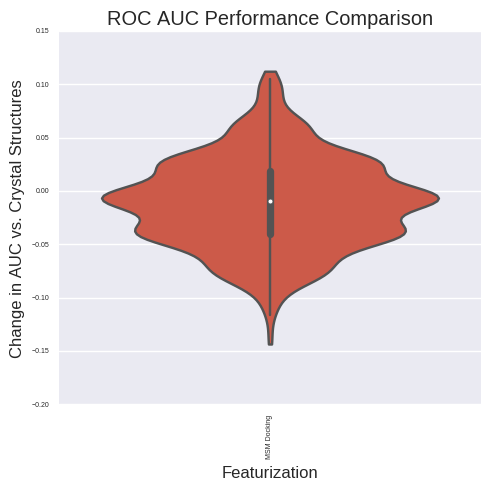

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.729096          0.000000   
MSM Docking           0.842670          0.113574   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.79512391289, 0.856552282933)  


ValueError: list.remove(x): x not in list

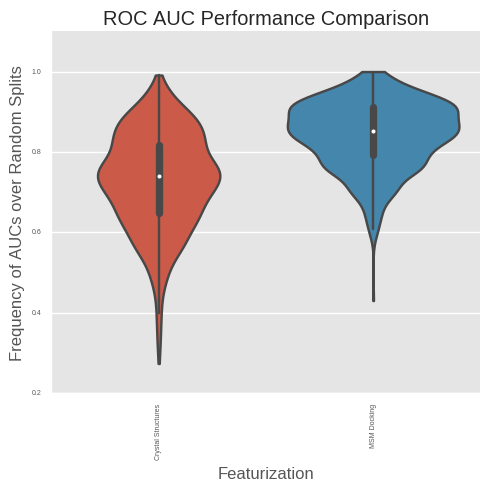

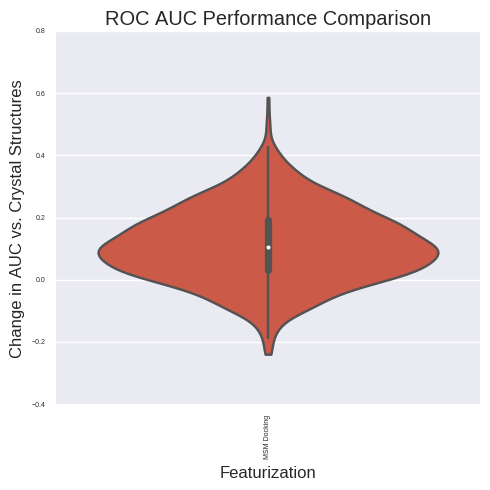

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.941663          0.000000   
MSM Docking           0.998715          0.057052   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.743425178453, 0.810896951531)  


ValueError: list.remove(x): x not in list

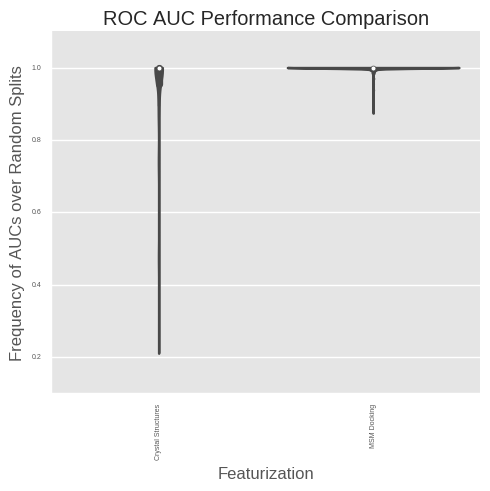

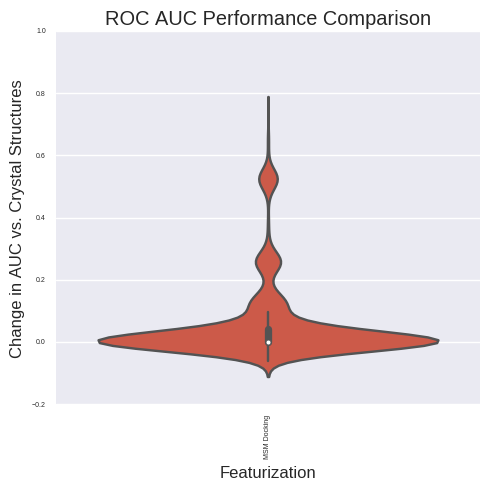

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.168350          0.000000   
MSM Docking           0.183495          0.015145   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.650152407273, 0.725356132393)  


ValueError: list.remove(x): x not in list

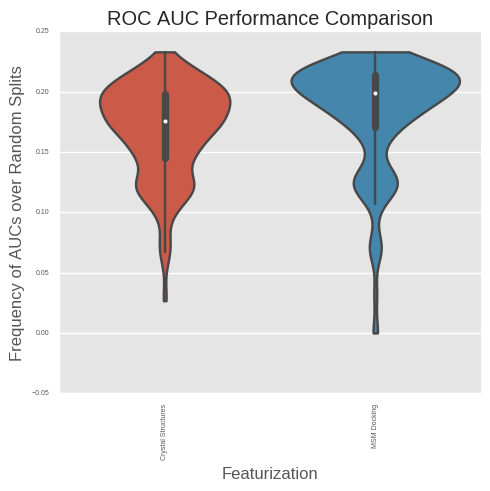

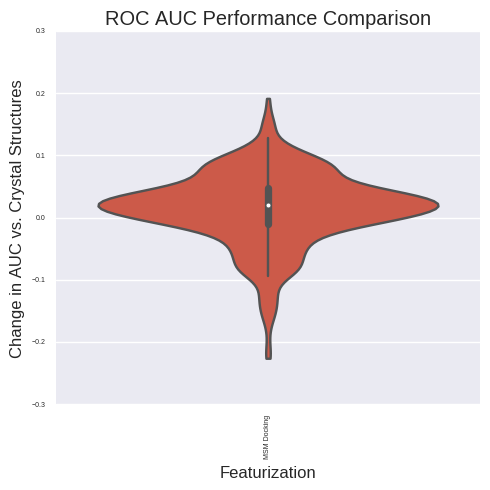

(3,)
(1, 3)


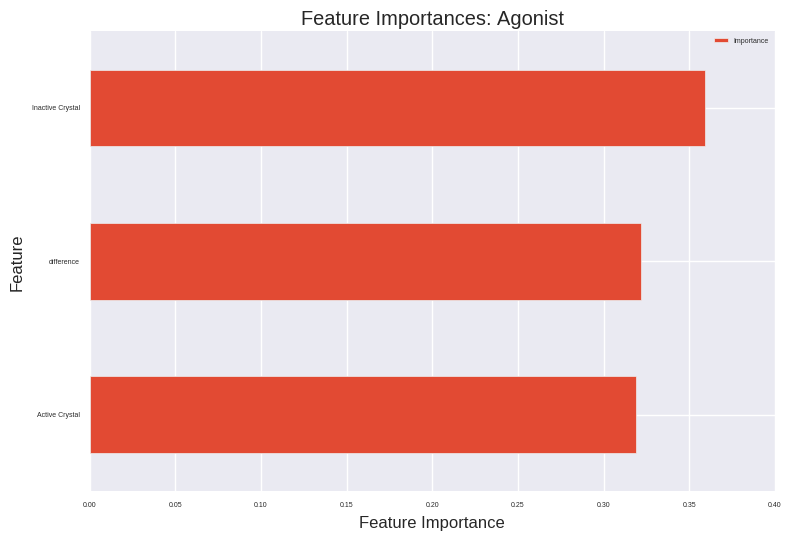

(103,)
(1, 103)


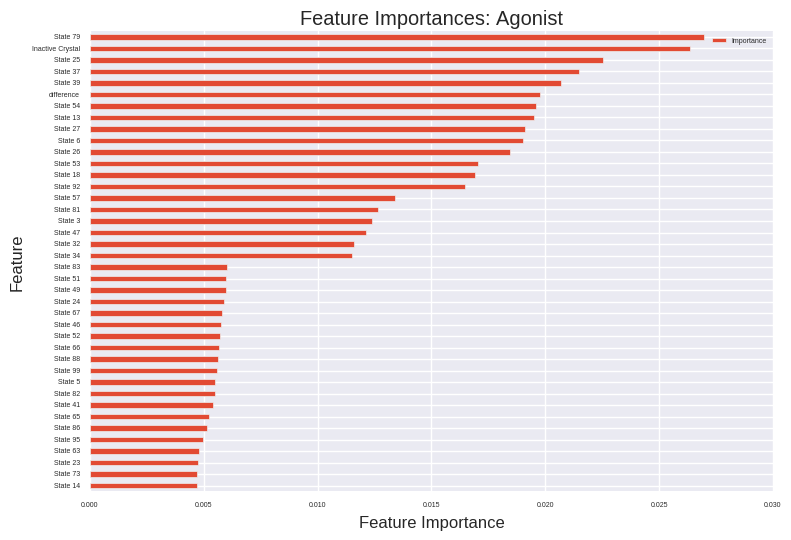

In [282]:
#Normalize True, axis0 False

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], ligand_df.name.values[indices], analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([X_df.iloc[indices].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False)








analyzing Recall:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.933333          0.000000   
MSM Docking           1.000000          0.066667   

                                   Sign Test 99% CI  
Crystal Structures                         (0, 0.0)  
MSM Docking         (0.49427523229, 0.575263386167)  


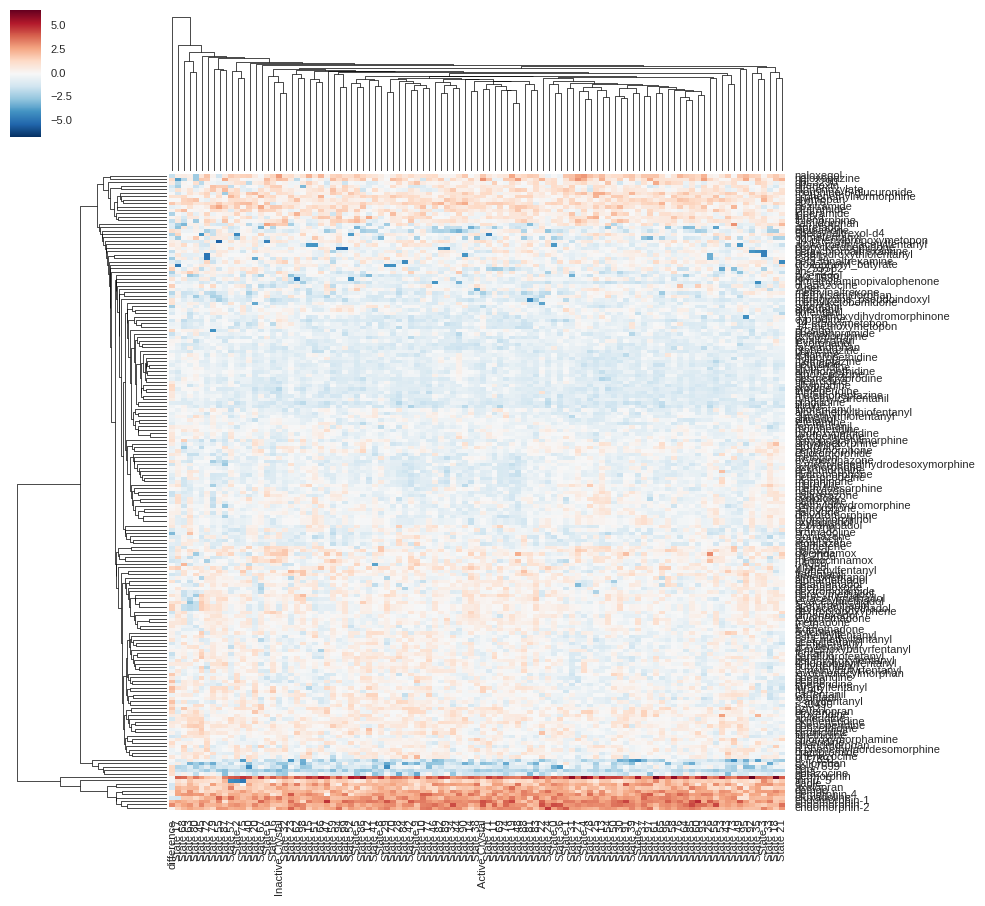

ValueError: list.remove(x): x not in list

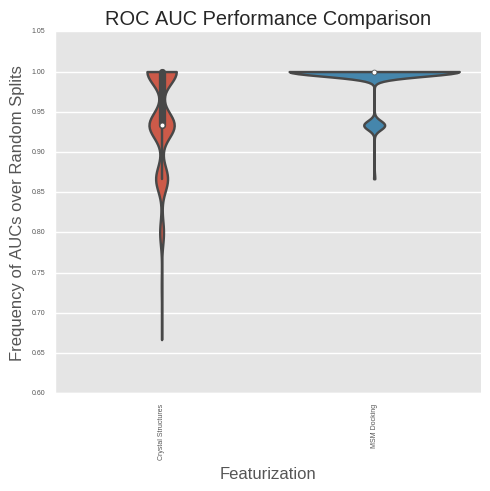

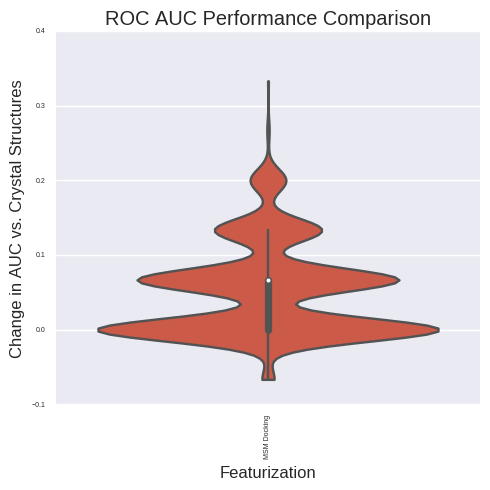

analyzing TPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.833333               0.0   
MSM Docking           0.833333               0.0   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.404029824485, 0.484708385984)  


ValueError: list.remove(x): x not in list

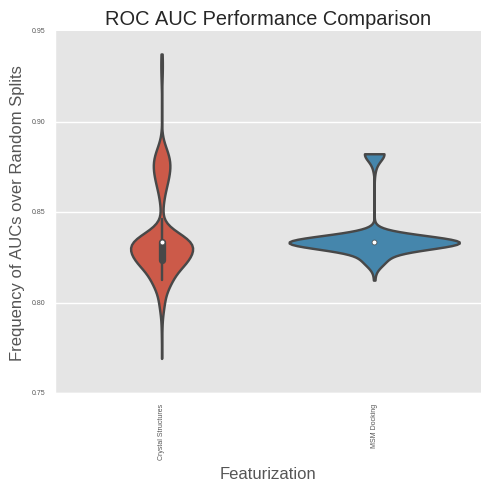

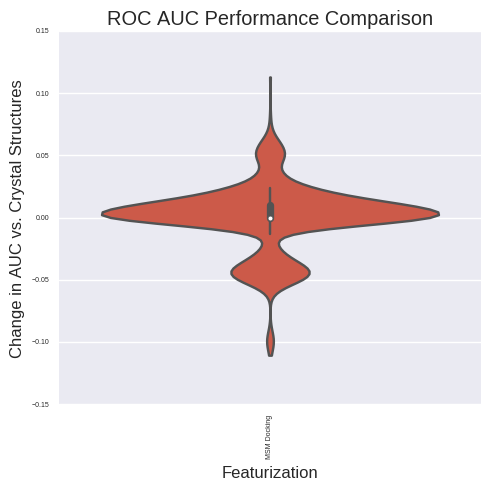

analyzing FPR:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.166667               0.0   
MSM Docking           0.166667               0.0   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.164781600108, 0.229239010484)  


ValueError: list.remove(x): x not in list

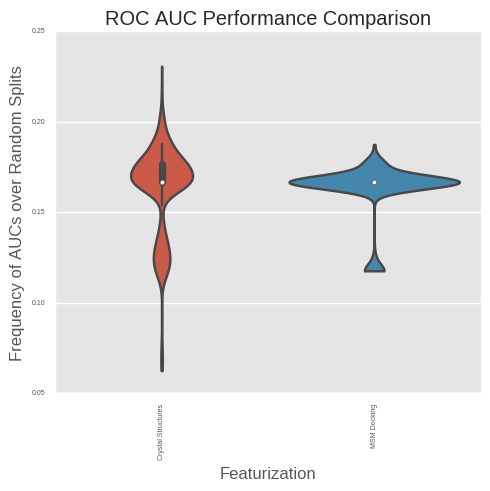

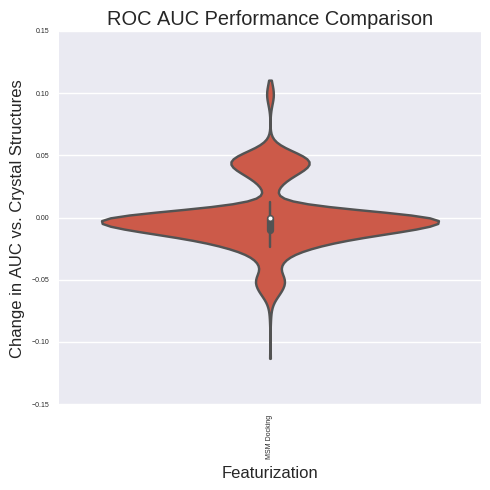

analyzing ROC AUC:
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.688889          0.000000   
MSM Docking           0.866667          0.155556   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.811117307051, 0.870361153825)  


ValueError: list.remove(x): x not in list

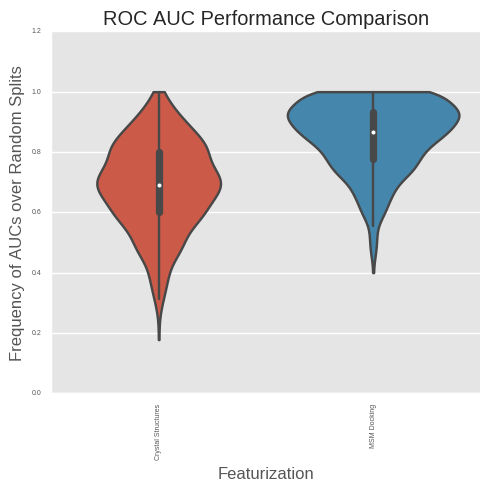

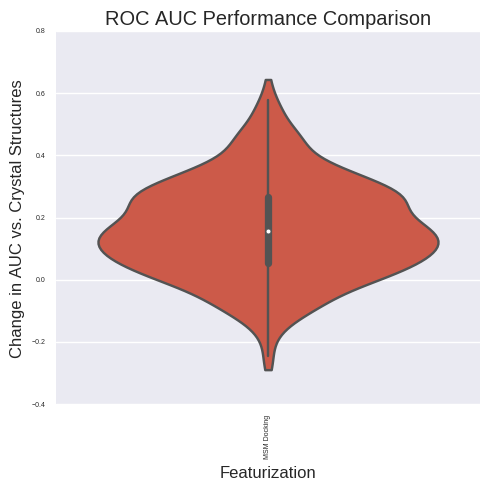

analyzing BedROC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.999708          0.000000   
MSM Docking           0.999997          0.000096   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.751814763352, 0.818401907993)  


ValueError: list.remove(x): x not in list

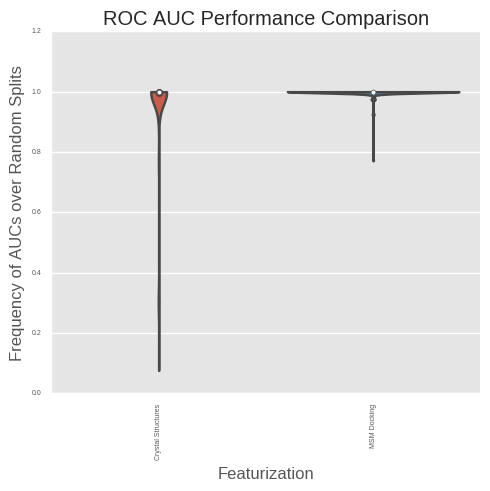

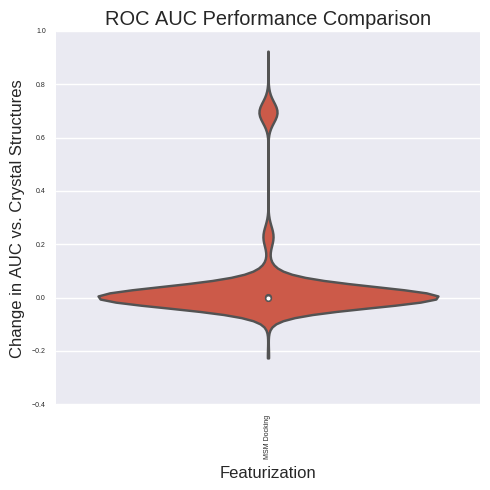

analyzing LogAUC
(1000, 2)
                    Median AUC  Median delta AUC  \
Crystal Structures    0.121680          0.000000   
MSM Docking           0.145661          0.014516   

                                    Sign Test 99% CI  
Crystal Structures                          (0, 0.0)  
MSM Docking         (0.605183949356, 0.682904612822)  


ValueError: list.remove(x): x not in list

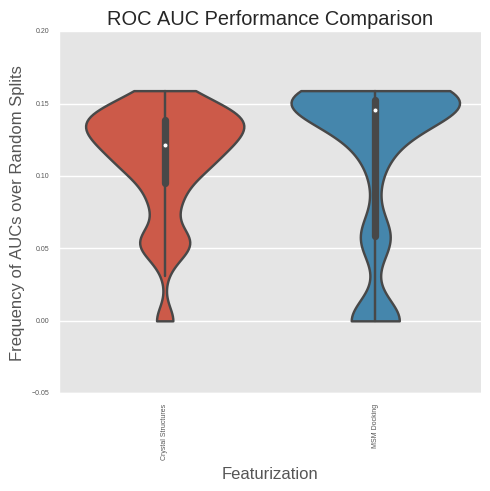

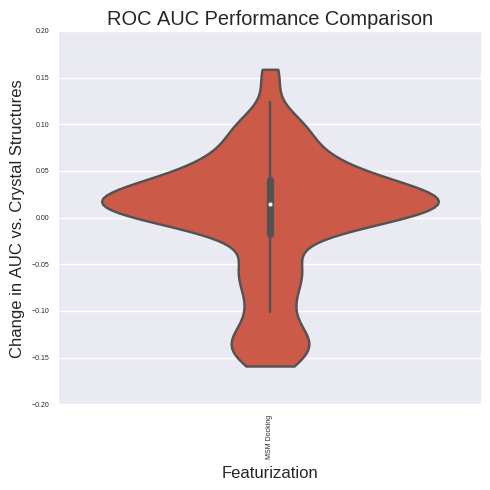

(3,)
(1, 3)


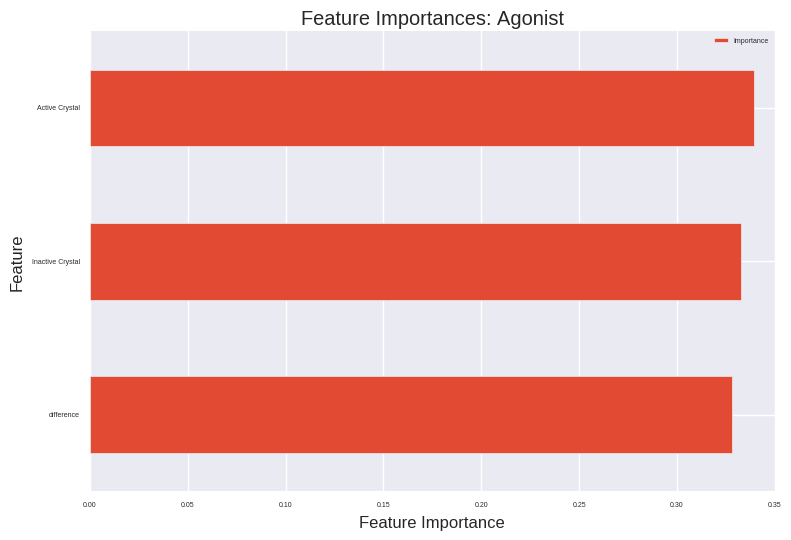

(103,)
(1, 103)


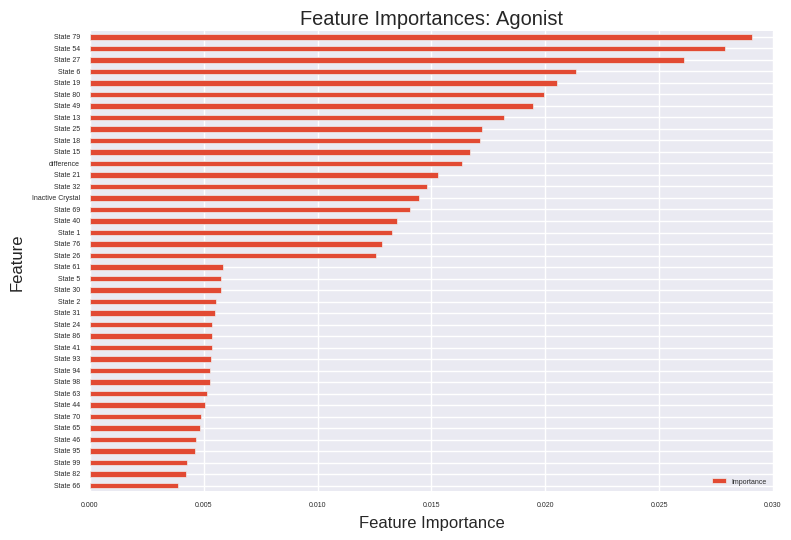

In [525]:
#Normalize False, axis0 False

importance_dfs = analyze_multiclass_experiment(results_dict[save_name], 
                                                                feature_names,
                                                                [f.columns.values.tolist() for f in features], ligand_df.name.values, analysis_dir,
                                                                ["Antagonist", "Agonist"], 
                                                                #["Gs Inactive", "Gs Active"], 
                                                               #["Arr Inactive", "Arr Active"],
                                               np.hstack([new_df.loc[model_agonists].values]),
                                                               #["Gs Inactive", "Gs Partial Active", "Gs Full Active"], 
                                              remake=False, fxn=np.median)


In [515]:
analysis_dir

'/home/enf/md_simulations/MOR/h8_reimaged/sparse-tICA_t50_n_components10all_residues_4dkl_5c1m_under_cutoff6A-CA-py3-far_regularization_wolf_autoShrinkage0pt01-backup/analysis_n_clusters100_random'

In [516]:
save_name

'agonist_rfr_trials1000_split0.9_normalizeFalse_normalize-axis0False_n-estimators1000_precisionXP'

In [130]:
model = results_dict[save_name]['MSM Docking'][0]
y_proba =model.predict_proba(X_df.values)
test_df = pd.DataFrame(y_proba, index=X_df.index, columns=["class A", "class B"]).sort("class B", ascending=False, inplace=False)

In [ ]:
from efficacy_scripts import *
smiles_list, compound_names, pc_smiles, pc_names = convert_sdfs_to_compounds(["/home/enf/htbc/sdfs/%s.sdf" %f for f in test_df.index.values], parallel=True, worker_pool=dview)
smiles_list = [s.strip() for s in smiles_list]
pc_smiles = [s.strip() for s in pc_smiles]
compound_names_df = pd.DataFrame(list(zip(smiles_list, compound_names, pc_smiles, pc_names)), index=test_df.index, columns=["smiles", "pubchem_name", "pubchem_smiles", "alternate_name"])
#for lig in p_bias_df.loc[[n for n in p_bias_df.index.values.tolist() if "_" == n[0]]].index.values[:100]:
#    for mol in pb.readfile("sdf", "/home/enf/htbc/sdfs/%s.sdf" %lig):
#        a = str(mol)
#        break
#    c = get_compounds(a, namespace='smiles')
    #print(c[0].synonyms)

Getting SMILES from SDFs...
Done. Now getting compound names from SMILES...
Done. returning compound names.


In [135]:
test_df[["pubchem_name", "smiles", "alternate_smiles", "alternate_name"]] = compound_names_df.loc[test_df.index][["pubchem_name", "smiles", "pubchem_smiles", "alternate_name"]]
bret_pred_df = test_df.loc[[n for n in test_df.index.values if n in common_ligands]]
bret_pred_df["label"] = 0.
bret_pred_df["label"].loc[common_ligands] = y
from rdkit.ML.Scoring.Scoring import CalcAUC
CalcAUC(bret_pred_df.values[:,(0,1)], col=0)#, alpha=10)

0.0

In [139]:
test_df.loc[[n for n in test_df.index.values if "_" != n[0] and n not in common_ligands]].sort("class B", ascending=False,inplace=False).iloc[:100]

,class A,class B,pubchem_name,smiles,alternate_smiles,alternate_name
properidine,0.006,0.994,,,,
dimethylthiambutene,0.006,0.994,,,,
sid_103650117,0.007,0.993,,,,
norketamine,0.007,0.993,,,,
sid_103563911,0.014,0.986,,,,
sid_312354119,0.014,0.986,,,,
sid_174506737,0.014,0.986,,,,
sid_174499562,0.014,0.986,,,,
4-22,0.016,0.984,,,,
4-40,0.016,0.984,,,,


Fitting models over all data...
Fitting models over split train data...
0
1
2
3
4
5
6
7
8
9
                    Median AUC  Median delta AUC       Sign Test 99% CI
Crystal Structures    0.500000          0.000000               (0, 0.0)
MSM Docking           0.725589          0.225589  (0.601145906695, 1.0)


ValueError: list.remove(x): x not in list

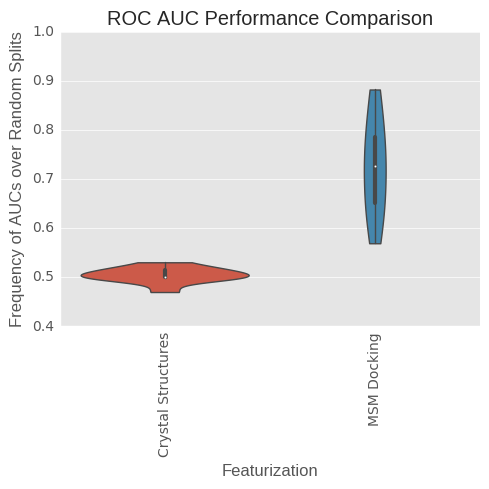

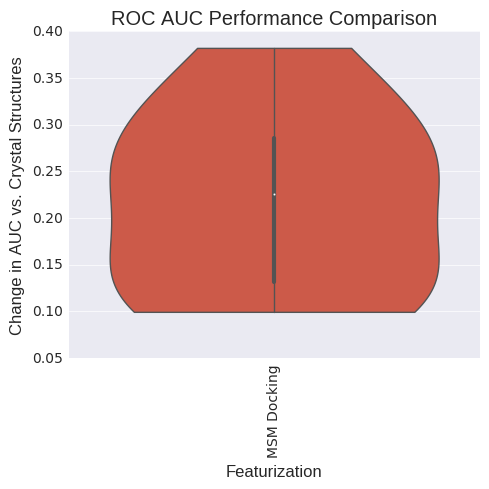

(1, 3)
(1, 3)


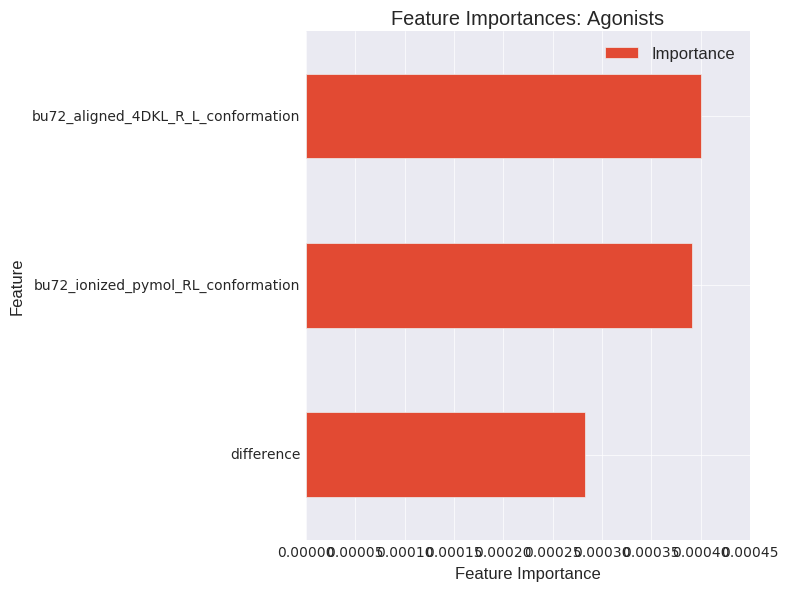

(1, 101)
(1, 101)


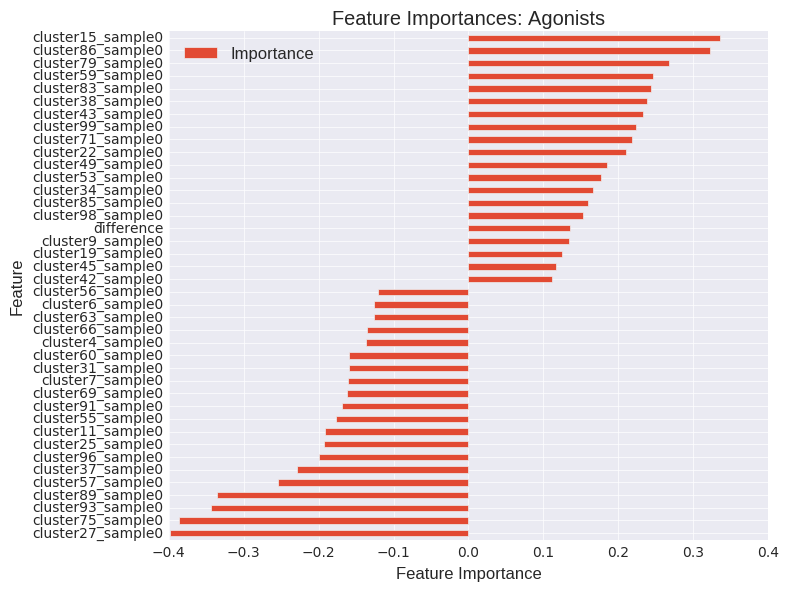

In [408]:
n_trials = 1000
train_test_split_prop = 0.8

ligand_df = copy.deepcopy(ori_ligand_df)
classes = ligand_df["action"].values.tolist()
class_labels = []
indices = []
for i, label in enumerate(classes):
        if "antagonist" in label.lower():# or "neutral" in label.lower() or "negative" in label.lower():
                class_labels.append(0.)
                indices.append(i)
        elif "agonist" in label.lower():# or "positive" in label.lower():
                class_labels.append(1.)
                indices.append(i)
ligand_df = ligand_df.iloc[indices]
ligand_df["label"] = class_labels
y = ligand_df["label"].values.reshape((-1,1))

model_type = "rfr"

save_name = "two_class_wiki_%s_trials%d_split%s.pkl" %(model_type, n_trials, str(train_test_split_prop))
results_dict[save_name] = generate_or_load_model(features, y, feature_names, n_trials, train_test_split_prop, False, model_type, "%s/%s.pkl" %(analysis_dir, save_name),redo=False)

analyze_multiclass_experiment(results_dict[save_name], 
                                                            ["Crystal Structures", "MSM Docking"],
                                                            [[n for n in docking_df.columns if "cluster" not in n], X_df.columns], common_ligands, analysis_dir,
                                                            ["Antagonists", "Agonists"], X, 
                                                            exp_title="Antagonist vs. Agonist, %s" %model_type, coef_name="Logistic Coefficient")


In [398]:
cluster15_sample0                     8.24
cluster78_sample0                     7.47
cluster99_sample0                     7.36
cluster17_sample0                     7.31
cluster33_sample0                     7.04
cluster3_sample0                      6.96
cluster25_sample0                     6.88
cluster31_sample0                     6.77
cluster16_sample0                     6.68
cluster50_sample0                     6.66

cluster90_sample0                     6.57
cluster12_sample0                     6.97
cluster79_sample0                     6.99
cluster48_sample0                     7.01
cluster41_sample0                     7.10
cluster75_sample0                     7.11
cluster87_sample0                     7.19
cluster59_sample0                     7.24
cluster49_sample0                     7.30
cluster16_sample0                     7.57

full_docking_df.iloc[:10]

,bu72_aligned_4DKL_R_L_conformation,bu72_ionized_pymol_RL_conformation,cluster0_sample0,cluster10_sample0,cluster11_sample0,cluster12_sample0,cluster13_sample0,cluster14_sample0,cluster15_sample0,cluster16_sample0,cluster17_sample0,cluster18_sample0,cluster19_sample0,cluster1_sample0,cluster20_sample0,cluster21_sample0,cluster22_sample0,cluster23_sample0,cluster24_sample0,cluster25_sample0,cluster26_sample0,cluster27_sample0,cluster28_sample0,cluster29_sample0,cluster2_sample0,cluster30_sample0,cluster31_sample0,cluster32_sample0,cluster33_sample0,cluster34_sample0,cluster35_sample0,cluster36_sample0,cluster37_sample0,cluster38_sample0,cluster39_sample0,cluster3_sample0,cluster40_sample0,cluster41_sample0,cluster42_sample0,cluster43_sample0,cluster44_sample0,cluster45_sample0,cluster46_sample0,cluster47_sample0,cluster48_sample0,cluster49_sample0,cluster4_sample0,cluster50_sample0,cluster51_sample0,cluster52_sample0,cluster53_sample0,cluster54_sample0,cluster55_sample0,cluster56_sample0,cluster57_sample0,cluster58_sample0,cluster59_sample0,cluster5_sample0,cluster60_sample0,cluster61_sample0,cluster62_sample0,cluster63_sample0,cluster64_sample0,cluster65_sample0,cluster66_sample0,cluster67_sample0,cluster68_sample0,cluster69_sample0,cluster6_sample0,cluster70_sample0,cluster71_sample0,cluster72_sample0,cluster73_sample0,cluster74_sample0,cluster75_sample0,cluster76_sample0,cluster77_sample0,cluster78_sample0,cluster79_sample0,cluster7_sample0,cluster80_sample0,cluster81_sample0,cluster82_sample0,cluster83_sample0,cluster84_sample0,cluster85_sample0,cluster86_sample0,cluster87_sample0,cluster88_sample0,cluster89_sample0,cluster8_sample0,cluster90_sample0,cluster91_sample0,cluster92_sample0,cluster93_sample0,cluster94_sample0,cluster95_sample0,cluster96_sample0,cluster97_sample0,cluster98_sample0,cluster99_sample0,cluster9_sample0
ADL5747,7.22,5.56,6.02,6.33,3.99,6.24,5.60,6.41,5.79,7.22,5.84,6.37,7.88,5.26,4.25,5.60,6.32,6.57,7.03,5.90,5.21,5.31,7.44,6.46,5.23,6.37,5.42,6.50,6.55,8.26,5.25,5.54,4.37,5.11,5.29,4.90,5.22,7.50,5.41,5.09,5.74,5.98,6.27,7.15,6.95,6.98,5.63,5.68,6.79,4.96,5.76,6.13,4.19,7.23,4.39,5.15,5.23,6.80,6.39,5.04,6.14,3.51,5.29,5.38,6.07,6.31,8.02,6.83,5.51,5.77,5.00,5.21,5.46,6.13,7.49,5.05,5.83,4.81,6.21,6.68,6.22,6.92,6.59,6.15,4.94,6.15,5.40,5.59,5.89,6.49,5.15,8.04,6.80,6.71,6.35,5.57,7.12,4.25,5.48,5.65,6.23,6.11
ADL5859,6.25,6.25,5.81,5.73,4.96,5.62,4.82,6.27,6.02,7.80,5.46,4.23,7.07,5.48,3.58,5.33,6.77,4.68,7.39,6.04,4.77,4.78,4.54,5.40,5.09,5.22,4.89,5.85,5.10,7.10,4.60,5.20,4.33,4.80,5.01,5.32,5.31,7.50,4.23,4.74,4.13,4.95,6.15,6.86,5.84,4.69,5.52,6.24,6.06,4.74,5.92,6.90,5.31,6.70,3.67,4.10,5.62,6.05,6.76,5.55,4.89,3.86,6.05,4.97,3.91,5.85,7.02,5.24,4.35,6.69,5.08,4.71,5.36,5.79,8.00,4.57,5.15,5.84,4.43,5.66,4.54,6.27,6.31,6.64,5.20,6.44,4.75,5.45,5.93,5.31,4.81,7.52,5.32,6.11,5.76,4.81,4.74,4.54,4.75,4.29,6.22,6.10
Acetorphine,0.00,0.00,4.51,6.21,4.19,3.40,3.95,0.00,3.64,4.18,6.65,4.59,7.09,4.21,3.88,4.81,3.12,7.13,5.01,5.33,4.34,4.70,4.59,6.37,4.72,5.77,4.90,5.48,4.98,4.03,5.62,4.36,2.86,6.55,3.91,5.08,4.01,3.39,4.71,3.82,4.24,2.89,3.92,4.15,6.57,5.34,5.54,7.31,3.82,4.58,4.36,4.15,4.65,4.99,3.67,3.75,5.19,5.99,5.37,3.71,6.25,4.80,4.59,4.18,3.88,3.77,4.24,3.73,5.42,2.73,3.00,4.60,4.55,4.41,4.04,7.39,3.94,4.75,5.22,4.48,3.25,4.04,4.66,6.18,3.64,5.04,5.64,4.43,5.61,6.34,4.39,6.14,4.94,5.80,5.12,4.37,5.74,3.50,5.64,5.28,6.15,5.51
Acetyldihydrocodeine,0.00,0.00,4.90,5.62,3.22,4.39,3.37,5.06,4.93,6.44,5.62,-0.00,5.71,3.66,3.22,3.45,5.37,4.21,4.12,6.14,3.16,4.89,4.69,4.30,5.05,3.67,3.76,5.56,3.98,3.73,4.50,4.45,2.87,5.65,4.46,4.58,4.62,3.62,4.26,4.51,3.47,3.16,3.97,5.29,5.40,3.93,4.24,5.12,3.73,3.95,4.54,4.42,6.14,4.21,3.12,4.06,5.02,4.67,4.57,4.07,5.54,3.43,4.46,3.99,4.28,3.57,3.13,3.67,4.97,3.74,4.79,5.49,5.00,4.82,4.97,4.26,3.86,3.86,5.23,4.09,4.74,4.58,3.78,5.46,4.38,4.76,5.77,5.65,4.93,4.47,4.71,3.29,4.80,4.44,4.18,4.80,5.80,3.68,4.39,3.91,5.67,3.84
Acetylfentanyl,0.00,0.00,4.56,5.83,4.20,7.30,4.25

In [52]:
docking_df.loc["PZM21"].sort(inplace=False, ascending=False)


cluster68_sample0                     8.51
cluster55_sample0                     8.07
cluster15_sample0                     7.67
cluster53_sample0                     7.66
cluster11_sample0                     7.55
cluster42_sample0                     7.49
cluster75_sample0                     7.48
cluster67_sample0                     7.48
cluster50_sample0                     7.45
cluster2_sample0                      7.39
cluster49_sample0                     7.38
cluster77_sample0                     7.37
cluster9_sample0                      7.33
cluster47_sample0                     7.30
cluster84_sample0                     7.23
cluster90_sample0                     7.23
cluster19_sample0                     7.20
cluster43_sample0                     7.15
cluster39_sample0                     7.13
cluster34_sample0                     7.10
bu72_ionized_pymol_RL_conformation    7.09
cluster82_sample0                     7.06
cluster38_sample0                     7.01
cluster69_s

In [362]:
docking_df.index

Index(['ethylketocyclazocine', 'DADLE', 'DSLET',
       '__sup_3__sup_H_diprenorphine', '_Leu_enkephalin', '_Met_enkephalin',
       'dihydromorphine', 'diprenorphine', 'etonitazene', 'etorphine',
       'fentanyl', 'morphine', 'nalmefene', 'nalorphine', 'normorphine',
       'quadazocine', 'BNTX', 'CTAP', 'naloxone', 'naltrexone', 'naltriben',
       'naltrindole', 'DAMGO', 'nalbuphine', 'buprenorphine', 'PL017',
       'codeine', 'CTOP', '__sup_3__sup_H_naloxone', 'naloxonazine',
       'sufentanil', 'methadone', 'hydrocodone', 'hydromorphone',
       'levallorphan', 'loperamide', 'pethidine', 'alvimopan', 'tapentadol',
       'methylnaltrexone', 'butorphanol', 'levorphanol', 'eluxadoline',
       'tramadol', 'cebranopadol', 'SR16835', 'SCH221510', 'BW373U86',
       'ADL5747', 'ADL5859', 'HS665', 'zyklophin', 'LY2456302'],
      dtype='object')

In [87]:
results_dict

NameError: name 'results_dict' is not defined

In [380]:
ligand_df.loc[ligand_df["Activity"].str.contains("Inactive")]


,AID,Panel ID,SID,CID,Activity,AC Value (micromolar),AC Name,BioAssay Name,GI,Target Name,Outcome Method,PubMed ID,GeneID,Target Count (active),Target Count (tested),ligand,index
0,588407,0,845205,647547.0,Inactive,19.958,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,4.0,467.0,SID_845205,SID_845205
1,588407,0,848082,650506.0,Inactive,12.436,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,3.0,507.0,SID_848082,SID_848082
2,588407,0,849197,6602574.0,Inactive,11.516,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,4.0,511.0,SID_849197,SID_849197
3,588407,0,851044,653596.0,Inactive,12.871,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,8.0,512.0,SID_851044,SID_851044
4,588407,0,862666,663898.0,Inactive,10.364,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,13.0,511.0,SID_862666,SID_862666
5,588407,0,3711252,2997570.0,Inactive,42.542,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,6.0,518.0,SID_3711252,SID_3711252
6,588407,0,3712895,5742486.0,Inactive,92.480,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,14.0,507.0,SID_3712895,SID_3712895
7,588407,0,3717936,3000200.0,Inactive,17.301,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,5.0,513.0,SID_3717936,SID_3717936
9,588407,0,4248730,3242770.0,Inactive,13.551,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,7.0,501.0,SID_4248730,SID_4248730
12,588407,0,14721854,1454688.0,Inactive,14.977,EC50,Luminescence-based cell-based high throughput dose response assay for agonists of heterodimerization of the mu 1 (OPRM1) and delta 1 (OPRD1) opioid receptors,117940060,NaN,Confirmatory,NaN,4988,13.0,471.0,SID_14721854,SID_14721854


In [41]:
ligand_df.loc[(~ligand_df["BioAssay Name"].str.contains("arrestin")) & (~ligand_df["BioAssay Name"].str.contains("hetero"))].sort("AC Value (micromolar)", ascending=True, inplace=False)# [n for n in ligand_df["BioAssay Name"].values.tolist() if "dimer" not in n])

In [17]:
from pubchempy import get_compounds, Compound, Substance


In [18]:
Substance.from_sid(160674330).source_id

'CHEMBL2048416'

In [19]:
from chembl_webresource_client import CompoundResource
compounds = CompoundResource()
print(compounds.status())

# If you get 'False' instead, this could mean that your internet connection is broken, 
# your settings are pointing to the wrong server or the server itself is down. 

# get single compound by ChEMBL:
c = compounds.get('CHEMBL1')

# `c` is now a python dictionary:
print(c)

True
{'stdInChiKey': 'GHBOEFUAGSHXPO-XZOTUCIWSA-N', 'smiles': 'COc1ccc2[C@@H]3[C@H](COc2c1)C(C)(C)OC4=C3C(=O)C(=O)C5=C4OC(C)(C)[C@@H]6COc7cc(OC)ccc7[C@H]56', 'knownDrug': 'No', 'alogp': 3.63, 'molecularFormula': 'C32H32O8', 'numRo5Violations': 1, 'rotatableBonds': 2, 'chemblId': 'CHEMBL1', 'acdLogd': 7.67, 'passesRuleOfThree': 'No', 'molecularWeight': 544.59, 'acdLogp': 7.67}


In [20]:
c["smiles"]

'COc1ccc2[C@@H]3[C@H](COc2c1)C(C)(C)OC4=C3C(=O)C(=O)C5=C4OC(C)(C)[C@@H]6COc7cc(OC)ccc7[C@H]56'

In [21]:
binding_db = pd.read_table("/home/enf/md_simulations/MOR/docking/BindingDB_ChEMBL.tsv", error_bad_lines=False)

b'Skipping line 528: expected 49 fields, saw 61\nSkipping line 529: expected 49 fields, saw 61\nSkipping line 530: expected 49 fields, saw 61\nSkipping line 531: expected 49 fields, saw 61\nSkipping line 532: expected 49 fields, saw 61\nSkipping line 533: expected 49 fields, saw 61\nSkipping line 534: expected 49 fields, saw 61\nSkipping line 535: expected 49 fields, saw 61\nSkipping line 536: expected 49 fields, saw 61\nSkipping line 537: expected 49 fields, saw 61\nSkipping line 538: expected 49 fields, saw 61\nSkipping line 539: expected 49 fields, saw 61\nSkipping line 540: expected 49 fields, saw 61\nSkipping line 541: expected 49 fields, saw 61\nSkipping line 542: expected 49 fields, saw 61\nSkipping line 543: expected 49 fields, saw 61\nSkipping line 544: expected 49 fields, saw 61\nSkipping line 545: expected 49 fields, saw 61\nSkipping line 546: expected 49 fields, saw 61\nSkipping line 547: expected 49 fields, saw 61\nSkipping line 548: expected 49 fields, saw 61\nSkipping li

In [40]:
with open("/home/enf/md_simulations/MOR/docking/binding_db.pkl", "wb") as f:
    pickle.dump(binding_db, f, protocol=2)

In [ ]:
binding_db.index = binding_db["ChEMBL ID of Ligand"][]

In [35]:
from importlib import reload
import grids
reload(grids)
from grids import *

In [38]:
cid_df= prepare_ligands("", exts = [".mae"],
        n_ring_conf=1, n_stereoisomers=1,
        force_field=16, worker_pool=None,
        parallel=True, redo=False,
        smiles_df=None, cid_df=ligand_df.iloc[:50],
        binding_db=binding_db[['PubChem CID', 'PubChem SID',
        'ChEMBL ID of Ligand', 'Ligand SMILES']])

In [39]:
cid_df

,AID,Panel ID,SID,CID,Activity,AC Value (micromolar),AC Name,BioAssay Name,GI,Target Name,Outcome Method,PubMed ID,GeneID,Target Count (active),Target Count (tested),smiles,ligand
0,588407,0,845205,647547.0,Inactive,19.958,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,4.0,467.0,CC1=CC=CC2=C1NC(=O)C(=C2)C(C3=NN=NN3CC4=CC=CC=...,SID_845205
1,588407,0,848082,650506.0,Inactive,12.436,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,3.0,507.0,CC1=CC(=C(C=C1)C)CN2CCC(CC2)N3C4=C(C=C(C=C4)F)...,SID_848082
2,588407,0,849197,6602574.0,Inactive,11.516,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,4.0,511.0,CCC(=O)OC1(CC(N(CC1C)C)C)C2=CC(=CC=C2)C.Cl,SID_849197
3,588407,0,851044,653596.0,Inactive,12.871,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,8.0,512.0,C1CCC2(CC1)CCCN(C2)S(=O)(=O)C3=CC=C(C=C3)S(=O)...,SID_851044
4,588407,0,862666,663898.0,Inactive,10.364,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,13.0,511.0,C1CS(=O)(=O)CC1N(CC2=CC=CO2)C(=O)C3=C(C4=CC=CC...,SID_862666
5,588407,0,3711252,2997570.0,Inactive,42.542,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,6.0,518.0,CC1=CC(=O)OC2=C1C=CC(=C2)NC(=O)C3COC4=CC=CC=C4O3,SID_3711252
6,588407,0,3712895,5742486.0,Inactive,92.480,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,14.0,507.0,CCOC(=O)C1=C(NC(=C1C)C(=O)OCC(=O)C(=C2NC3=CC=C...,SID_3712895
7,588407,0,3717936,3000200.0,Inactive,17.301,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,5.0,513.0,CC1=CC(=CC=C1)OCCC(=O)NCC(C2=CC=CC=C2)N(C)C,SID_3717936
8,588407,0,4242652,3237480.0,Active,1.274,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,6.0,514.0,CN(C)C(CNC(=O)NC1CCCCC1)C2=CN=CC=C2,SID_4242652
9,588407,0,4248730,3242770.0,Inactive,13.551,EC50,Luminescence-based cell-based high throughput ...,117940060,NaN,Confirmatory,NaN,4988,7.0,501.0,CCCC(=O)NC(C)C(C1=CC=CS1)N2CCN(CC2)C3=CC=CC=C3,SID_4248730


In [ ]:
arrestin_df = ligand_df.loc[(~ligand_df["BioAssay Name"].str.contains("hetero")) & (~ligand_df["BioAssay Name"].str.contains("Counter"))]# & (ligand_df["BioAssay Name"].str.contains("GTP"))]
plt.hist(arrestin_df["AC Value (micromolar)"].dropna().values, bins=50)
plt.show()

In [ ]:
arrestin_df["AC Value (micromolar)"].dropna()

In [44]:
for name in list(set([n for n in ligand_df["BioAssay Name"].values.tolist() if "dimer" not in n])):
        print("%d, %s" %(ligand_df.loc[ligand_df["BioAssay Name"] == name].shape[0], name))

13, Stimulation of [35S]GTP-gamma-S, binding to recombinant human Opioid receptor mu 1 expressed in CHO cells
9, Agonist activity at human mu opioid receptor transfected in CHO cells assessed as stimulation of [35S]GTPgammaS binding after 60 mins by beta-plate liquid scintillation counting analysis
6, Agonist activity at human opioid gamma receptor expressed in CHO cells assessed as stimulation of [35S]GTP-gamma-S binding
23, Agonist activity at human delta opioid receptor expressed in CHO cells assessed as stimulation of [35S]GTP-gamma-S binding
4, Agonist activity at human MOR expressed in CHO cells assessed as inhibition of forskolin-induced cAMP accumulation after 30 mins by luminescence assay
12, Agonist activity at human MOP receptor expressed in CHO-K1 cells assessed as induction of [35S]GTPgammaS binding after 30 mins by liquid scintillation counting
6, Agonist activity at human recombinant mu opioid receptor expressed in CHO cell membranes after 60 mins by [35S]GTPgammaS bindi

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
n_trials = 1000

y = multi_binarizer(y_gpr, [0.2, 0.8])
gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
        pickle.dump(gprot_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs, f)

y = multi_binarizer(y_arr, [0.2, 0.8])
arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
        pickle.dump(arr_results_t1000_multi0pt2_split0pt8_logistic_cv_2f_obs, f)


y = multi_binarizer(y_gpr, [0.2])
gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
        pickle.dump(gprot_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs, f)

y = multi_binarizer(y_arr, [0.2])
arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs = do_classification_experiment(features, y, feature_names, n_trials, 0.8, regularize=True, model="logistic_cv")
with open("%s/arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs.pkl" %analysis_dir, "wb") as f:
        pickle.dump(arr_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs, f)



In [ ]:
np.median(np.array(a_vs_g_results_t1000_single0pt2_split0pt8_logistic_cv_2f_obs["test_roc_aucs"]), axis=0)


In [ ]:
arr_results_t100_single0pt2_split0pt9_rfr_2f_obs["feature_importances"][0]

In [ ]:
import efficacy_scripts
reload(efficacy_scripts)
from efficacy_scripts import *
analyze_multiclass_experiment(gprot_results_t100_single0pt2_split0pt9_logistic_cv_2f_obs, 
                                                            ["Crystal Structures", "MSM Docking"],
                                                            top_clusters.tolist() + null_features.columns.values.tolist(), common_agonists, analysis_dir,
                                                            ["GProtein Antagonists", "GProtein Agonists"], X_scaled, 
                                                            exp_title="GProtein Class", coef_name="Logistic Coefficient")


In [ ]:
all_features_df.columns.shape

In [ ]:
arr_results_t100_single0pt2_split0pt9_rfr_2f_obs["feature_importances"][0][2].shape

In [ ]:
all_features_df.columns.values.tolist()